In [46]:
import sys
import argparse
import os
morphen_path = '/tmp/disk/GitHub/morphen/morphen/'
radioSED_path = '/tmp/disk/GitHub/radioSED-fitter_gef_changes/'

try:
    sys.path.append('../../../../morphen/morphen/')
    sys.path.append('../../../../morphen/morphen/analysis_scripts/')
    import morphen as mp
    import mlibs as mlibs
except:
    sys.path.append(morphen_path)
    sys.path.append(morphen_path+'analysis_scripts/')
    import morphen as mp
    import mlibs as mlibs


import numpy as np
import warnings
import casaviewer


warnings.filterwarnings("ignore", category=RuntimeWarning)

def reload_libs():
    """
    This allows you to reload the library file without restarting the kernel.
    
    Usage:
    In [1]: reload_libs()
    """
    import mlibs as mlibs
    from importlib import reload
    reload(mlibs)
    import morphen as mp
    reload(mp)



def convert_dtype(column):
    try:
        return column.astype(float)
    except ValueError:
        try:
            return column.astype(int)
        except ValueError:
            return column

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


In [ ]:
source_name = 'NGC7674'
root_path = [
    "/tmp/disk/LIRGI_Sample_done/for_spix/NGC7674/eM_L_C_VLA_Ku_Ka/C/",
    "/tmp/disk/LIRGI_Sample_done/for_spix/NGC7674/eM_L_C_VLA_Ku_Ka/Ku/",
    "/tmp/disk/LIRGI_Sample_done/for_spix/NGC7674/eM_L_C_VLA_Ku_Ka/Ka/",
]

prefix_images = [
                 "spec_opt_nc3_cb_bs_0.11asec*r0.0*-????-image.fits", 
                 "spec_opt_nc3_cb_bs_0.11asec*r0.0*-????-image.fits", 
                 "spec_opt_nc3_cb_bs_0.11asec*r2.0*-????-image.fits", 
]


MFS_images,MFS_residuals,imagelist,residuallist,freqlist_MFS,freqlist = mlibs.prepare_data(root_path,prefix_images)

In [ ]:
# lets select another image from our list of images. 
idx = 1#select one index from the list. 
cutout_size = 301
# cutout_size = 401
special_name = 'CE'
centre = None
input_data=mp.read_data(filename=MFS_images[idx],
                        residualname=MFS_residuals[idx])
ax=mlibs.eimshow(input_data.filename,crop=True,box_size=int(cutout_size/2),
                 center=centre,
                 add_beam=True,plot_colorbar=True,rms=input_data.rms_res)

In [ ]:
ra,dec,new_filename = mlibs.cutout_2D_radec(imagename=input_data.filename,
                                            residualname=input_data.residualname,
                                            cutout_size = cutout_size,
                                            pixel_coords = centre,
                                            special_name=special_name)
mlibs.eimshow(new_filename,rms=input_data.rms_res)

In [57]:
# casaviewer.imview(MFS_images.tolist())

In [ ]:
imagelist_c = []
residuallist_c = []
for i in (range(len(imagelist))):
    _,_,image_c = mlibs.cutout_2D_radec(imagename=imagelist[i],
                                            residualname=residuallist[i],
                                            ra_f=ra,dec_f=dec,
                                            cutout_size = cutout_size,
                                            # shift_correction_mode = 'structural',
                                            correct_shift=True,ref_cutout_image=new_filename,
                                            special_name=special_name)
    imagelist_c.append(image_c)
    residuallist_c.append(image_c.replace('-image.cutout.','-residual.cutout.').replace('-image-pb.cutout.','-residual-pb.cutout.'))
    
MFS_images_c = []
MFS_residuals_c = []
for i in (range(len(MFS_images))):
    _,_,MFS_image_c = mlibs.cutout_2D_radec(imagename=MFS_images[i],
                                            residualname=MFS_residuals[i],
                                            ra_f=ra,dec_f=dec,
                                            # shift_correction_mode = 'structural',
                                            cutout_size = cutout_size,
                                            
                                            correct_shift=True,ref_cutout_image=new_filename,
                                            special_name=special_name)
    MFS_images_c.append(MFS_image_c)
    MFS_residuals_c.append(MFS_image_c.replace('-MFS-image.cutout.','-MFS-residual.cutout.').replace('-MFS-image-pb.cutout.','-MFS-residual-pb.cutout.'))


In [59]:
# casaviewer.imview(imagelist_c)
# casaviewer.imview(MFS_images_c)

## Sersic Decomposition

### Source Extraction
Now, it is time to prepare ourselves for the image fitting. 

++>> Image File: im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-MFS-image.cutout.CE.fits
++>> Residual File: im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-MFS-residual.cutout.CE.fits
-->> No PSF File was provided.
-->> Warning: Could not determine Jy conversion factor from header

===== Image Units and Conversion Information =====
Instrument: None
Filter: None
Original units: JY/BEAM
Pixel scale: 0.0080 arcsec/pixel



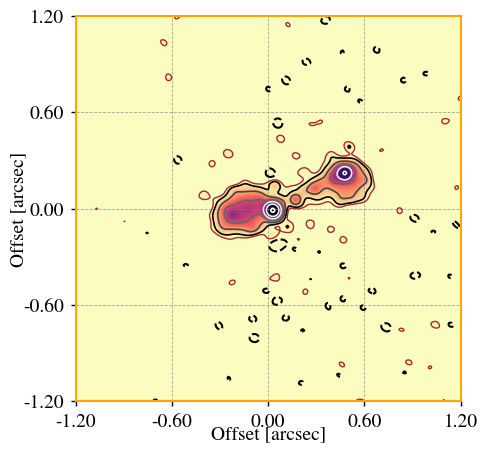

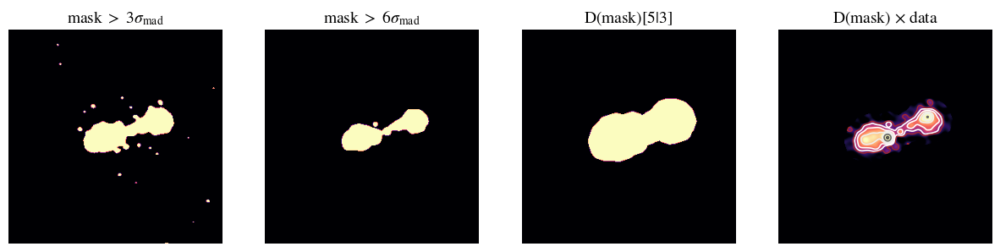

In [34]:
# lets select another image from our list of images. 
# idx = 0 #select one index from the list. 
# input_data=mp.read_data(filename=imagelist_2_c[idx],
#                         residualname=residuallist_2_c[idx])
idx = 1#select one index from the list. 
input_data=mp.read_data(filename=MFS_images_c[idx],
                        residualname=MFS_residuals_c[idx])
mlibs.eimshow(input_data.filename,rms=input_data.rms_res)


std = mlibs.mad_std(input_data.residual_data_2D)
_, mask = mlibs.mask_dilation(input_data.image_data_2D, 
                              PLOT=True,dilation_type='disk',
                              sigma=6, iterations=3, dilation_size=None)


                                                          ..___|**_
                                                  .|||||||||*+@+*__*++.
                                              _||||.           .*+;].,#_
                                         _|||*_                _    .@@@#@.
                                   _|||||_               .@##@#| _||_
       Morphen                |****_                   .@.,/\..@_.
                             #///#+++*|    .       .@@@;#.,.\@.
                              .||__|**|||||*||*+@#];_.  ;,;_
 Geferson Lucatelli                            +\*_.__|**#
                                              |..      .]]
                                               ;@       @.*.
                                                #|       _;]];|.
                                                 ]_          _+;]@.
                                                 _/_             |]\|    .  _
                                              ...._@* __ .

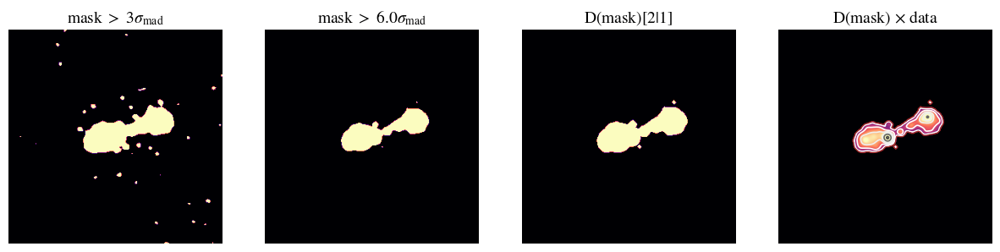

<Figure size 500x500 with 0 Axes>

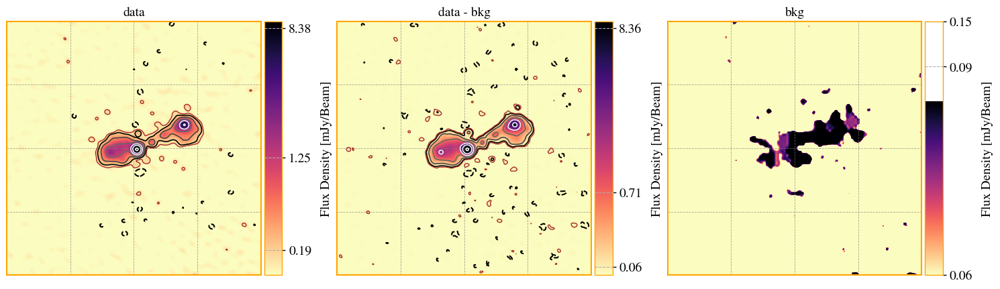

Deblending:   0%|          | 0/1 [00:00<?, ?it/s]

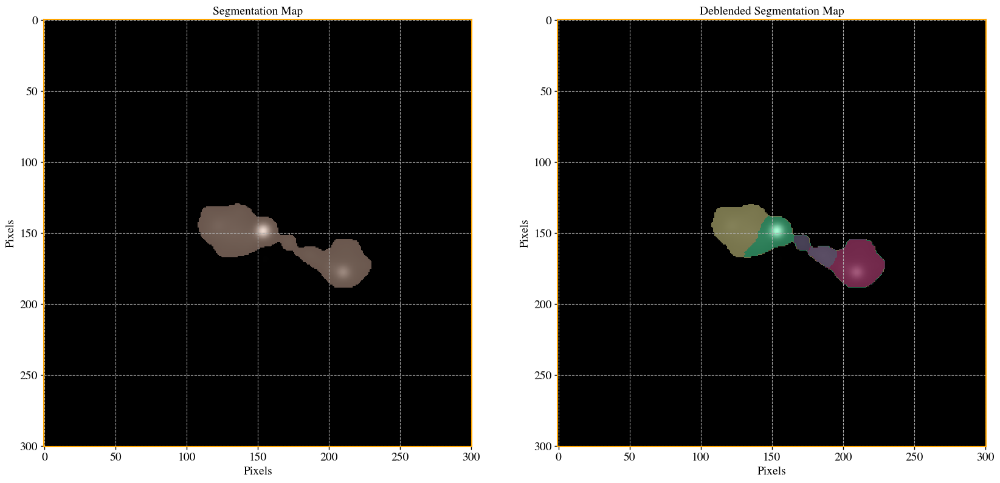

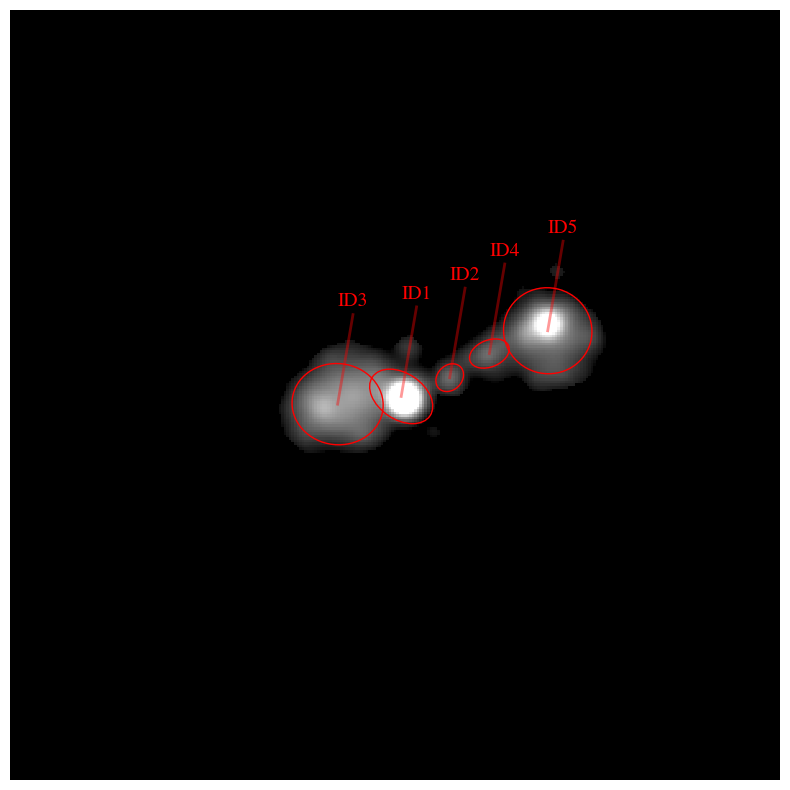

In [35]:
reload_libs()
#this is a set of parameters that may work OKAY
bwf, bhf = 2, 2 # standard value that works for a wide range of images. But, additional check is required!!!!
fwf, fhf = 2, 2 # standard value that works for a wide range of images. But, additional check is required!!!!
clean_param = 0.99
deblend_cont = 1e-5
deblend_nthresh = 50
sigma_mask = 6.0
sigma = 6.0
minarea_factor = 0.5
ell_size_factor = 2
SE = mp.source_extraction(input_data, 
                          ell_size_factor = ell_size_factor, sigma = sigma,
                          algorithm='PF',
                          bwf = bwf,bhf = bhf,fwf = fwf, fhf = fhf,
                          clean_param = clean_param, 
                          deblend_cont = deblend_cont, 
                          deblend_nthresh=deblend_nthresh,minarea_factor=minarea_factor,
                          apply_mask=True,sigma_mask=sigma_mask,
                          show_petro_plots=True,show_bkg_map=True,
                          sort_by = 'distance',threshold_mode = 'sigma',
                          dilation_size=2,
                          dry_run=True)


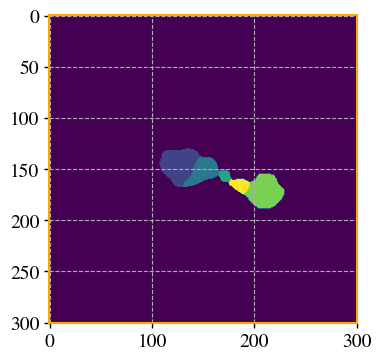

In [36]:
mlibs.plt.imshow(SE.seg_maps)

7.50000000000009


Deblending:   0%|          | 0/1 [00:00<?, ?it/s]

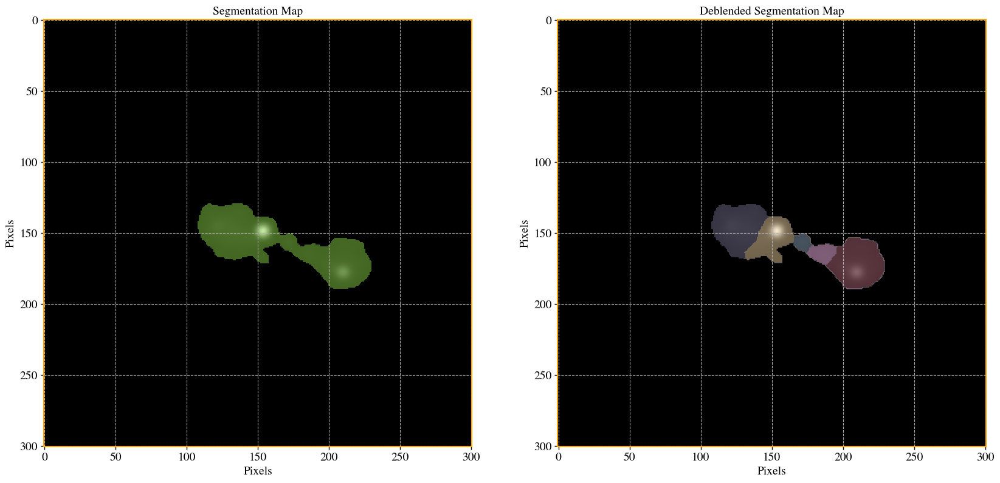

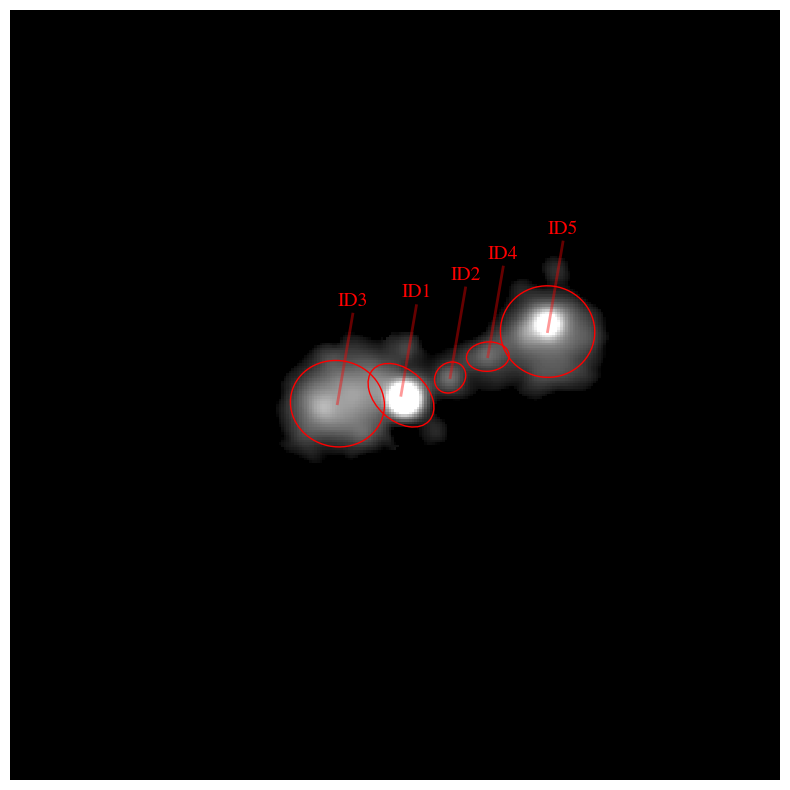

1


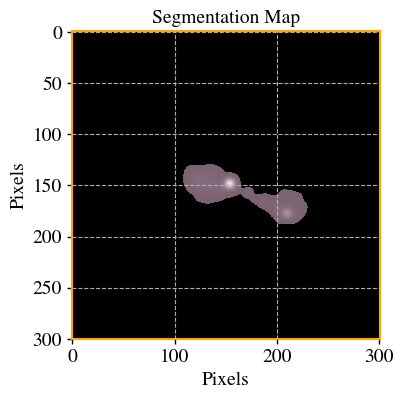

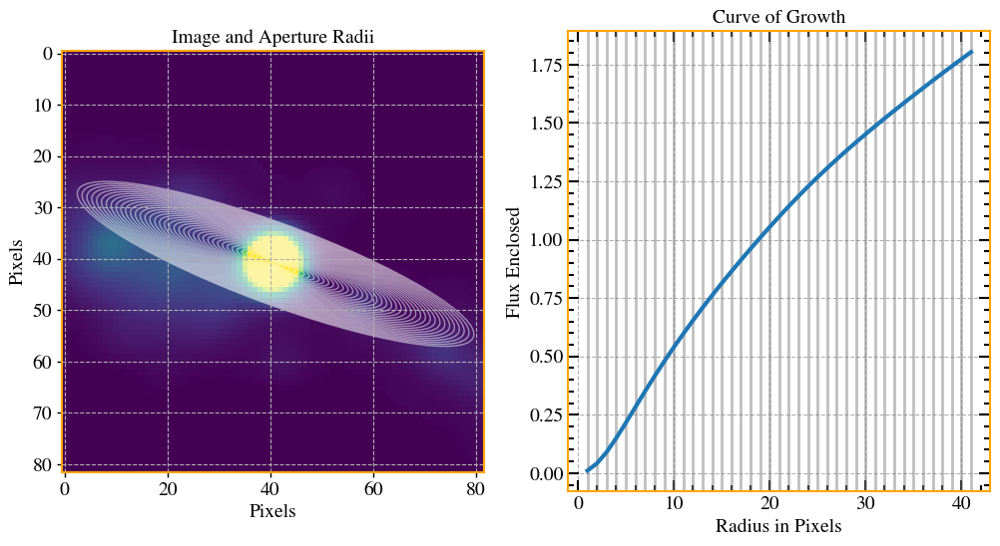

1


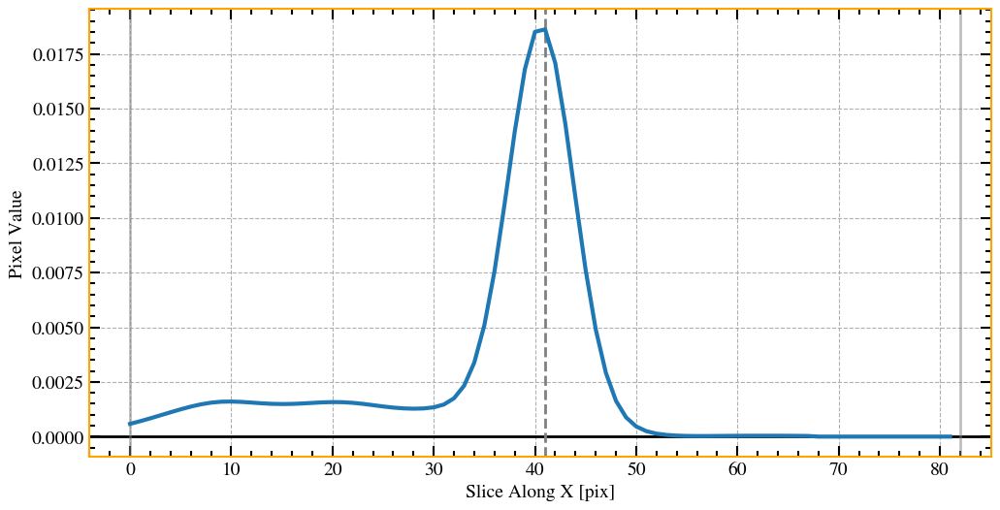

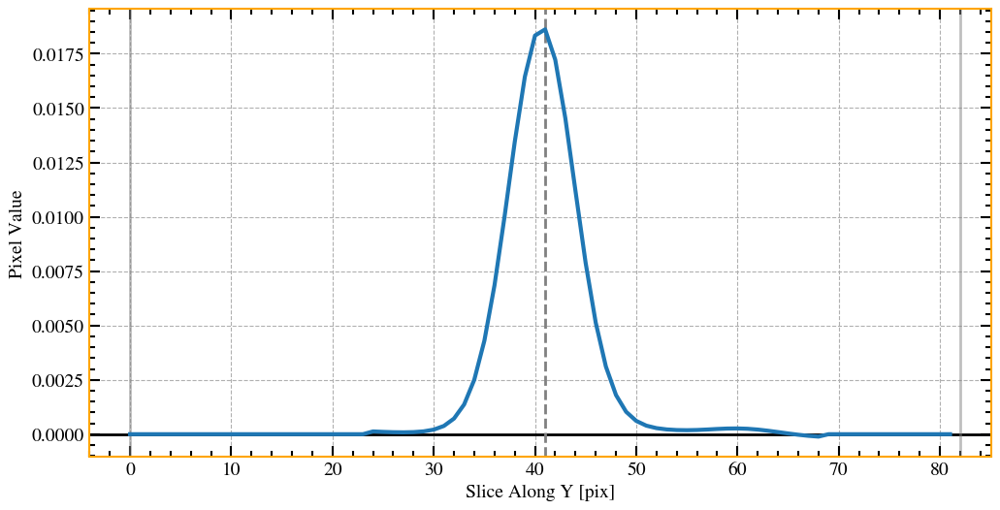

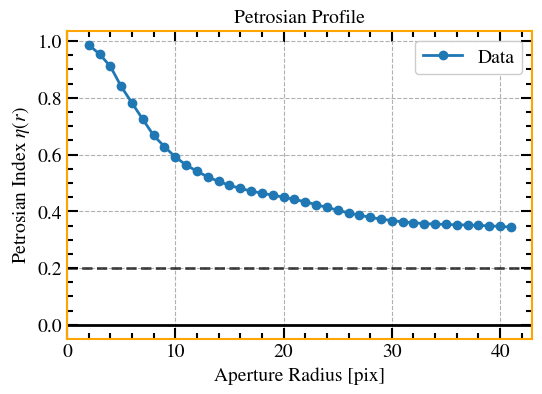

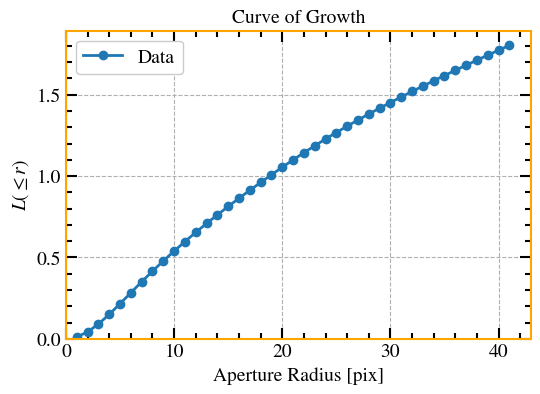

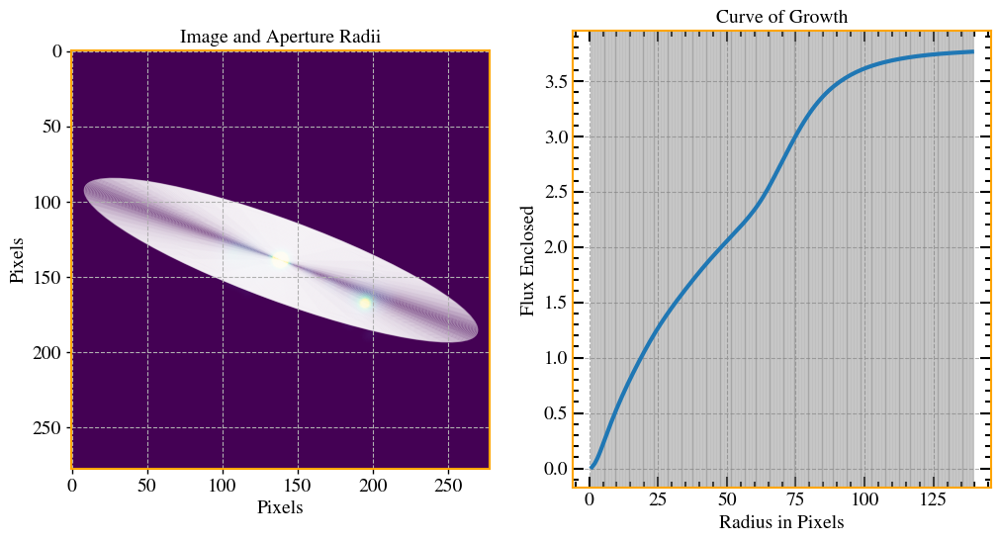

1


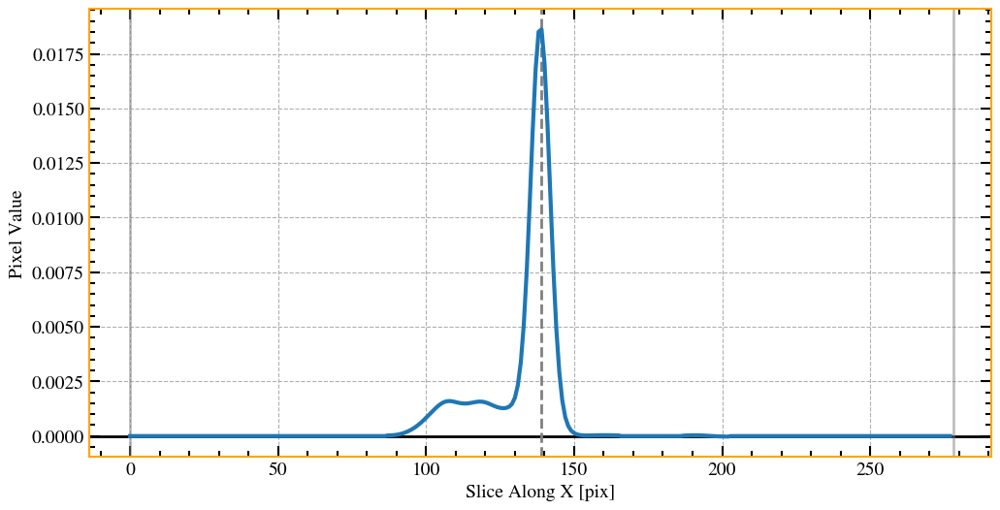

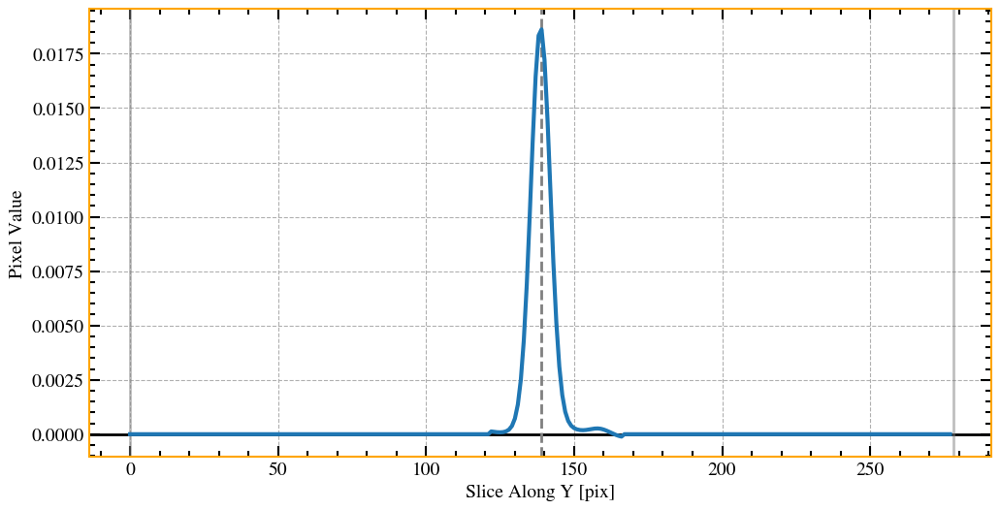

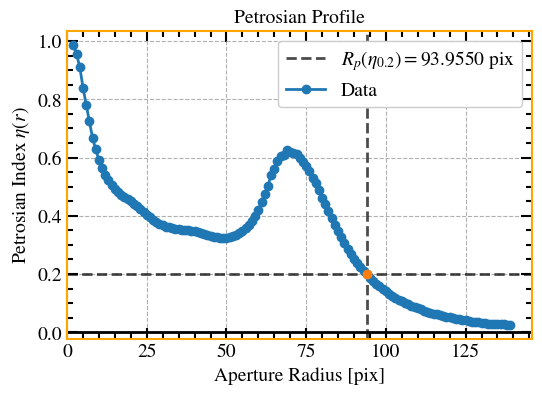

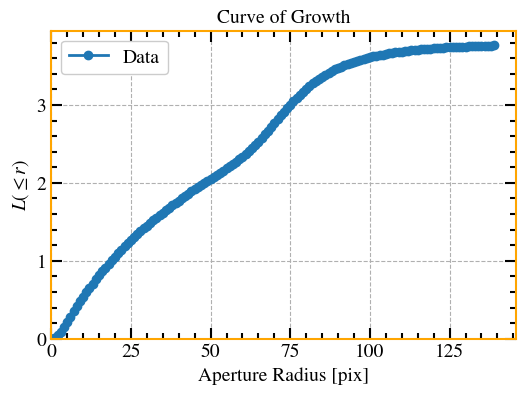

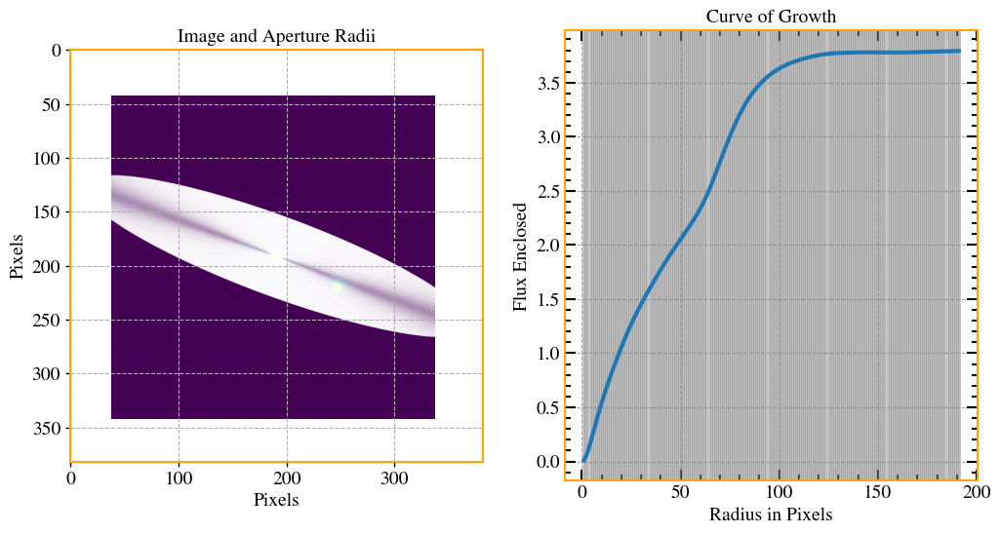

  0%|                                                     | 0/5 [00:00<?, ?it/s]

1


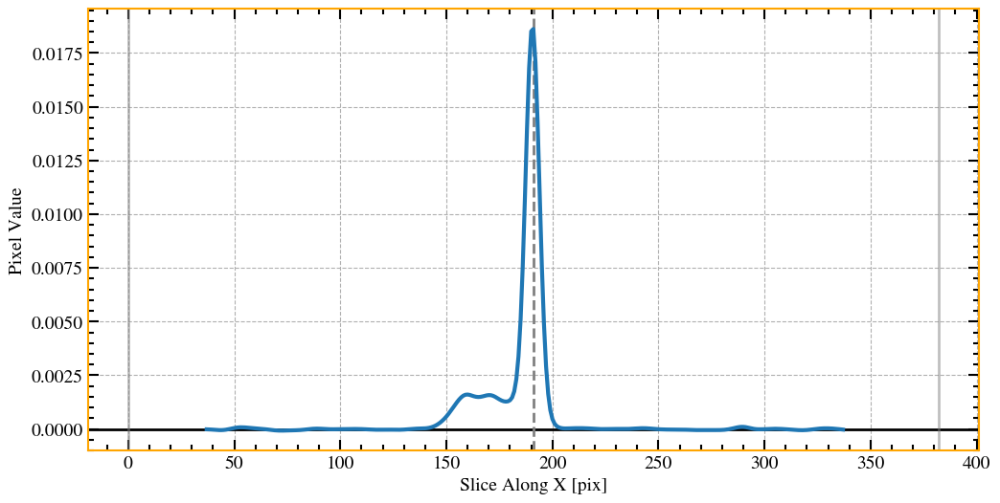

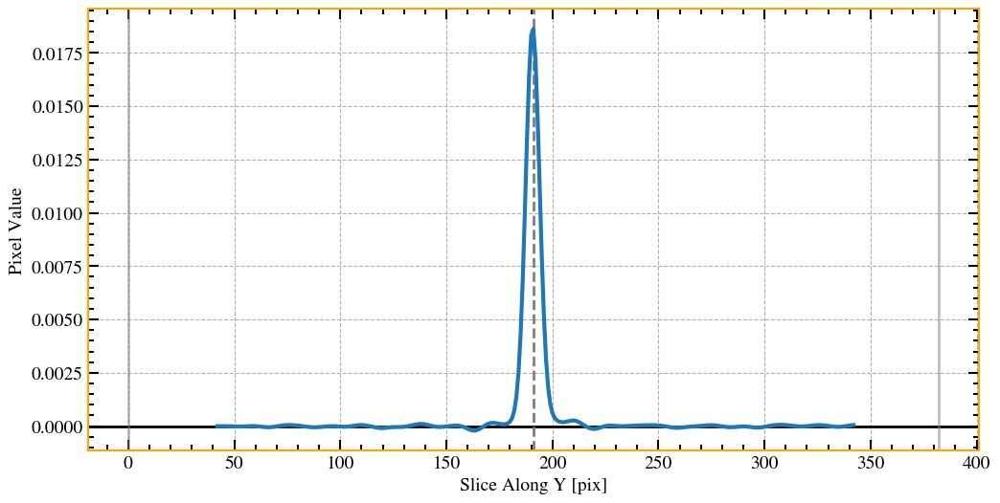

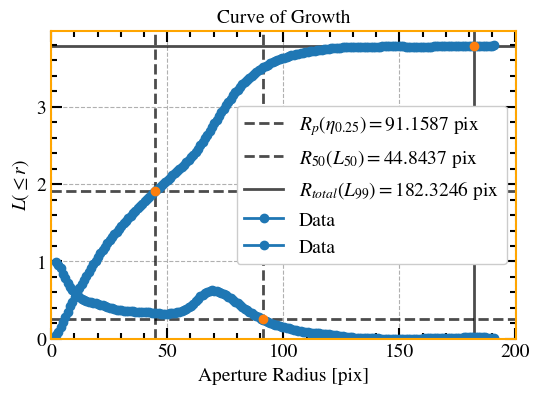

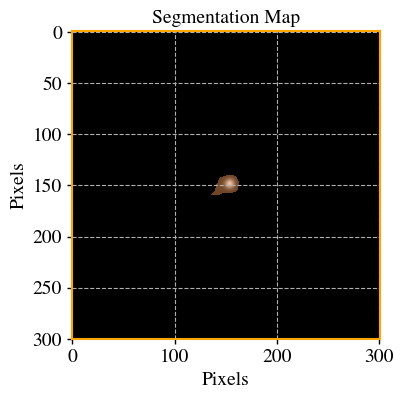

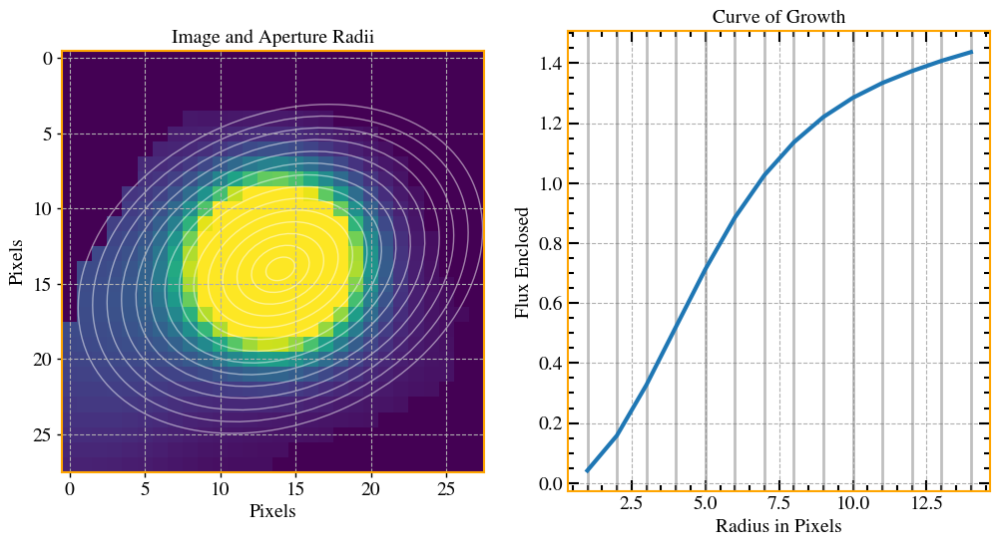

1


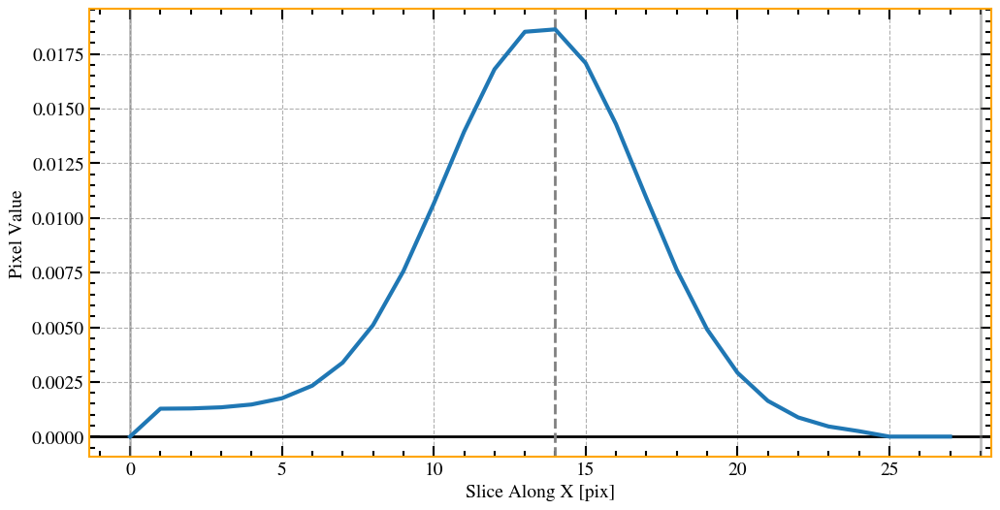

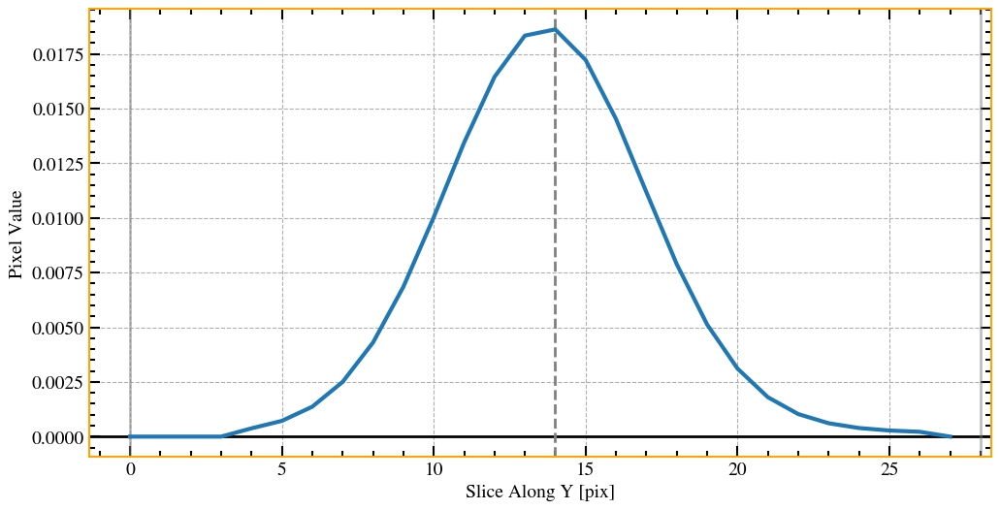

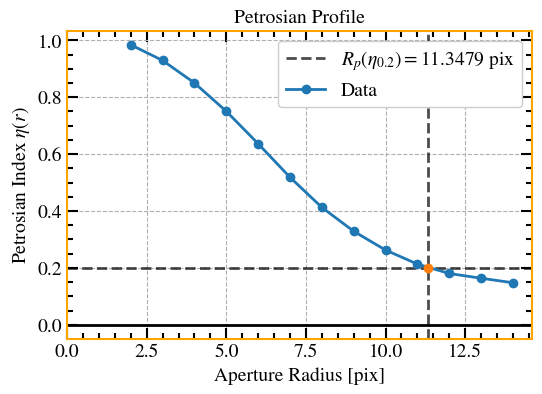

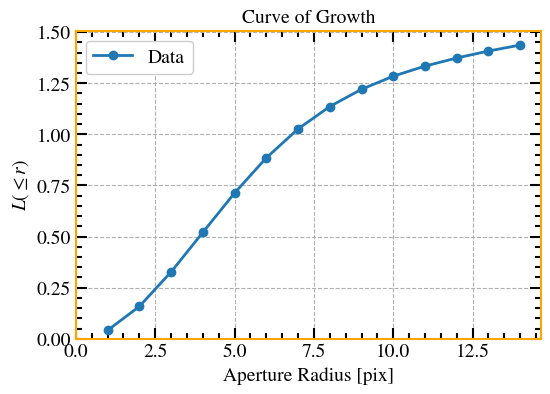

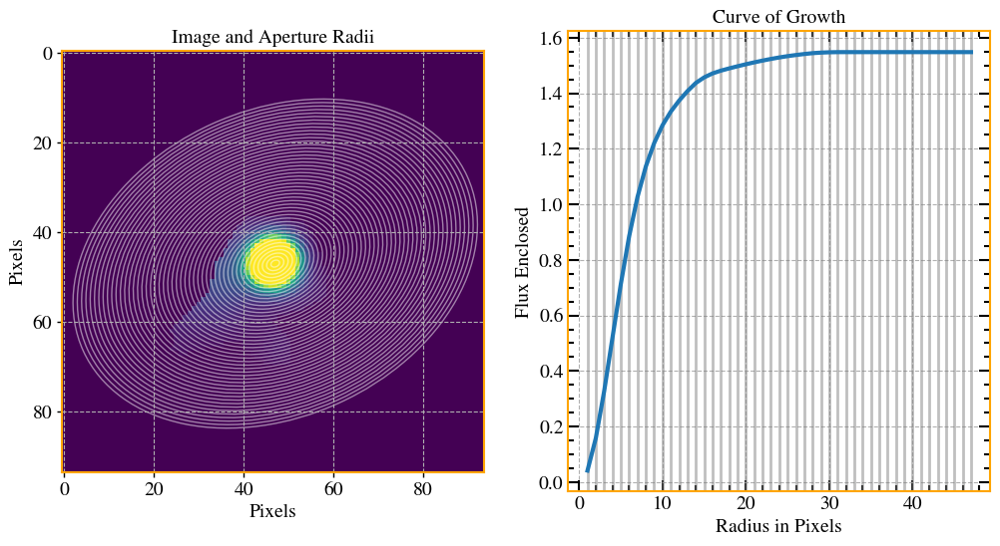

 20%|█████████                                    | 1/5 [00:07<00:30,  7.70s/it]

1


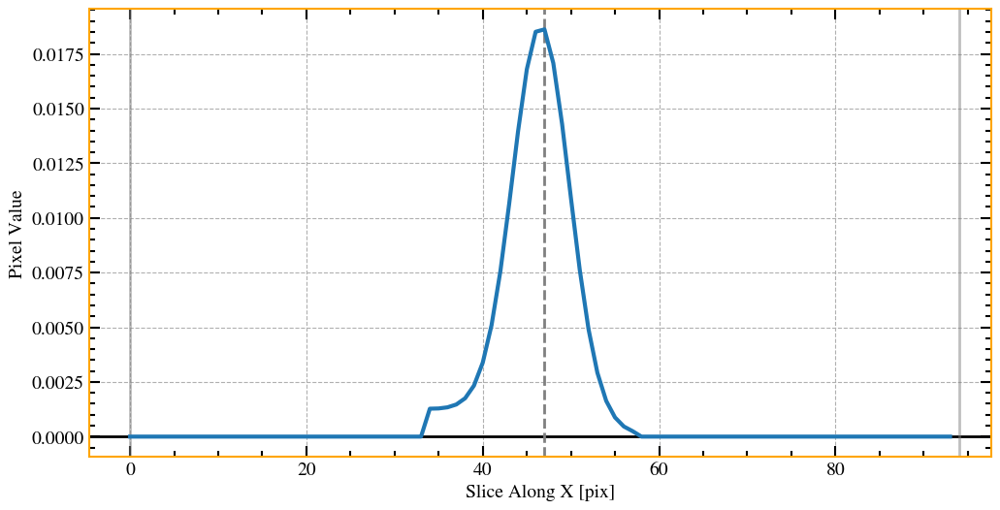

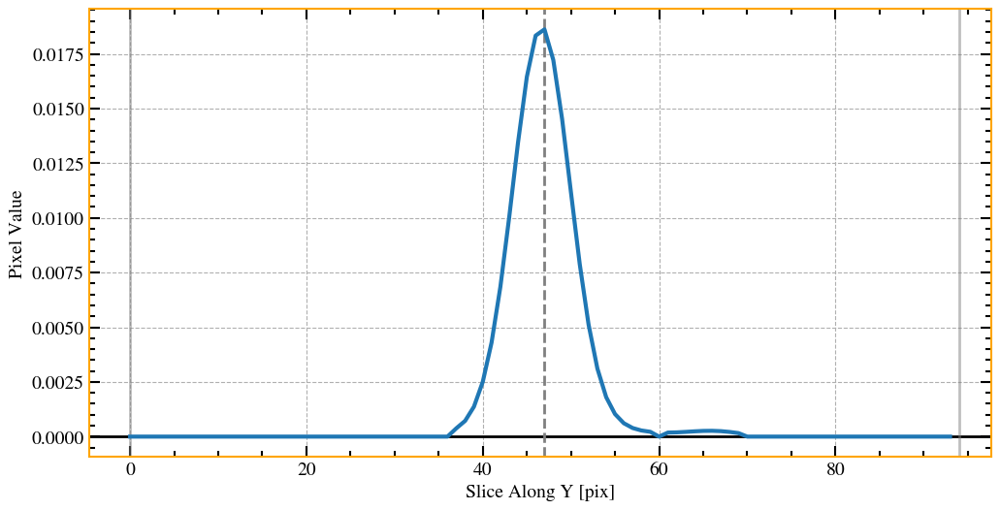

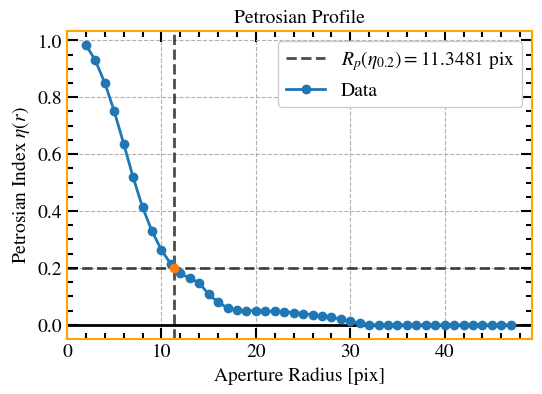

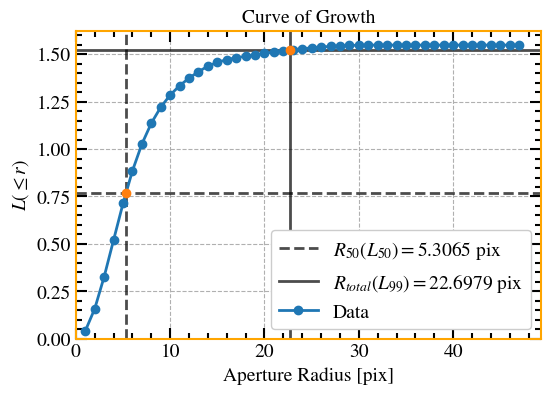

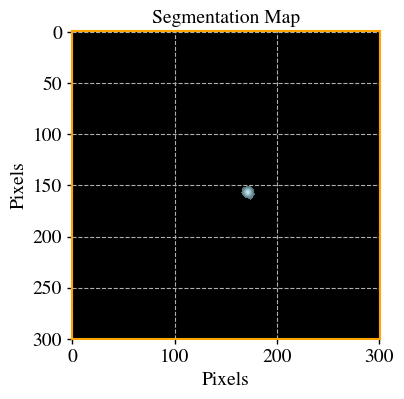

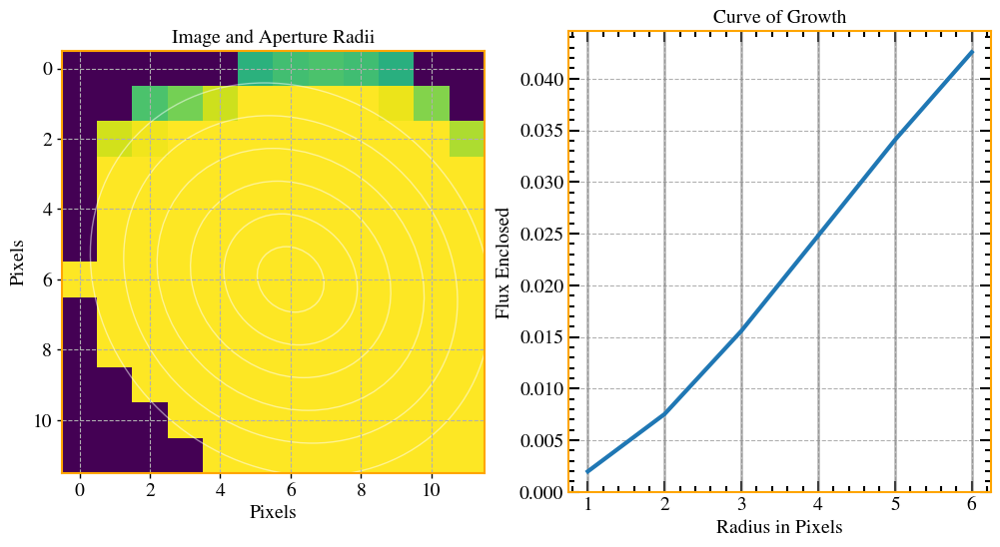

1


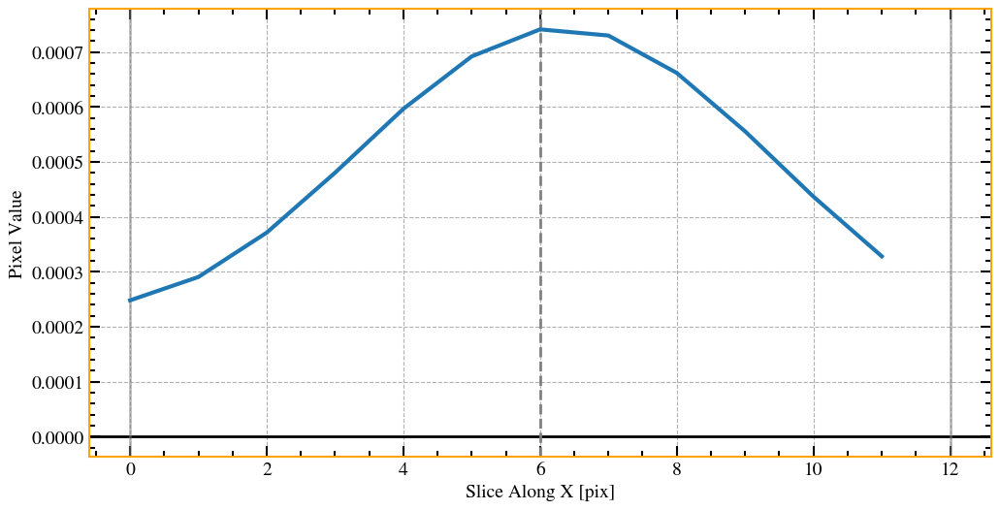

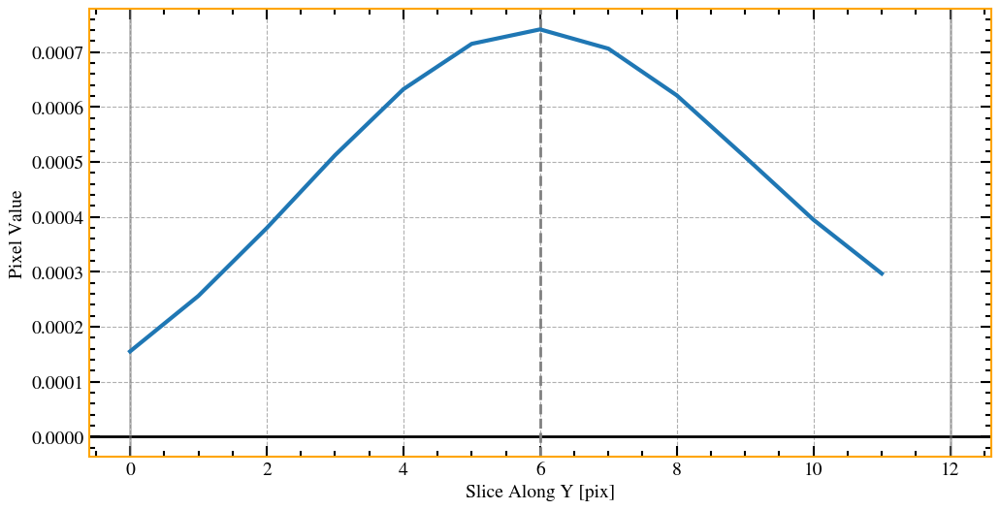

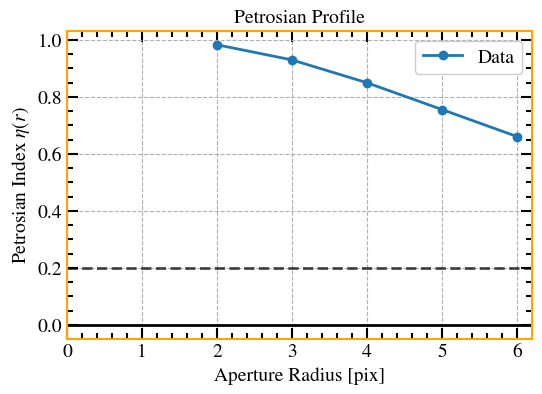

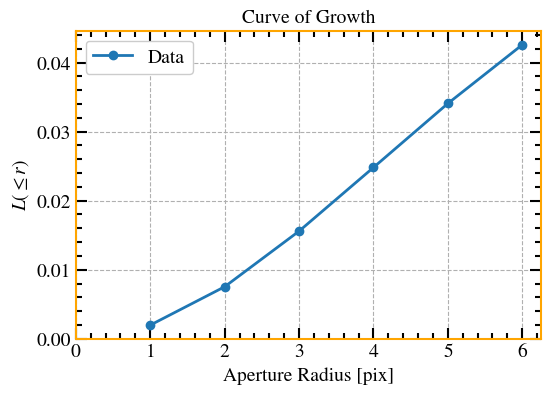

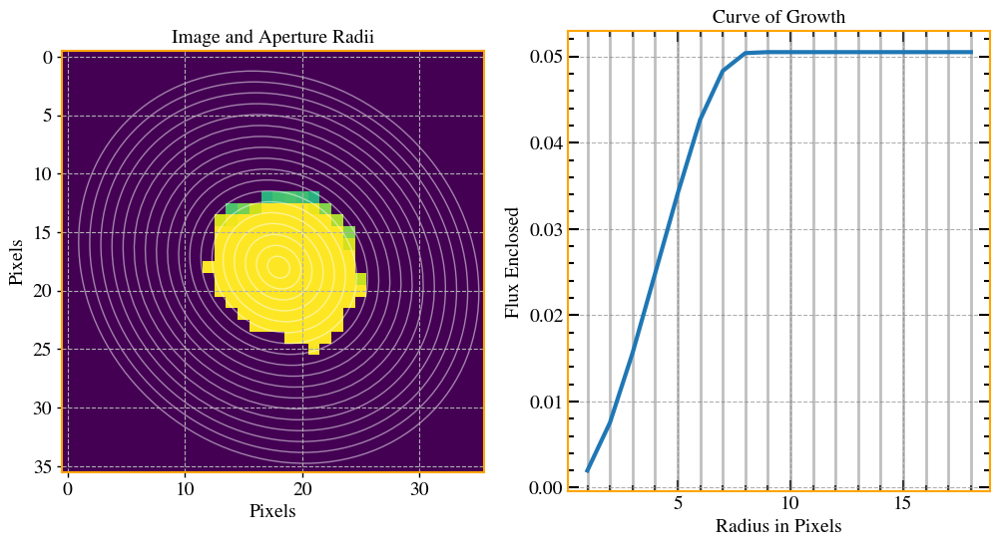

 40%|██████████████████                           | 2/5 [00:13<00:20,  6.78s/it]

1


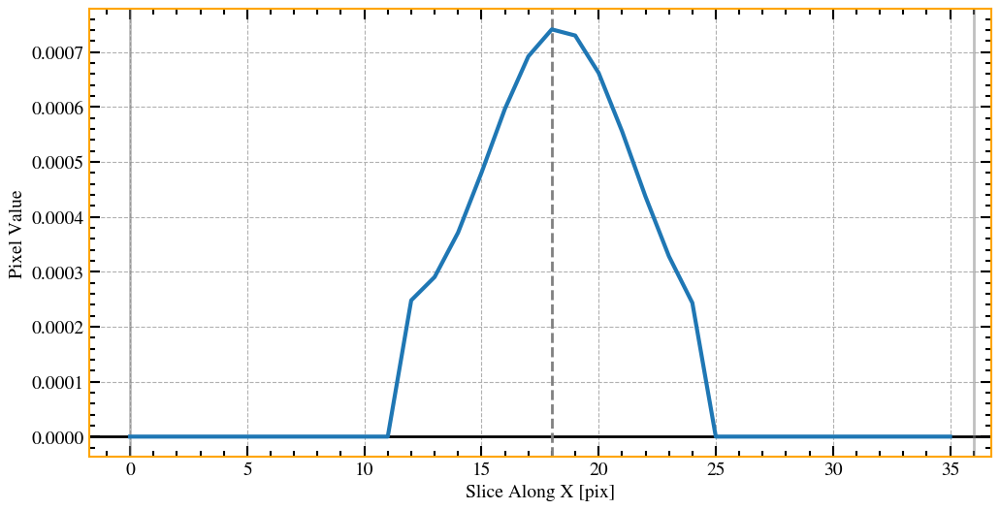

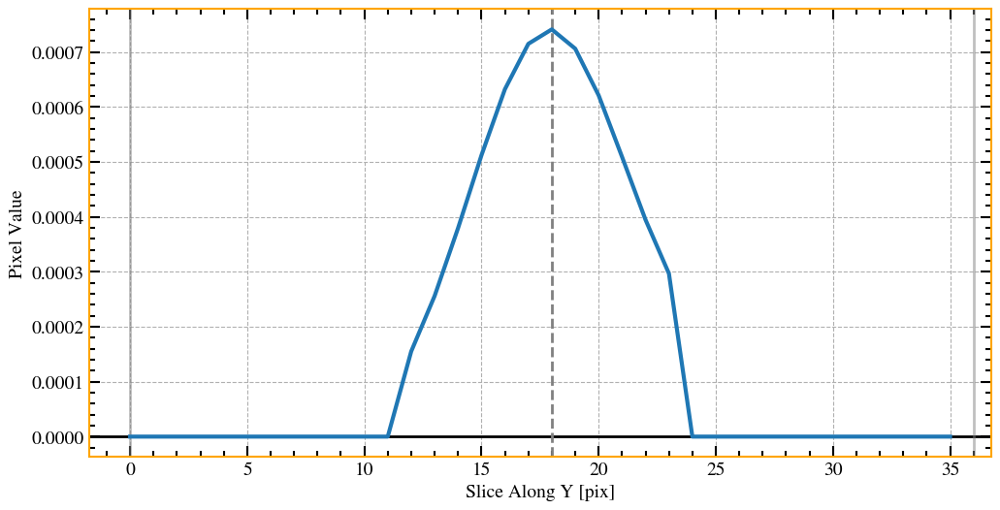

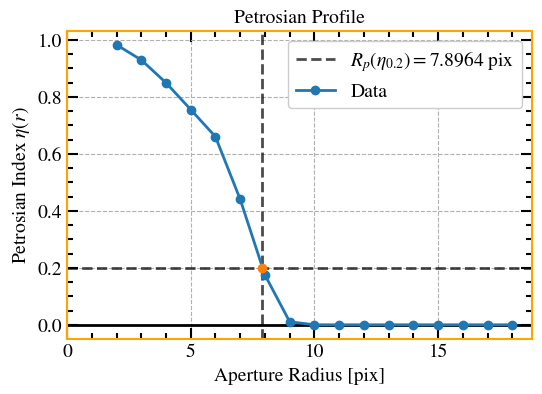

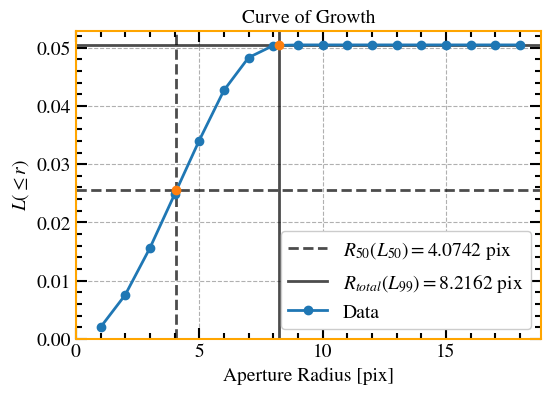

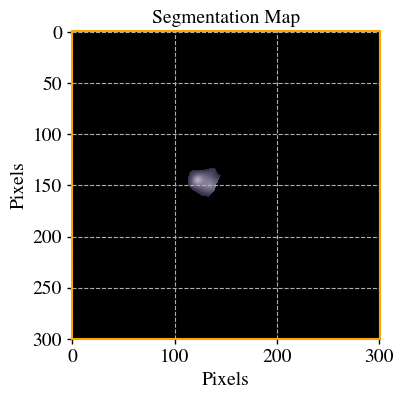

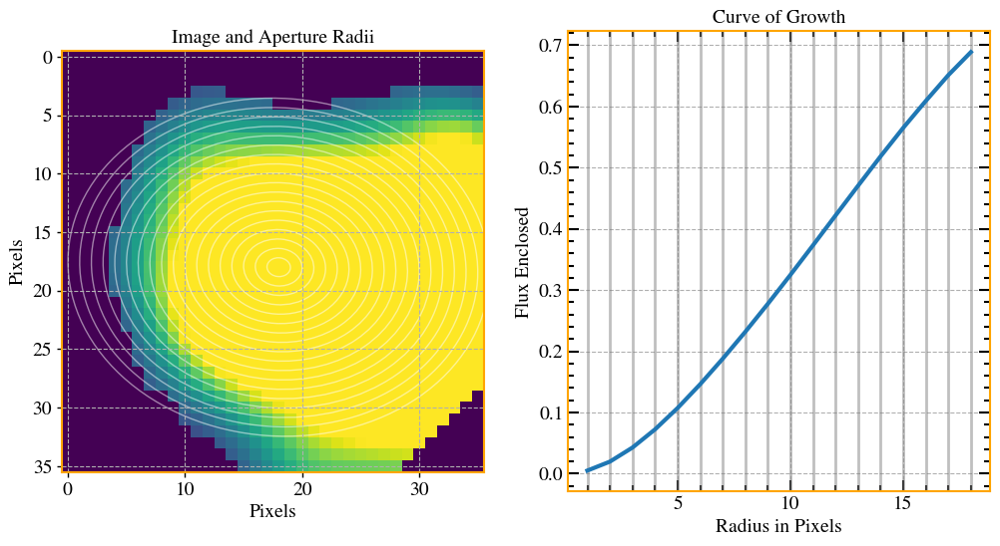

1


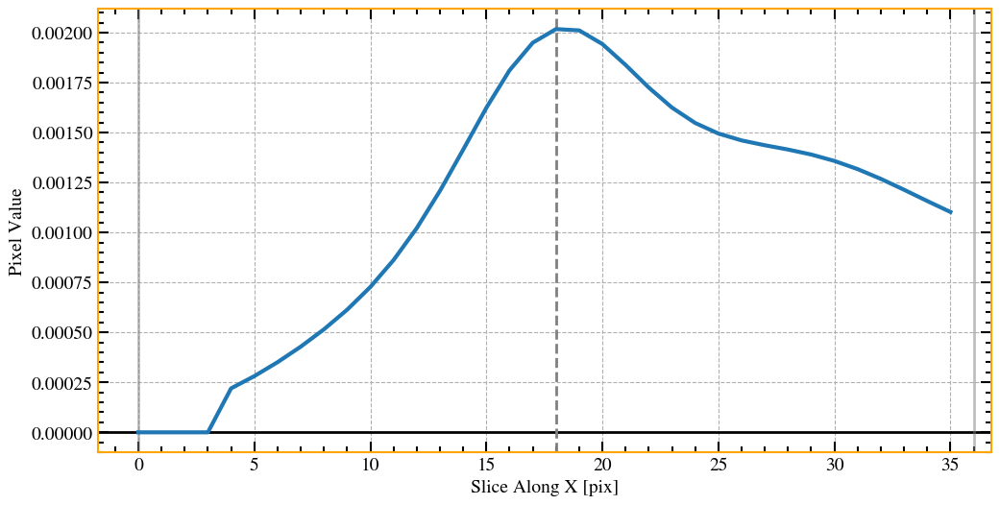

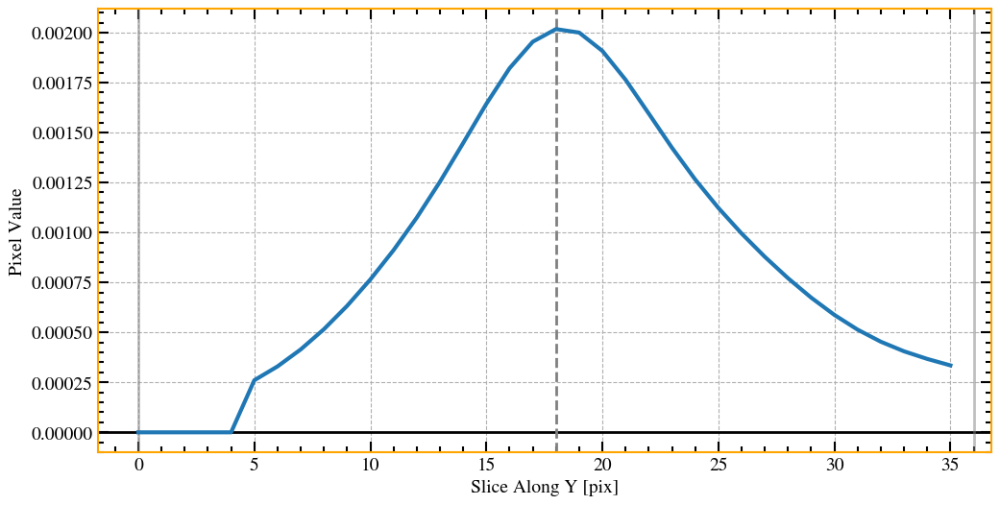

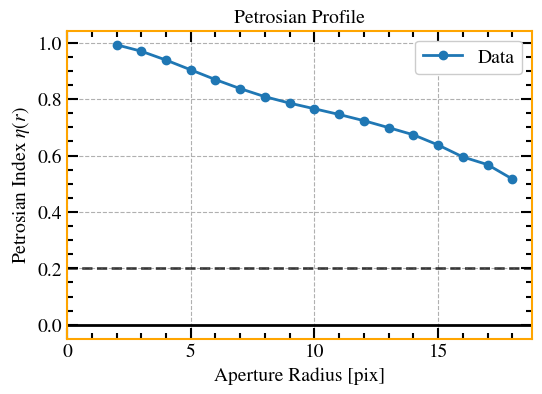

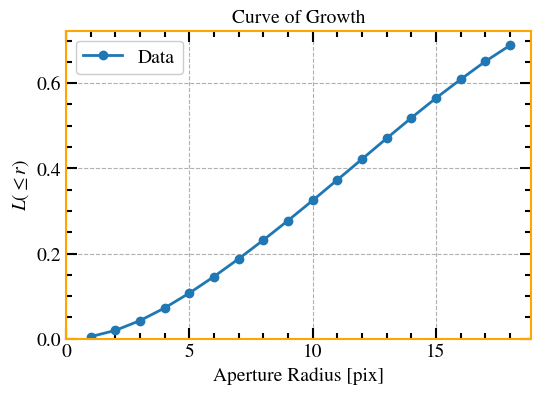

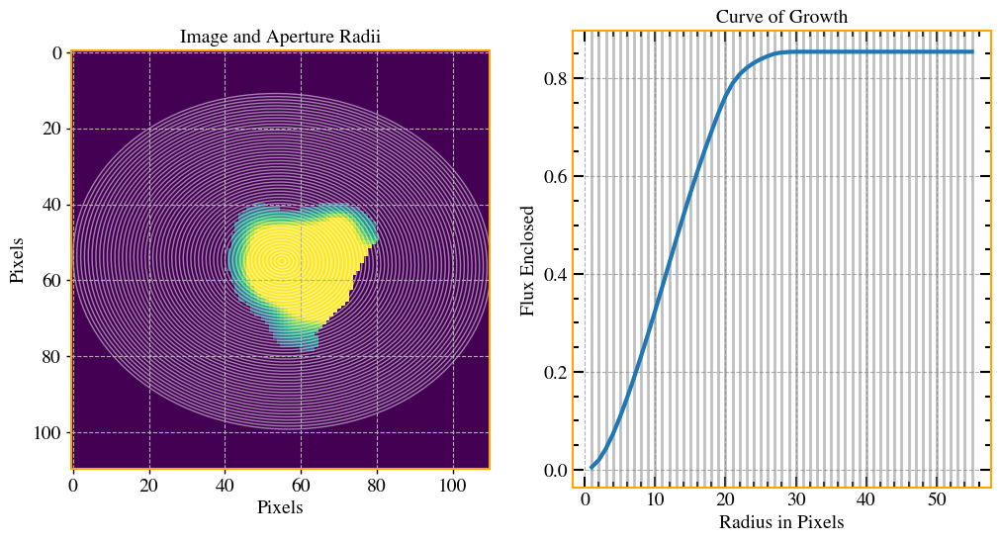

 60%|███████████████████████████                  | 3/5 [00:19<00:12,  6.21s/it]

1


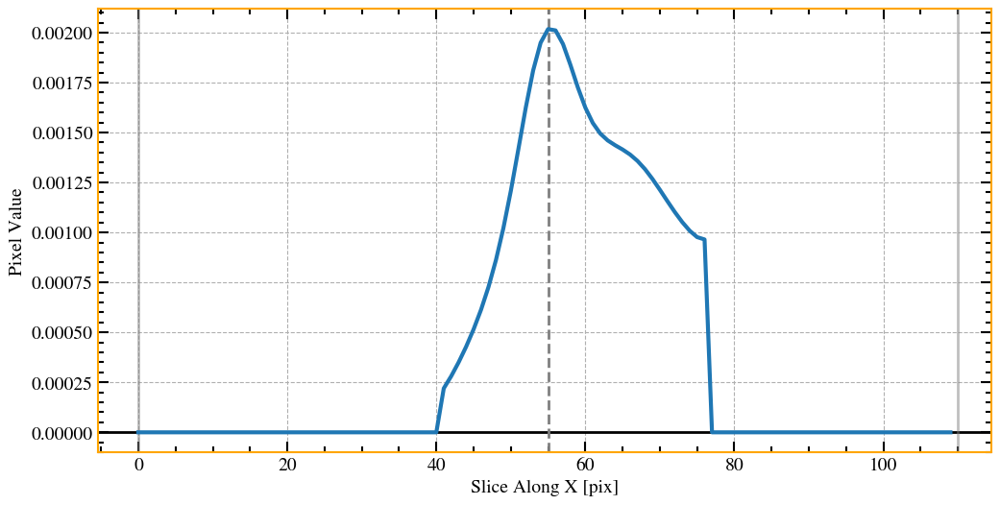

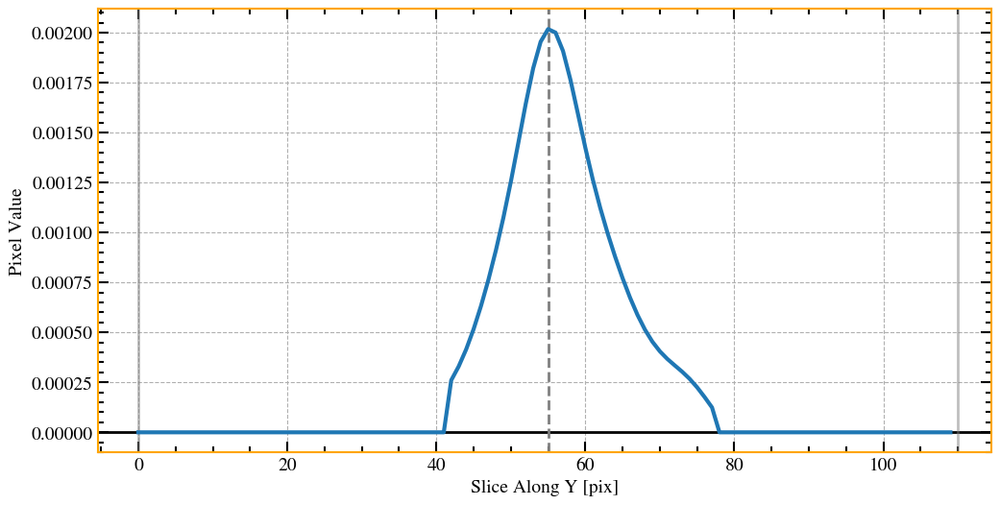

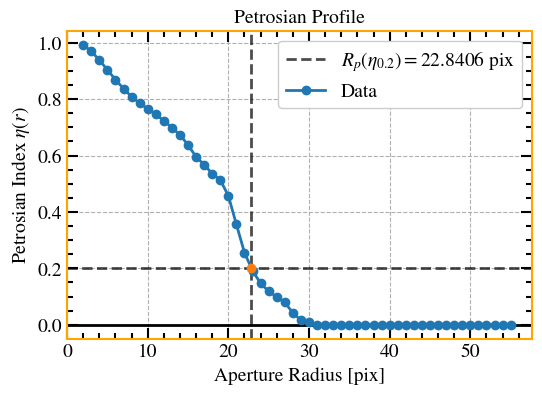

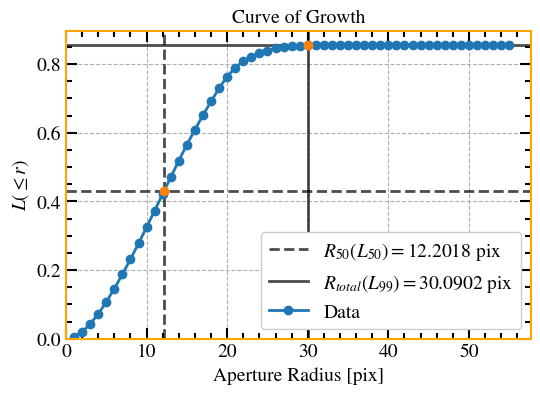

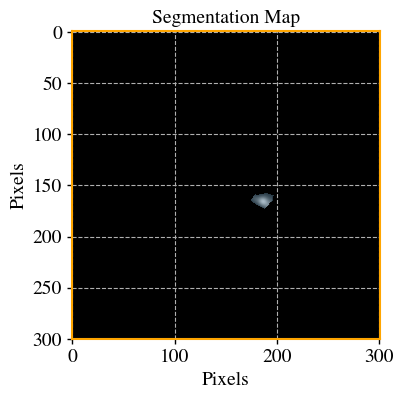

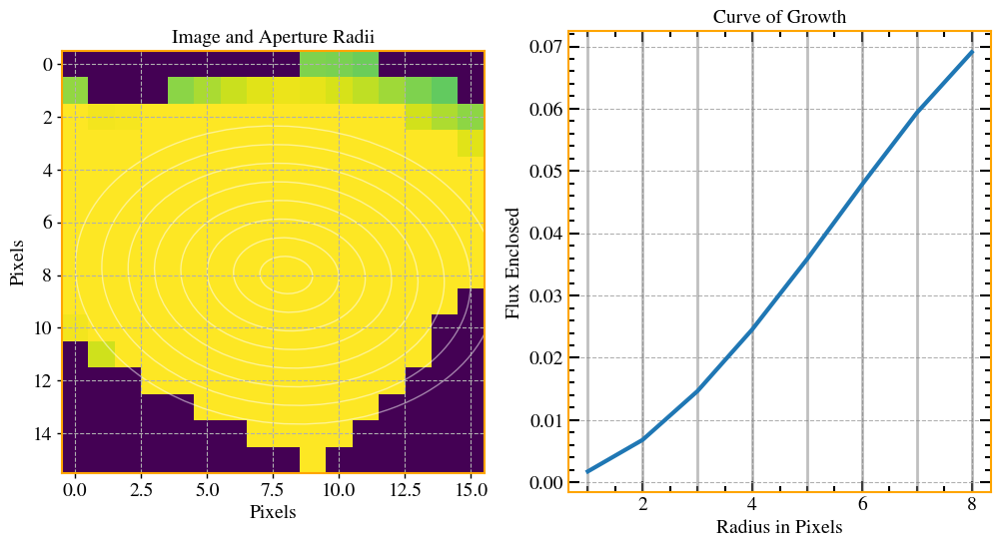

1


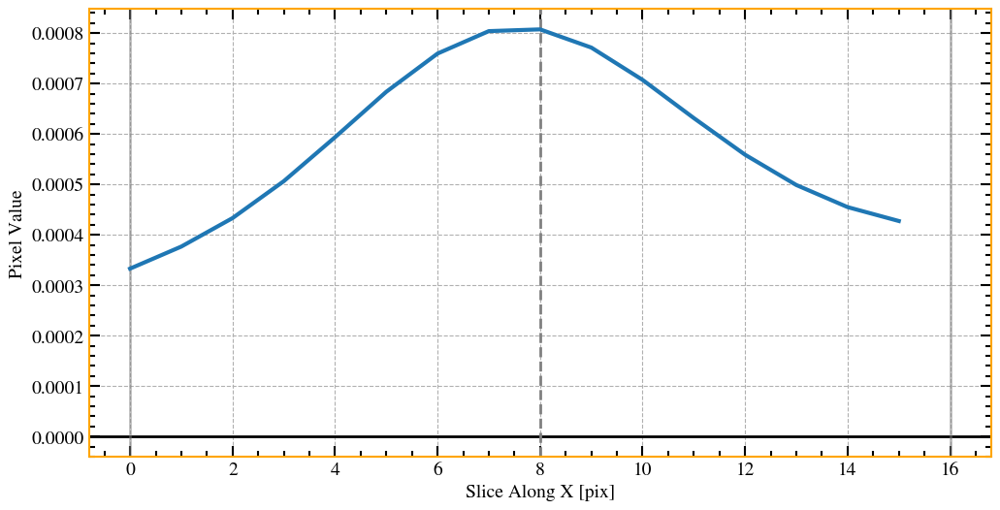

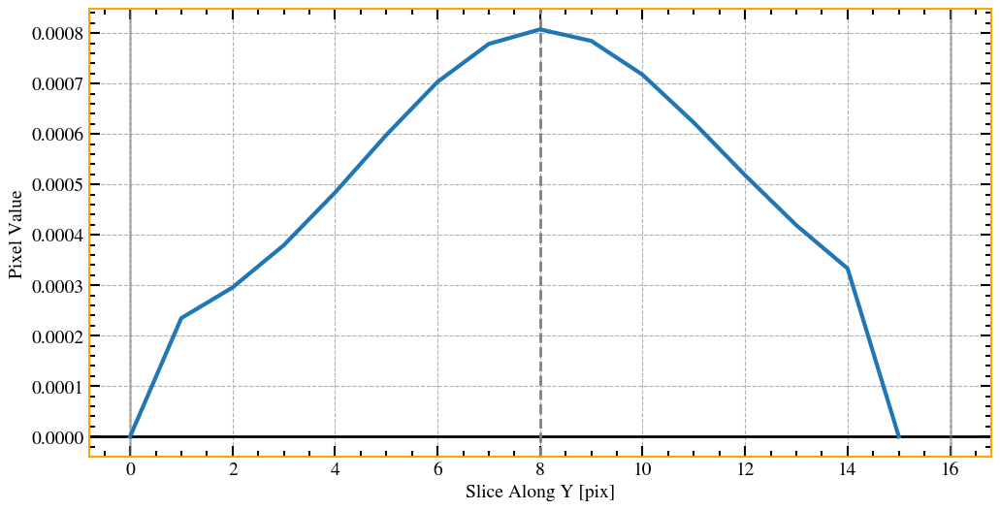

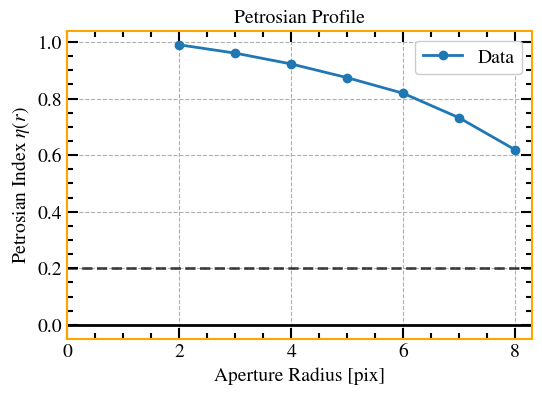

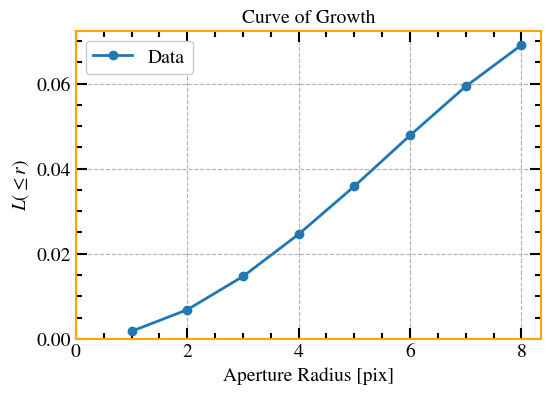

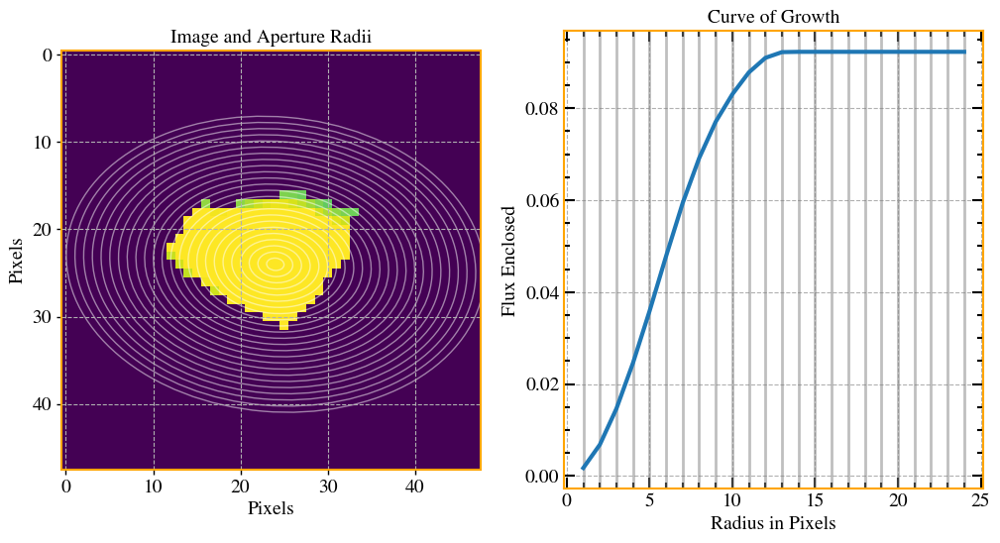

1


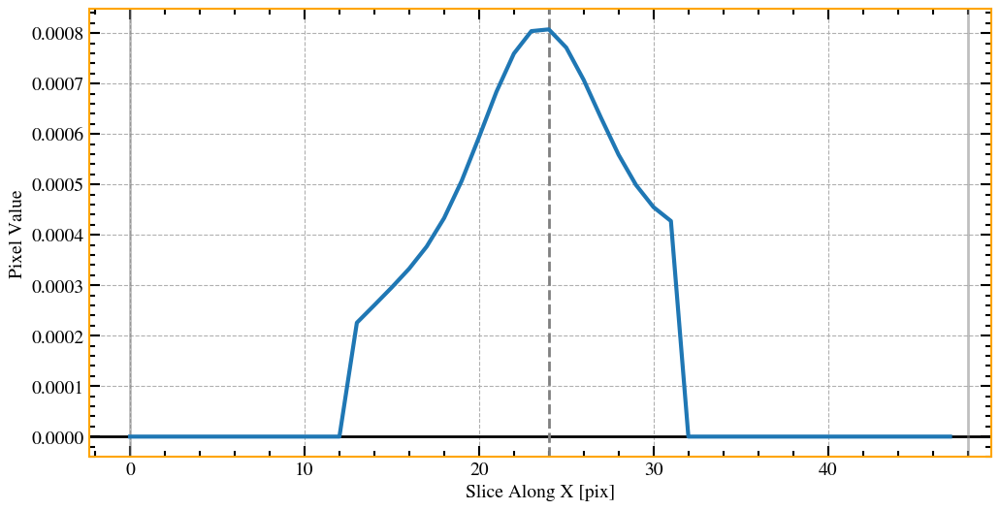

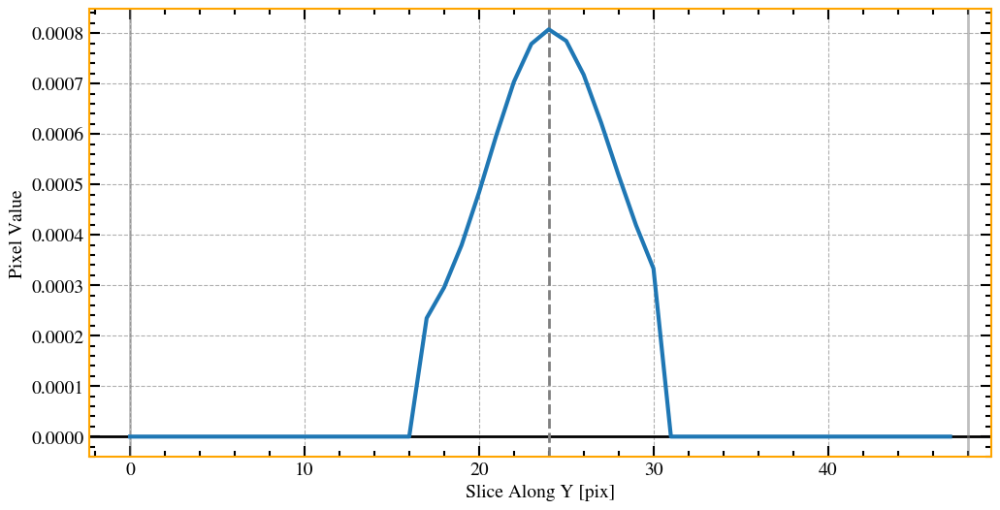

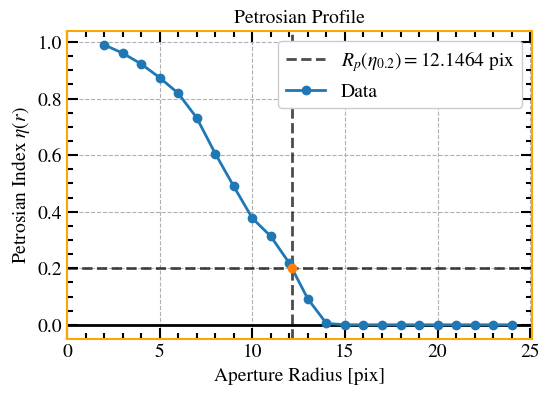

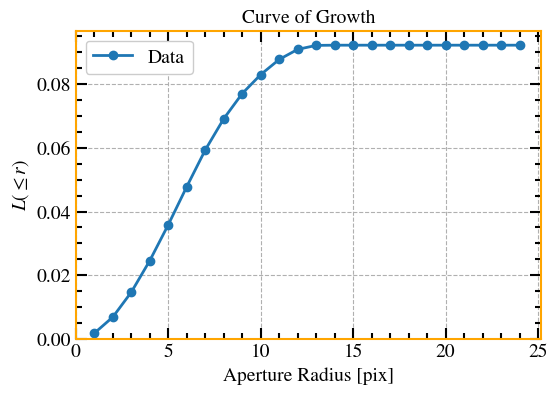

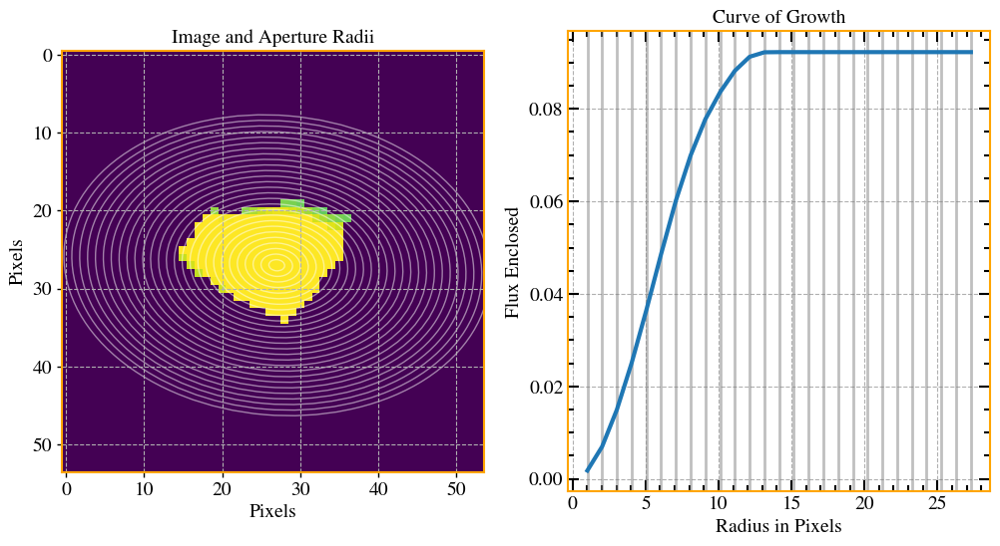

 80%|████████████████████████████████████         | 4/5 [00:26<00:06,  6.70s/it]

1


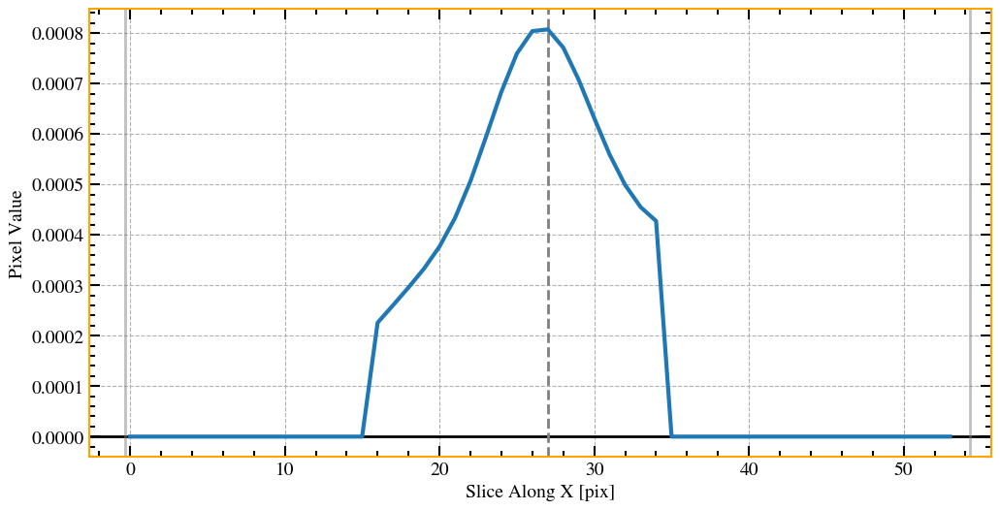

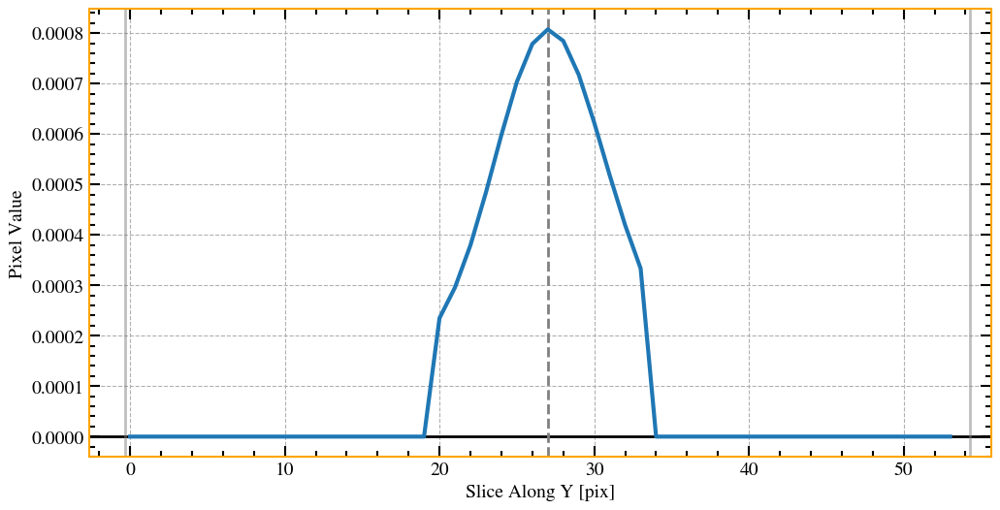

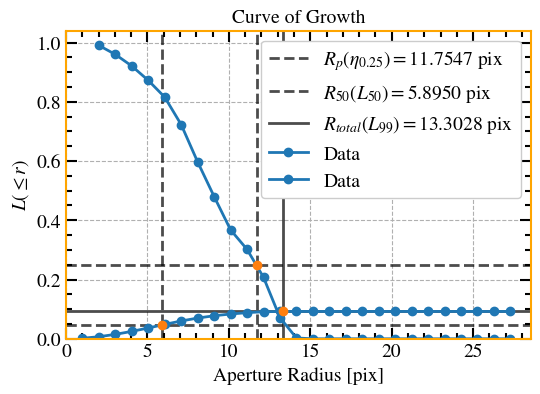

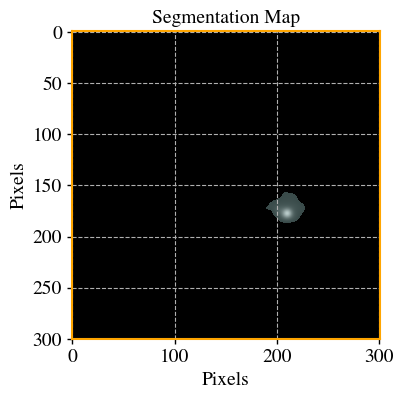

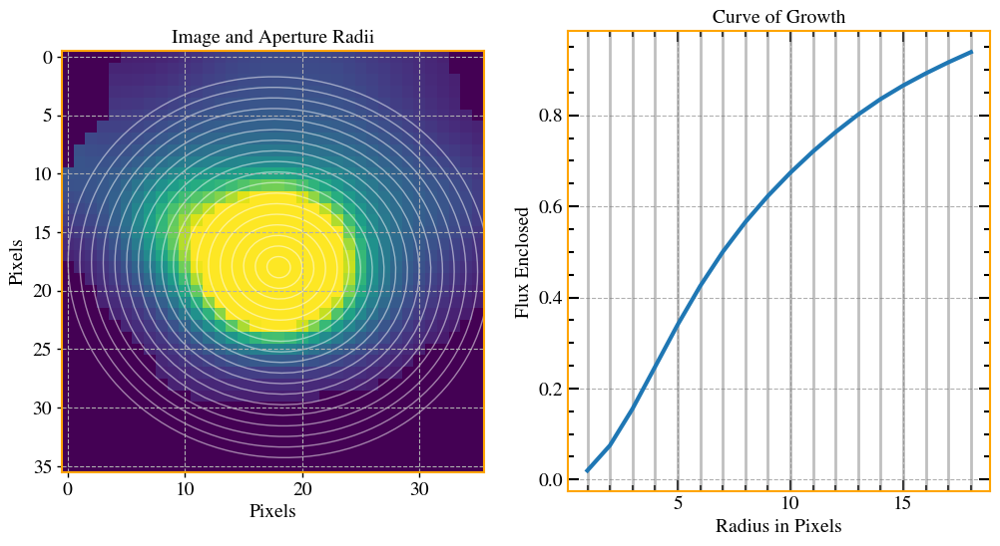

1


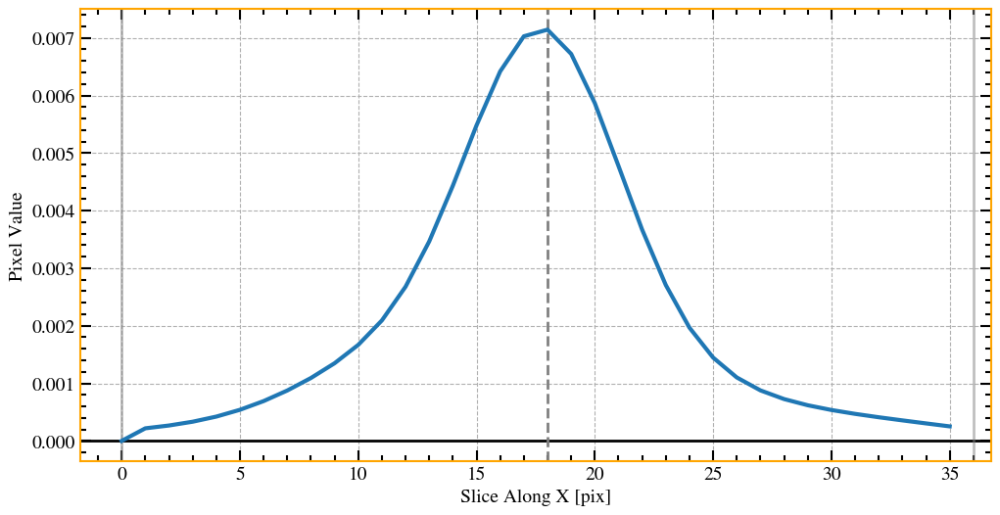

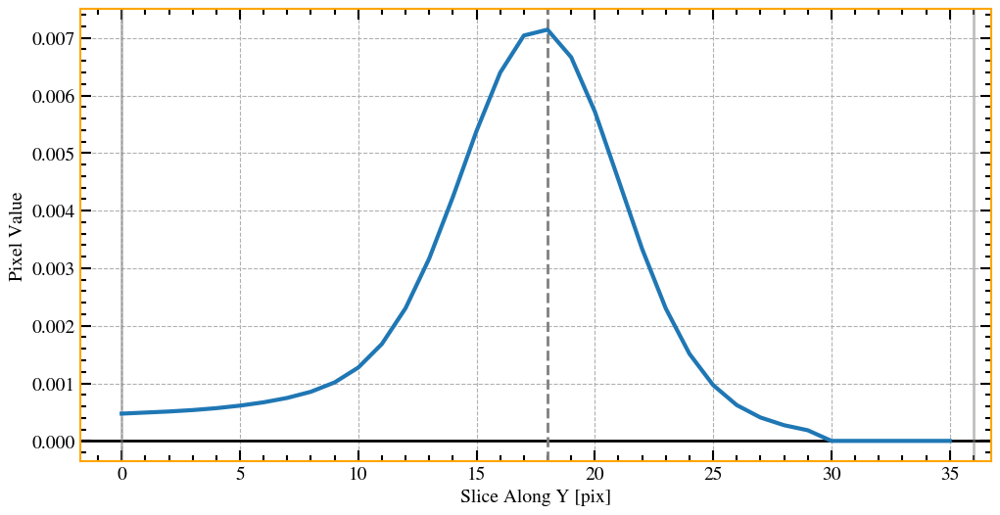

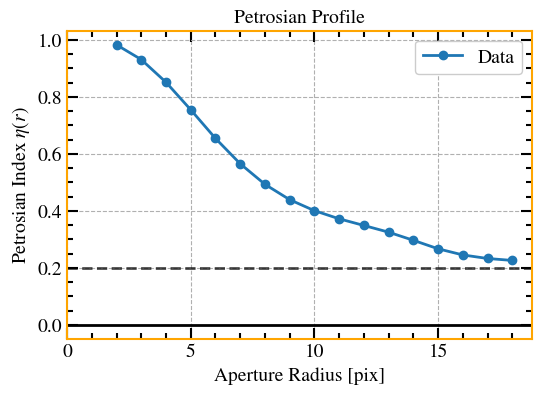

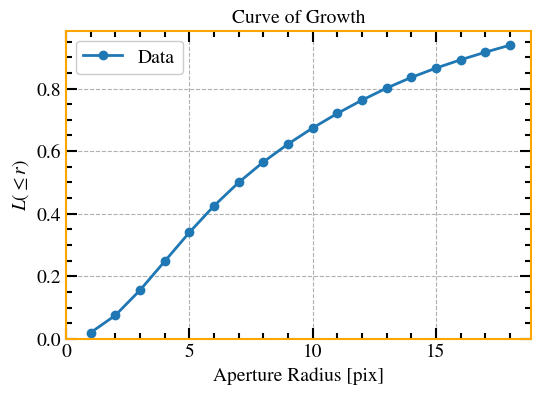

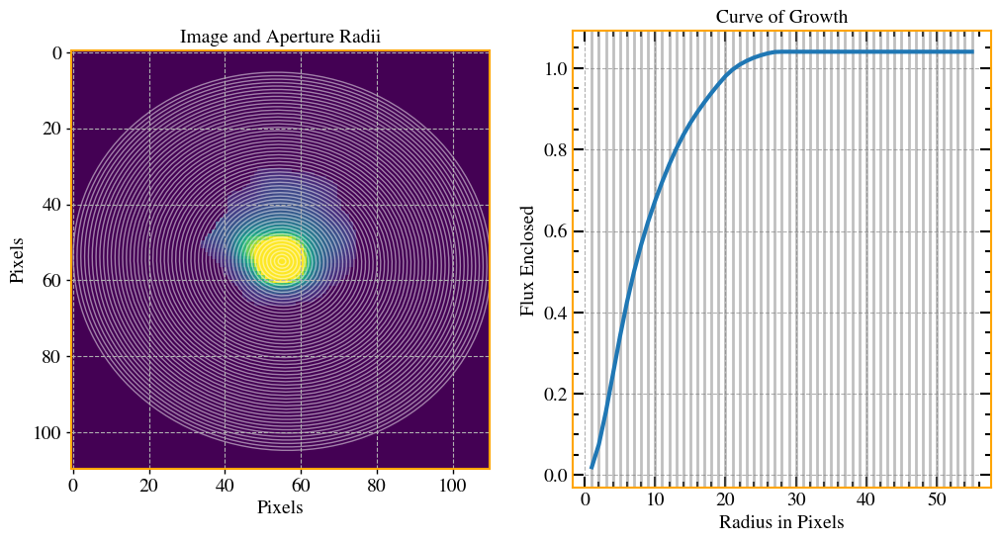

100%|█████████████████████████████████████████████| 5/5 [00:32<00:00,  6.41s/it]


INFO: Using Elliptical Gaussian for Gaussian beam convolution.


2025-06-24 00:05:07	WARN	componentlist::close	componentlist closed


# of structures (IDs) to be fitted = 5
['PA', 'q', 'area', 'Re', 'x0c', 'y0c', 'label', 'R50', 'R20', 'R80', 'C1', 'Snu', 'Rp', 'Rpidx', 'rlast', 'I50']
4.889985196465031
['PA', 'q', 'area', 'Re', 'x0c', 'y0c', 'label', 'R50', 'R20', 'R80', 'C1', 'Snu', 'Rp', 'Rpidx', 'rlast', 'I50']
7.2696960400055435
<> Leaving components to be elliptical.
<> q =  0.5
<> q =  0.5
<> q =  0.5
<> q =  0.5
<> q =  0.5
<> q =  0.5
<> q =  0.5
# of model components (COMPS) to be fitted = 7


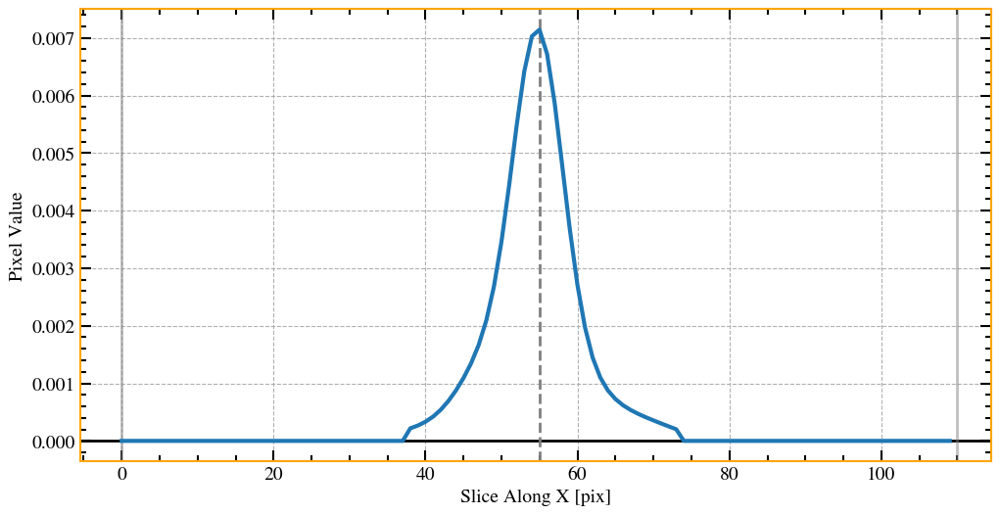

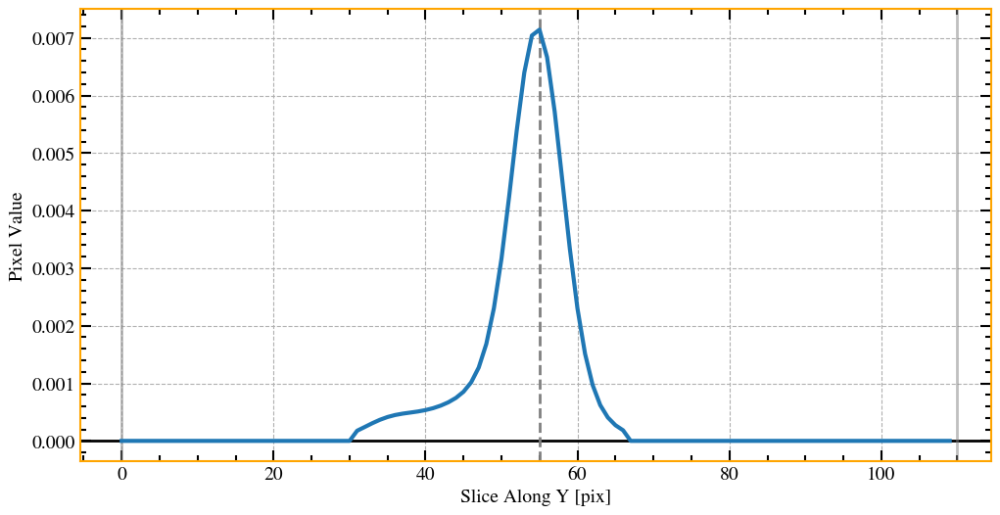

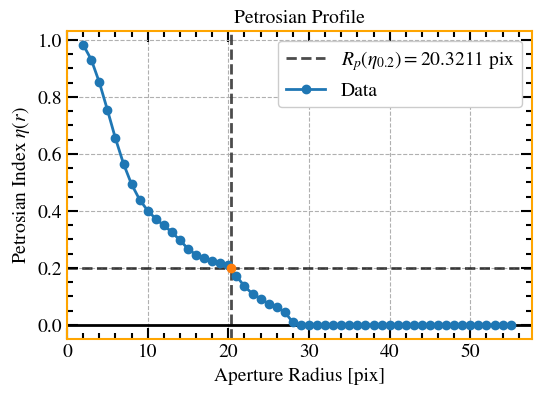

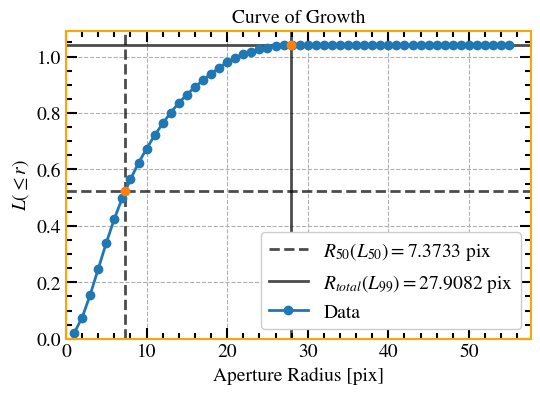

In [37]:
ids_to_add=['3','5']
# comp_ids=['1','2','5']
comp_ids=['1','2','3','4','5','6','7']

SE = mp.source_extraction(input_data, ids_to_add=ids_to_add,
                          ell_size_factor = ell_size_factor, sigma=sigma,
                          bwf=bwf, bhf=bhf, fwf=fwf, fhf=fhf,
                          algorithm='PF',
                          clean_param=clean_param, 
                          deblend_cont=deblend_cont, 
                          deblend_nthresh=deblend_nthresh,
                          apply_mask=True,sigma_mask=sigma_mask,minarea_factor=minarea_factor,
                          show_petro_plots=True,
                          sort_by = 'distance',threshold_mode = 'sigma',
                          force_circular=False,force_circular_all=False,
                          dry_run=False)
SE_ref = mlibs.copy.copy(SE)

In [ ]:
imagelist_run = imagelist_c.copy()[0:]
residuallist_run = residuallist_c.copy()[0:]
frequencies = freqlist.copy()[0:]
frequencies
# imagelist_run = MFS_images_c.copy()[1:]
# residuallist_run = MFS_residuals_c.copy()[1:]
# frequencies = freqlist_MFS.copy()[1:]

array([4.361124e+09, 5.249516e+09, 6.138408e+09, 3.046600e+10,
       3.312700e+10, 3.572450e+10])

In [42]:
fix_geometry = [True] * SE.n_IDs + [True,True,True,True,True,True,True,True,True,True] 
dr_fix = [5,5,5,5,5] + [50] * SE.n_IDs + [100,100,100,15,15,15,15,15]
fix_value_n = [0.5] * SE.n_IDs + [0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5]
fix_n = [True] * SE.n_IDs + [True,True,True,True,True,True,True,True]
# fix_max_value_Rn = [1.0] + [False] * SE.n_IDs + [False,False]
# fix_max_value_Rn = [False] + [False] * SE.n_IDs + [False,False,False]
fix_max_value_Rn = [1.0,1.0,False,False,1.0] + [False] * SE.n_IDs + [False,False,False]
# fix_max_value_Rn = [False,1.0,False] + [False] * SE.n_IDs + [False,False,False]
fix_max_value_Rn

[1.0,
 1.0,
 False,
 False,
 1.0,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False]

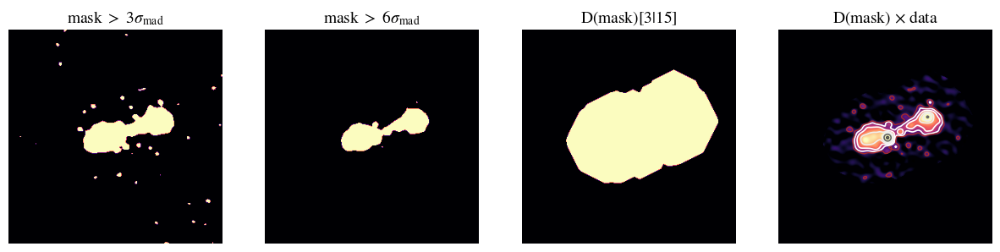

<Figure size 500x500 with 0 Axes>

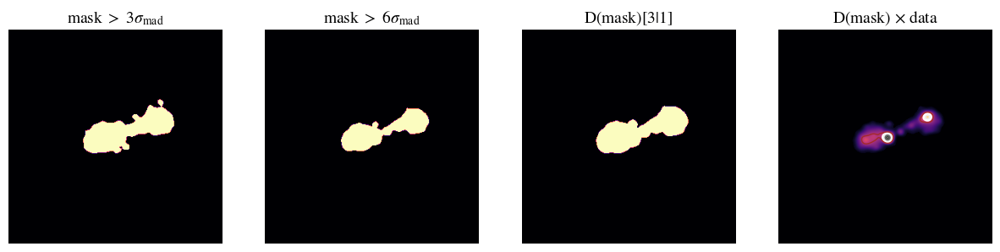

<Figure size 500x500 with 0 Axes>

In [43]:
# We need to allow enough sampling points (signal+bkg) to provide a robust fit statistics.

idx_init = 1
_, mask = mlibs.mask_dilation(MFS_images_c[idx_init], 
                              sigma=6, 
                              # dilation_size='2x',
                              dilation_size=None,
                              iterations=15, show_figure=True,PLOT=True,
                              rms=mlibs.mad_std(mlibs.load_fits_data(MFS_residuals_c[idx_init])))

# We need to allow enough sampling points (signal+bkg) to provide a robust fit statistics.
_, mask_region = mlibs.t_mask_dilation(MFS_images_c[idx_init], 
                              sigma=6, 
                              dilation_size=None,
                              iterations=1, show_figure=True,PLOT=True,
                              rms=mlibs.mad_std(mlibs.load_fits_data(MFS_residuals_c[idx_init])))

2025-06-24 01:16:31 - INFO -  ++>> Using the provided  mask for fitting.


++>> Image File: im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-MFS-image.cutout.CE.fits
++>> Residual File: im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-MFS-residual.cutout.CE.fits
-->> No PSF File was provided.
-->> Warning: Could not determine Jy conversion factor from header

===== Image Units and Conversion Information =====
Instrument: None
Filter: None
Original units: JY/BEAM
Pixel scale: 0.0080 arcsec/pixel

  ++==>>  Fitting im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-MFS-image.cutout.CE.fits
++==>> USING MASK FOR FITTTTTTTTTTTTTTTT 
++==>> USING PROVIDED MASK FOR FIT IS NOT NONE


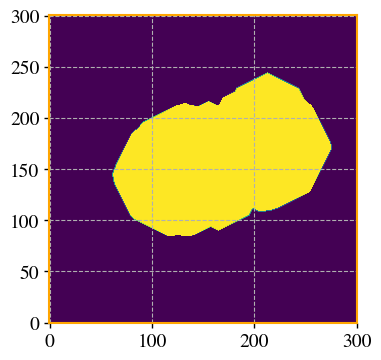

     >> INFO: Using provided mask.
     >> CALC: Computing image properties.
-----------------------------------------------------------------
Flux Density and error (based on rms of residual x area): 
Flux Density = 58.42 +/- 1.49 mJy
Fractional error = 0.03
Flux Density and error (quadrature |fract_err + res_err + rms|): 
Flux Density = 58.42 +/- 3.13 mJy
Fractional error = 0.05
-----------------------------------------------------------------
 ==>  Peak of Flux      = 18.62 +/- 0.03 [mJy/beam]
 ==>  Snu (within mask) = 58.42 +/- 1.49 [mJy]
 ==>  Snu (image)       = 56.98 +/- 1.49 [mJy]
 ==>  R50               = 0.0889 +/- 0.0127 [arcsec]
 ==>  R95               = 0.2440 +/- 0.0247 [arcsec]
 ==>  A50               = (8.9641 +/- 2.5694) x 1e3 [kpc^-2]
 ==>  A95               = (67.4596 +/- 13.3906) x 1e3 [kpc^-2]
 ==>  R50               = 53.4168 +/- 7.6388 [pc]
 ==>  R95               = 146.5369 +/- 14.8163 [pc]


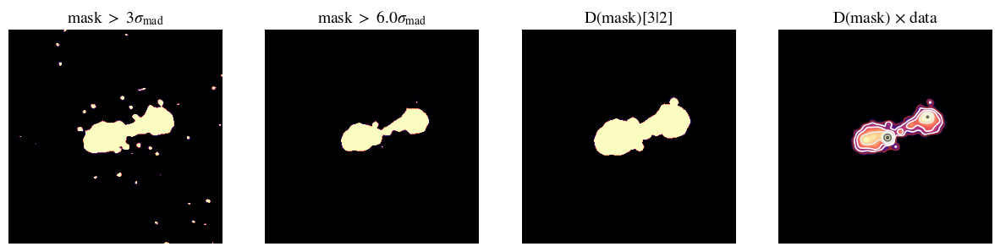

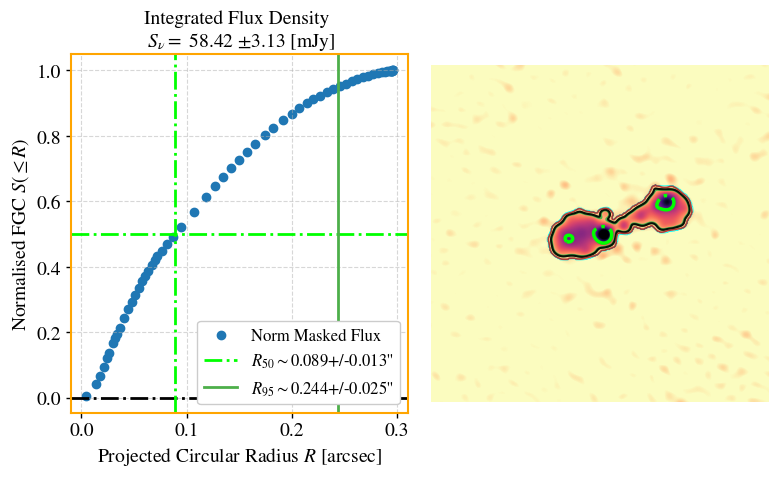

     >> CALC: Computing Petrosian properties.
1


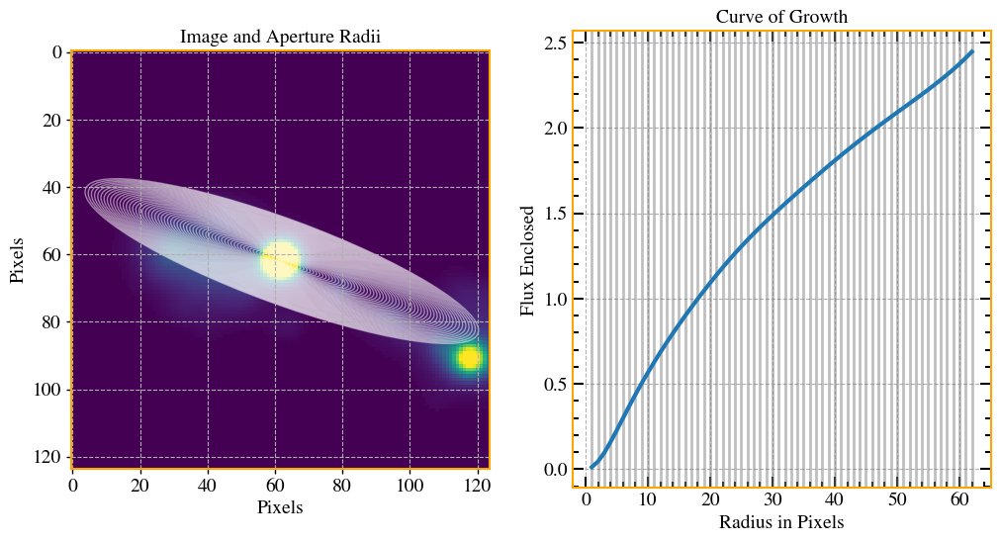

Rlast        = 62
2*Rp           =  nan
r_total_flux = nan
1


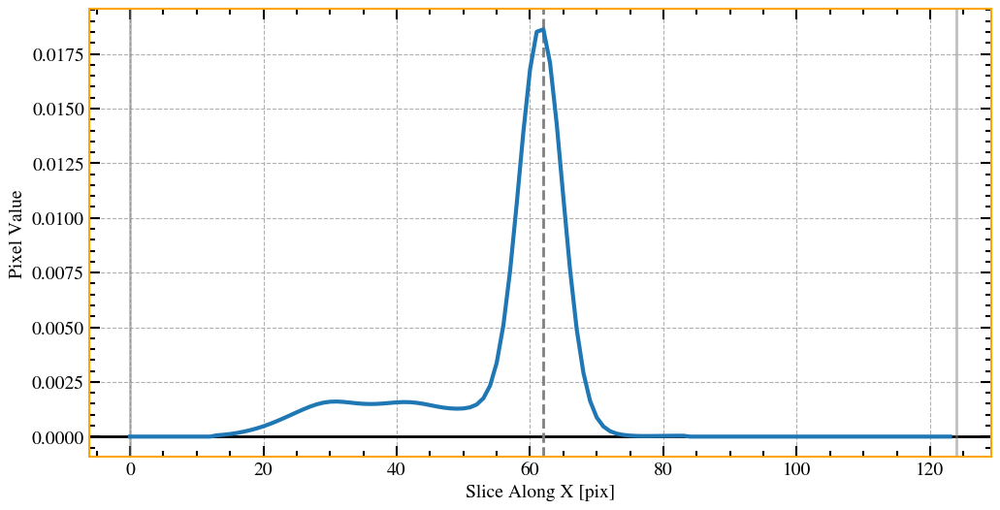

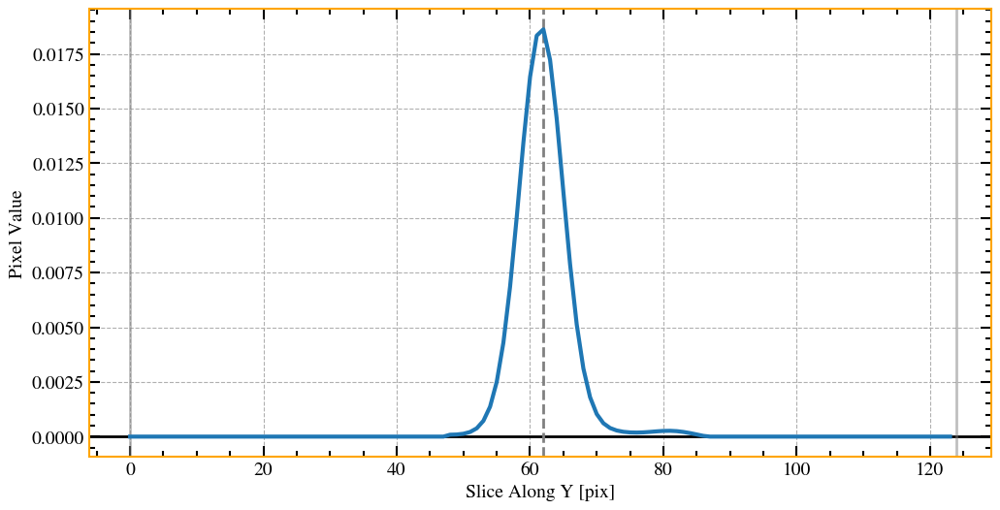

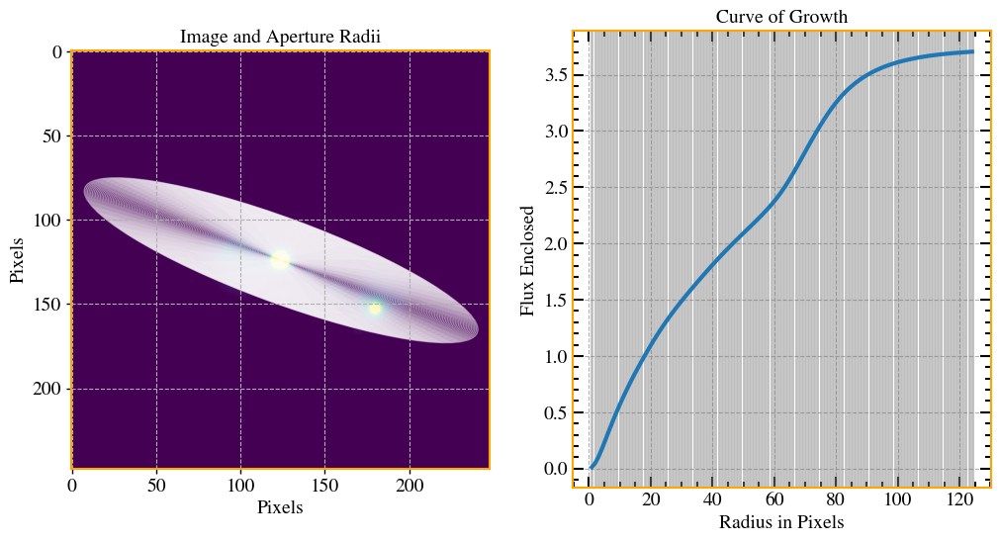

Rlast        = 124
2*Rp         =  182.5645129025805
r_total_flux = nan
1


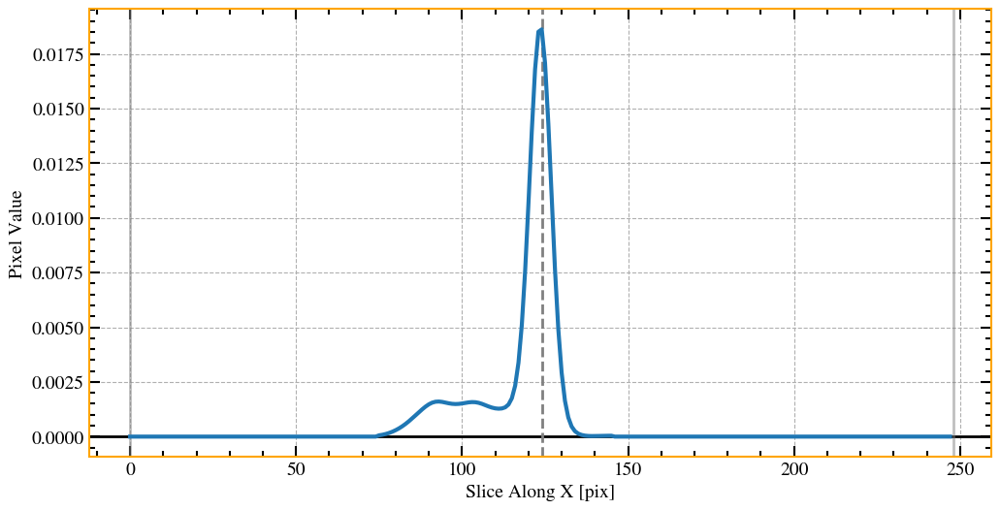

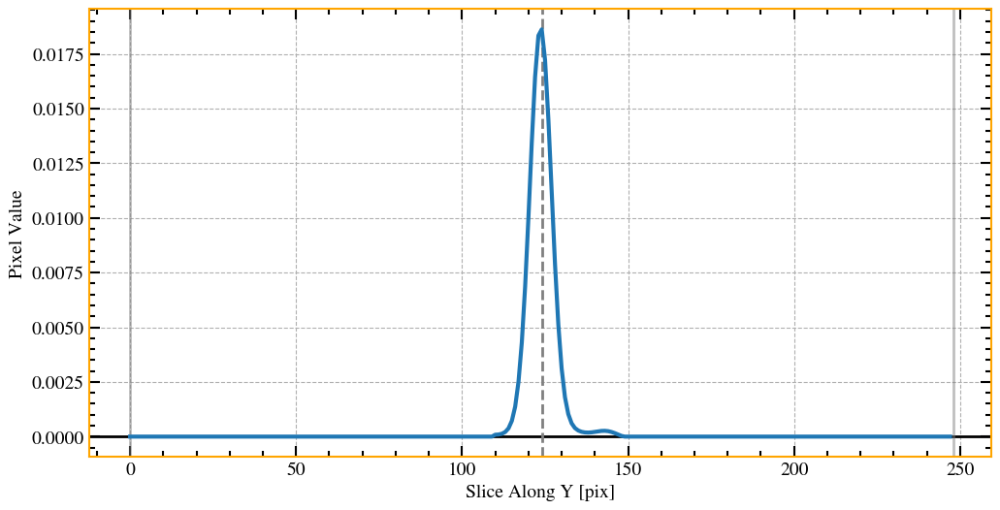

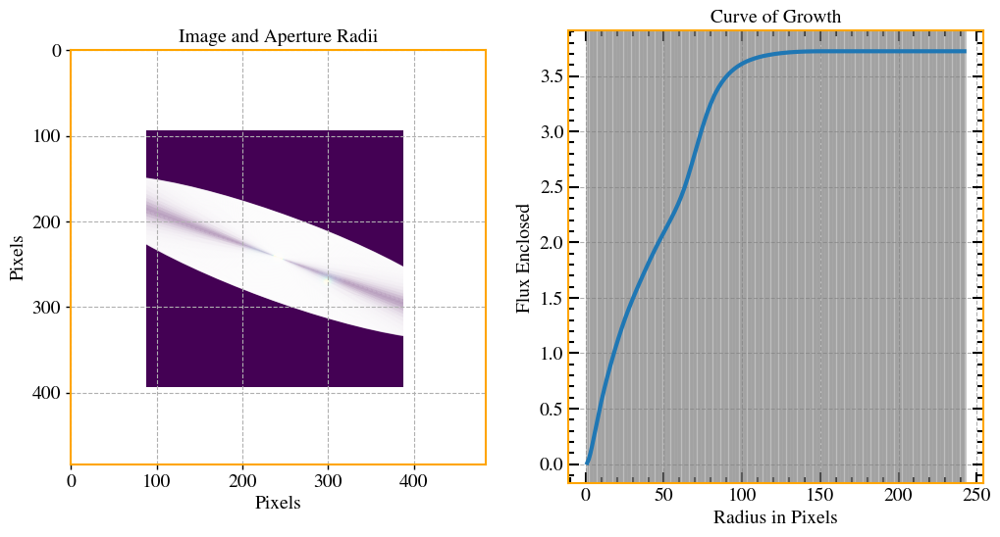

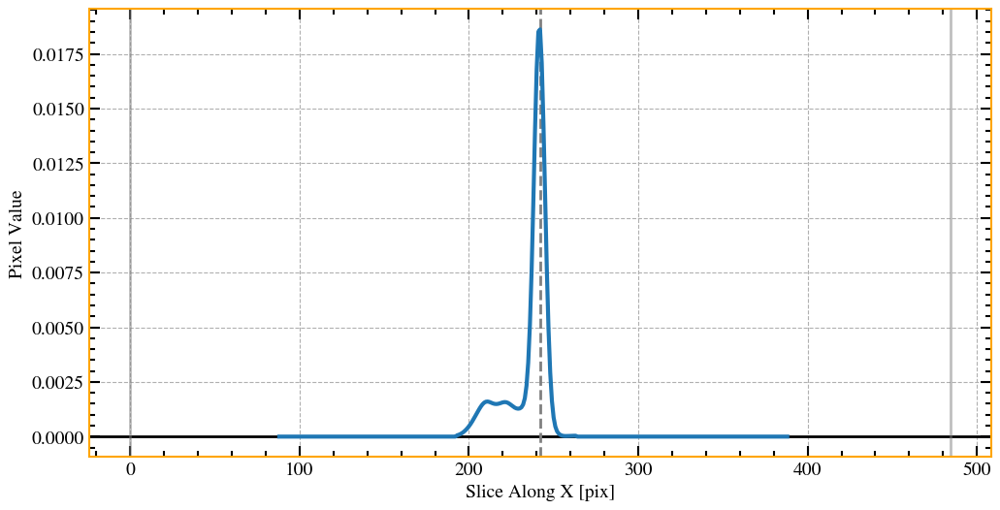

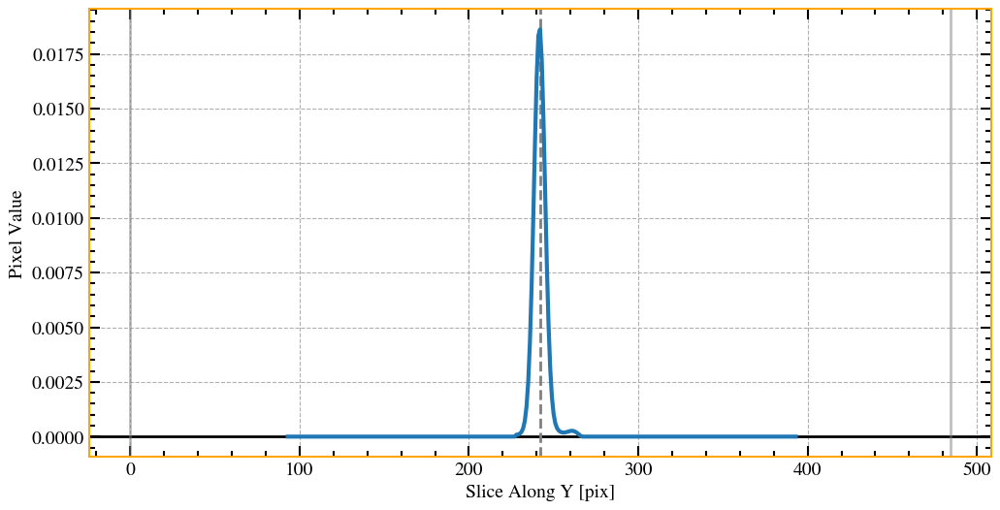

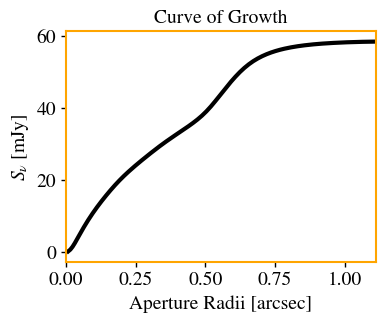

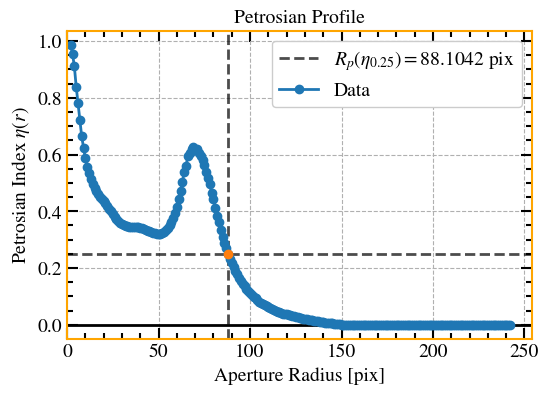

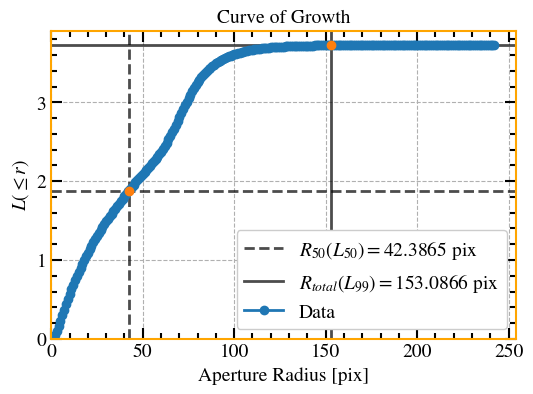

2025-06-24 00:16:48	WARN	componentlist::close	componentlist closed
2025-06-24 01:16:48 - INFO - Fitting image: /tmp/disk/LIRGI_Sample_done/for_spix/NGC7674/eM_C_VLA_Ku_Ka/C/im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-MFS-image.cutout.CE.fits
2025-06-24 01:16:48 - DEBUG -  ==> Using provided mask region to constrain fit. 
2025-06-24 01:16:48 - WARNING -  !!++==> Fitting with a mask is faster, but experimental!! 
         Use with caution.
2025-06-24 01:16:48 - DEBUG - ---------------------------------------
2025-06-24 01:16:48 - DEBUG -  <<< PERFORMING CONVOLUTION WITH JAX >>> 
2025-06-24 01:16:48 - DEBUG - ---------------------------------------
2025-06-24 01:16:48 - DEBUG -  ==> Using provided RMS map. 


 ++==>> Limiting x0=152.63646045762187+/-5
 ++==>> Limiting y0=149.1034510688363+/-5
++==>> Fixing sersic index of component 1 to 0.5.
 ++==>> Limiting Rn_1 to 1.0
 ++==>> Limiting x0=171.5952544362878+/-5
 ++==>> Limiting y0=157.10506676648313+/-5
++==>> Fixing sersic index of component 2 to 0.5.
 ++==>> Limiting Rn_2 to 1.0
 ++==>> Limiting x0=128.283663476057+/-5
 ++==>> Limiting y0=146.5622038923163+/-5
++==>> Fixing sersic index of component 3 to 0.5.
 ++==>> Limiting x0=186.1710965346121+/-5
 ++==>> Limiting y0=165.16127649995528+/-5
++==>> Fixing sersic index of component 4 to 0.5.
 ++==>> Limiting x0=209.36359181405385+/-5
 ++==>> Limiting y0=175.22882460593718+/-5
++==>> Fixing sersic index of component 5 to 0.5.
 ++==>> Limiting Rn_5 to 1.0
 ++==>> Limiting x0=128.283663476057+/-50
 ++==>> Limiting y0=146.5622038923163+/-50
++==>> Fixing sersic index of component 6 to 0.5.
 ++==>> Limiting x0=209.36359181405385+/-50
 ++==>> Limiting y0=175.22882460593718+/-50
++==>> Fixing se

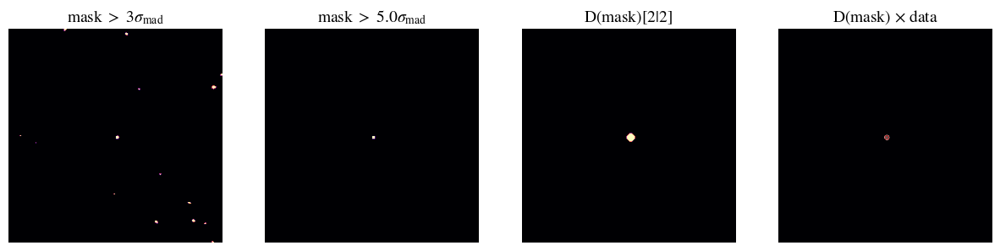

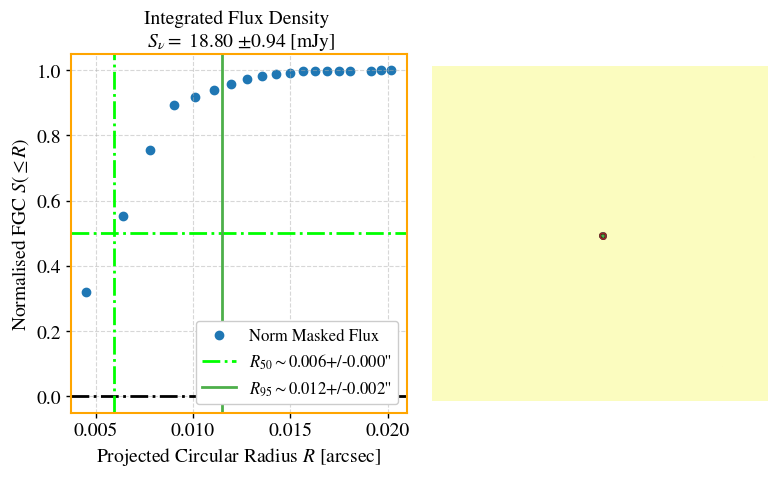

     -->> ERROR when computing Petrosian properties. Will flag error_petro as True.
Computing properties of model component:  im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-MFS-image.cutout.CE_dec_model_component_2.fits


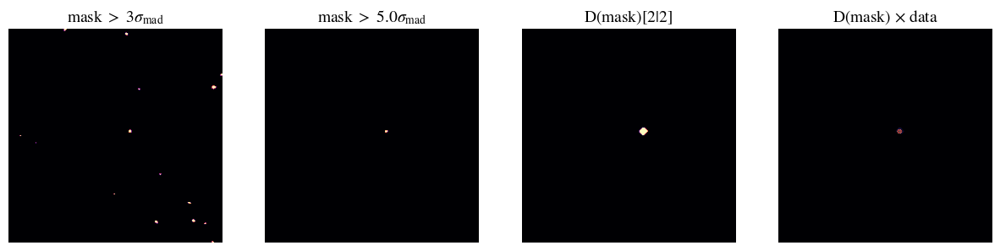

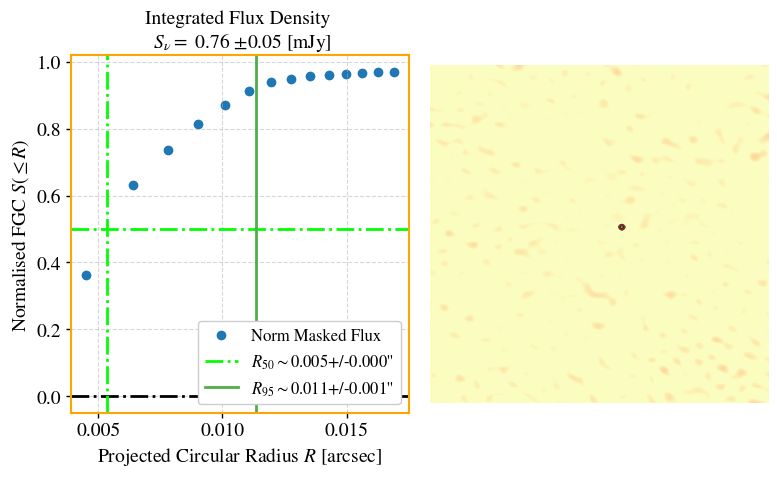

     -->> ERROR when computing Petrosian properties. Will flag error_petro as True.
Computing properties of model component:  im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-MFS-image.cutout.CE_dec_model_component_3.fits


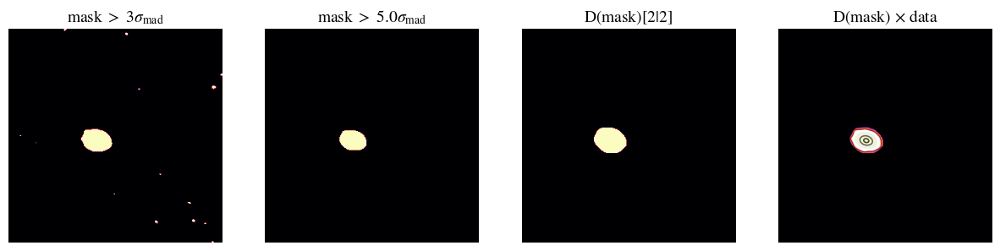

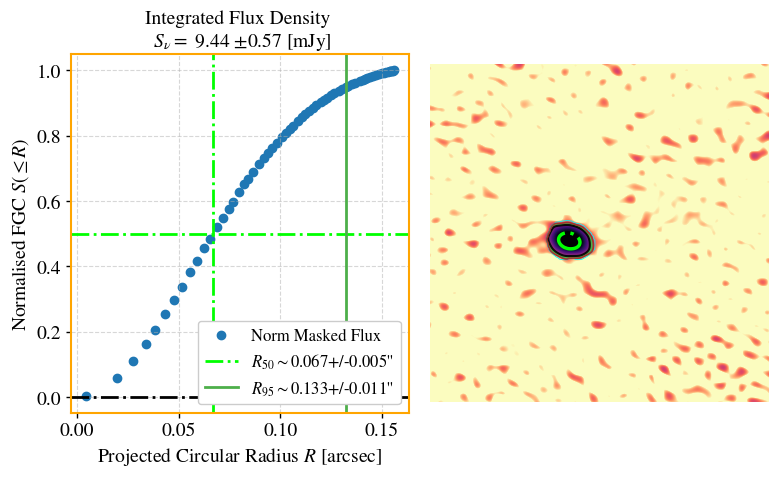

Computing properties of model component:  im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-MFS-image.cutout.CE_dec_model_component_4.fits


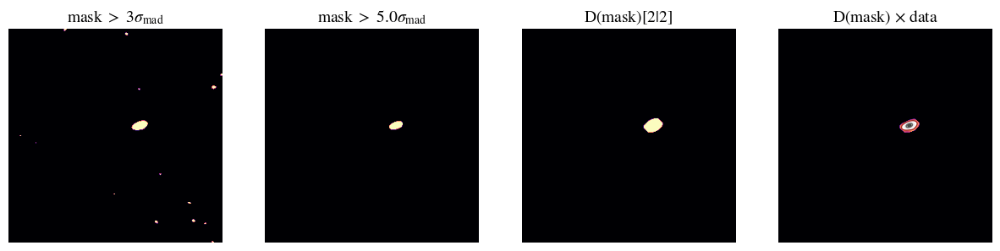

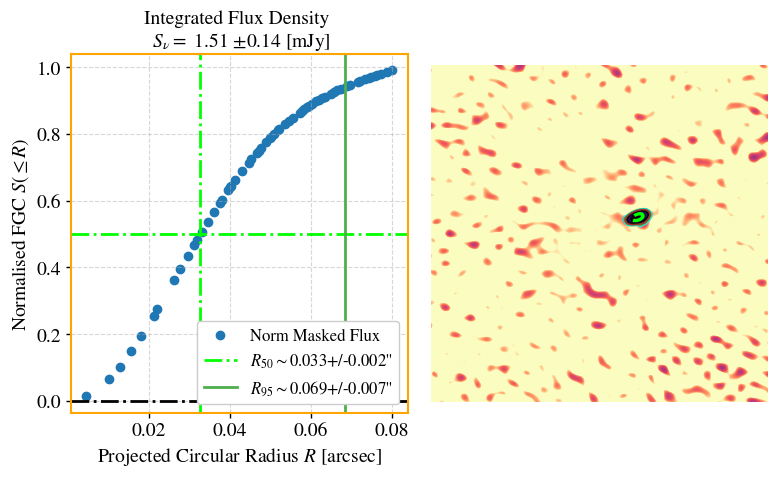

Computing properties of model component:  im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-MFS-image.cutout.CE_dec_model_component_5.fits


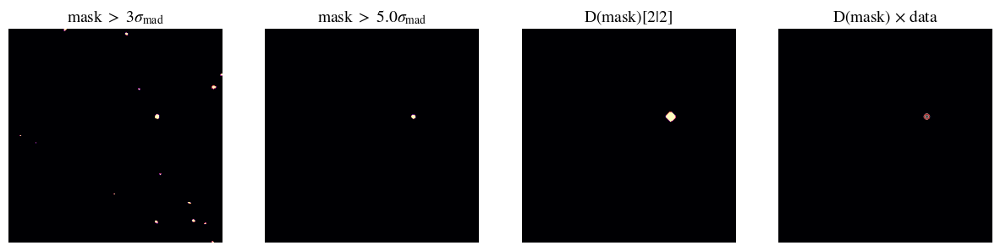

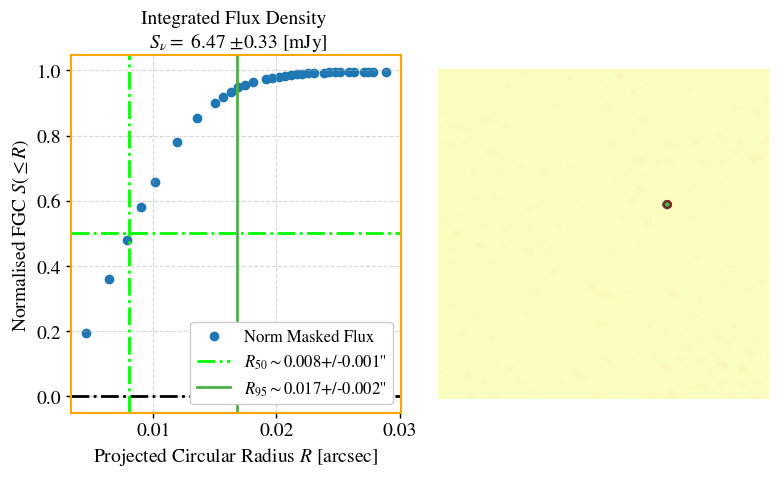

     -->> ERROR when computing Petrosian properties. Will flag error_petro as True.
Computing properties of model component:  im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-MFS-image.cutout.CE_dec_model_component_6.fits


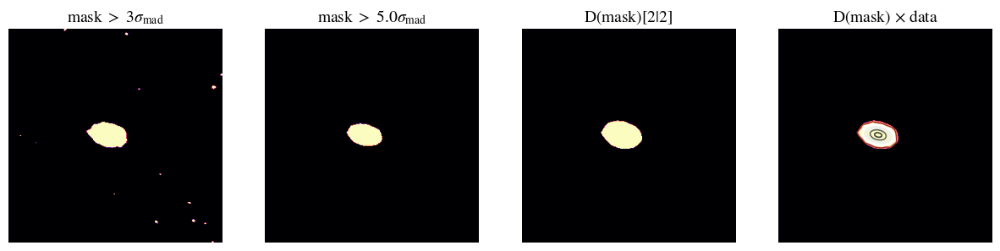

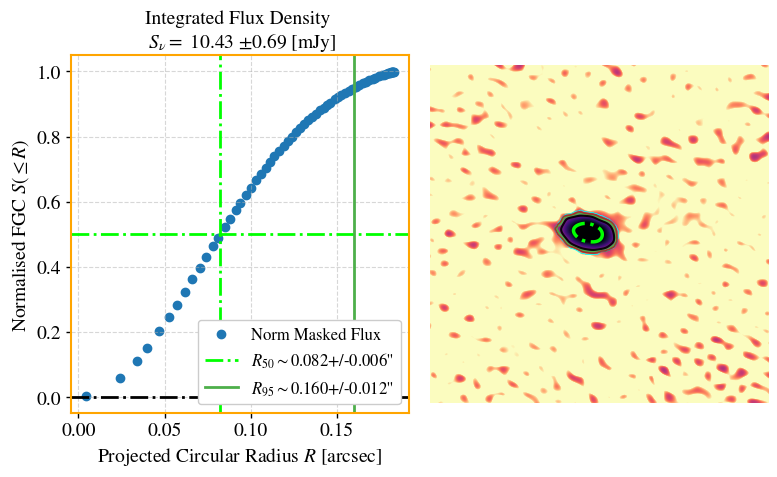

Computing properties of model component:  im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-MFS-image.cutout.CE_dec_model_component_7.fits


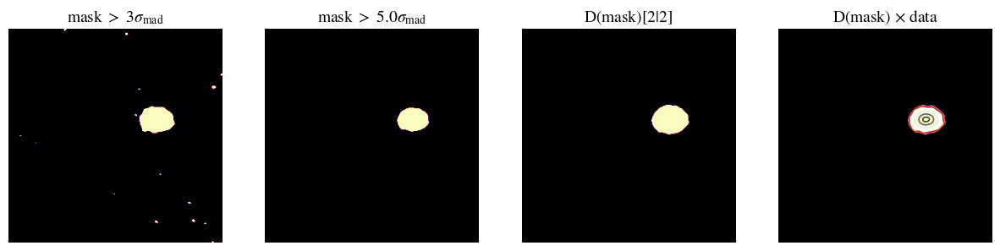

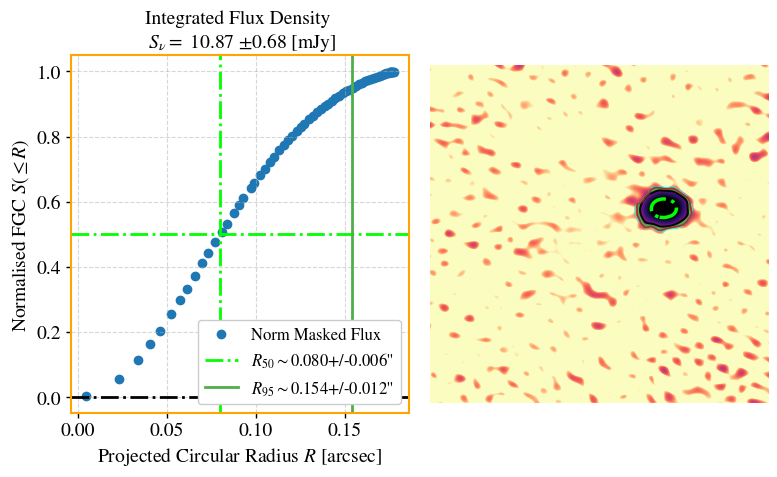

 ++==>> Dilation size = 3
 ++==>> Iterations = 2
Computing properties of model component:  im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-MFS-image.cutout.CE_model_component_1.fits


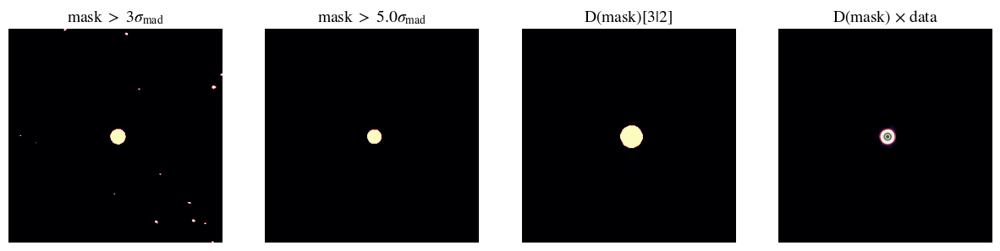

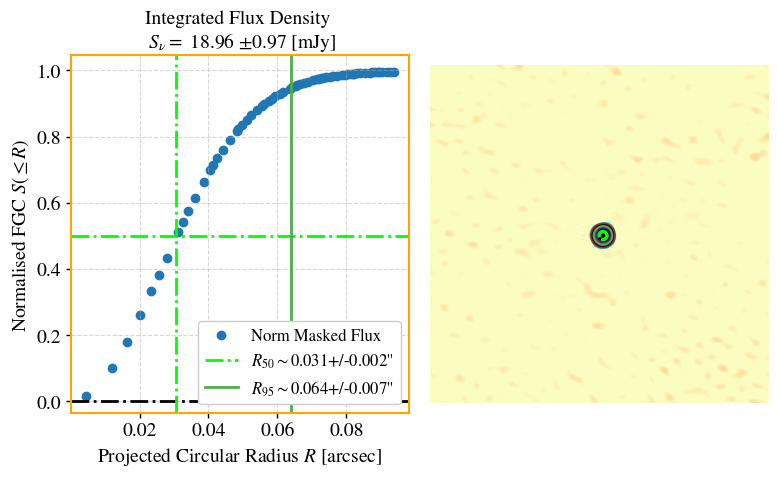

Computing properties of model component:  im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-MFS-image.cutout.CE_model_component_2.fits


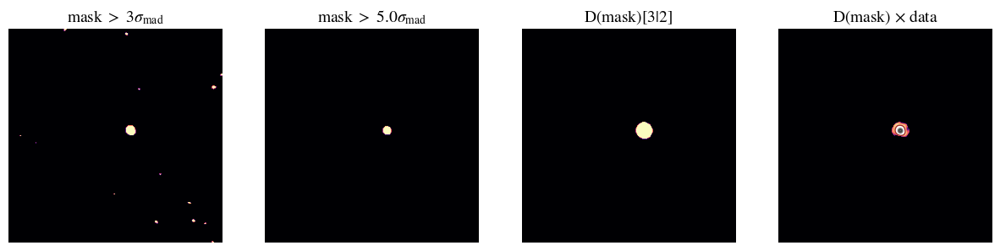

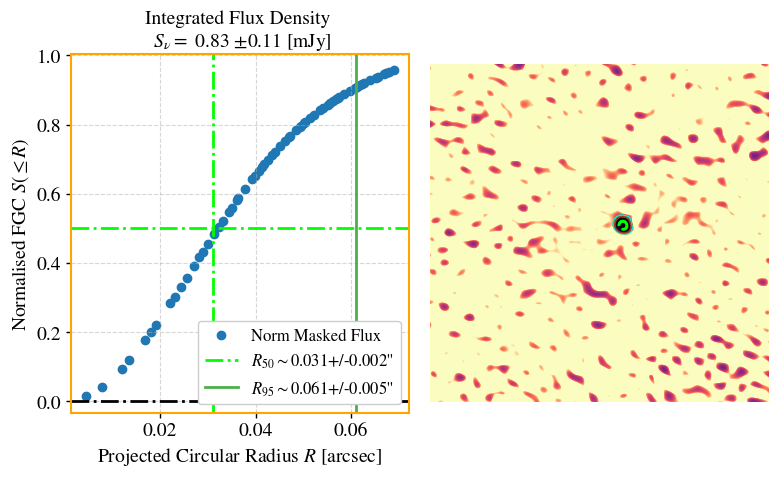

Computing properties of model component:  im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-MFS-image.cutout.CE_model_component_3.fits


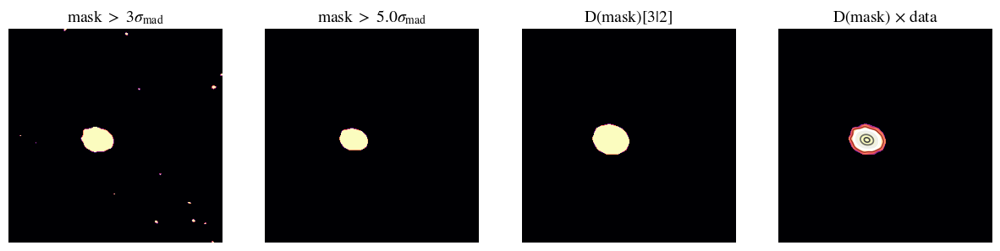

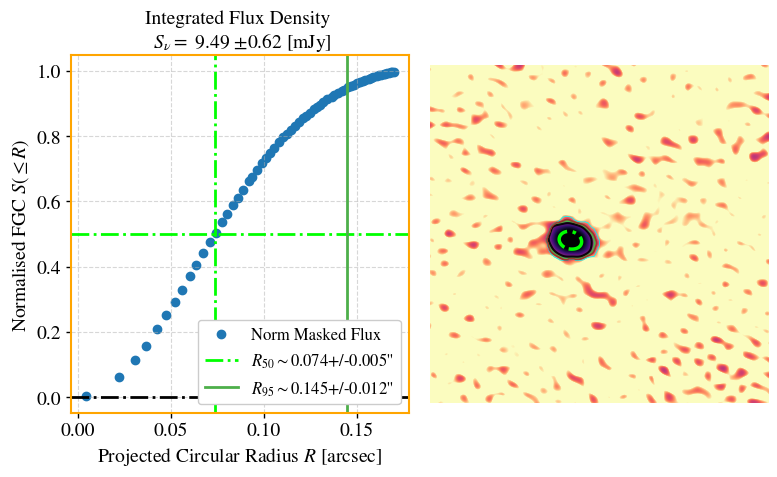

Computing properties of model component:  im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-MFS-image.cutout.CE_model_component_4.fits


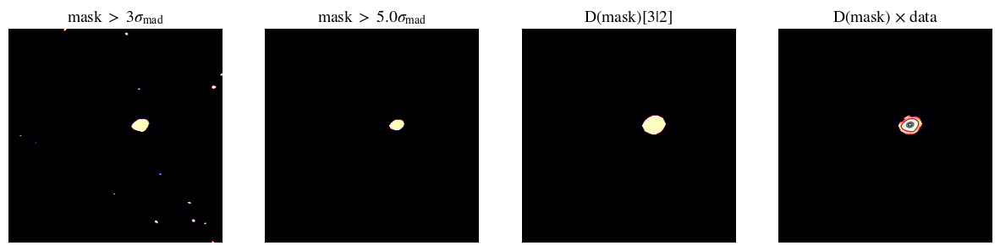

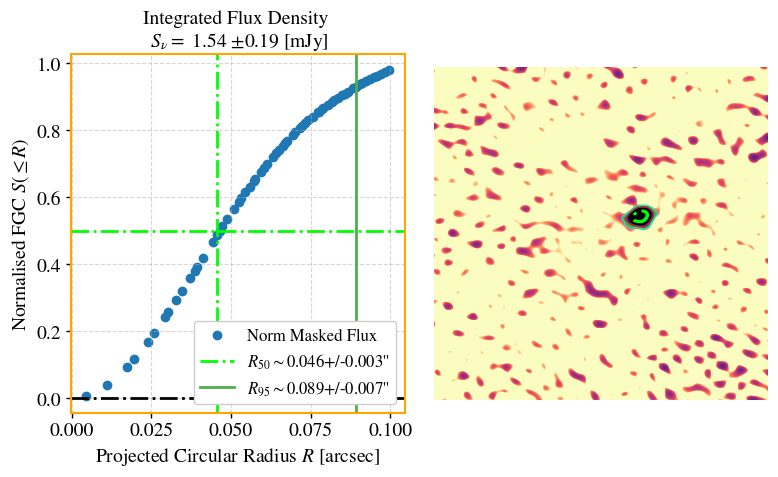

Computing properties of model component:  im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-MFS-image.cutout.CE_model_component_5.fits


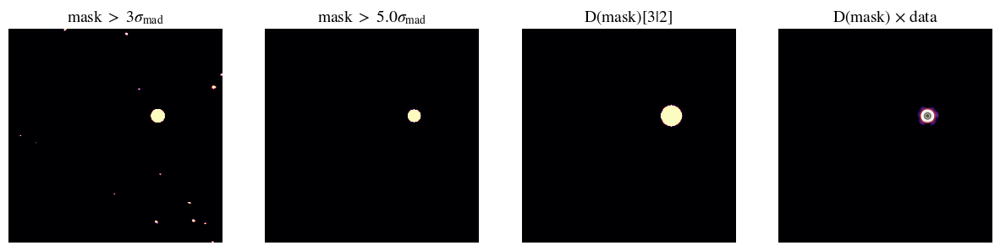

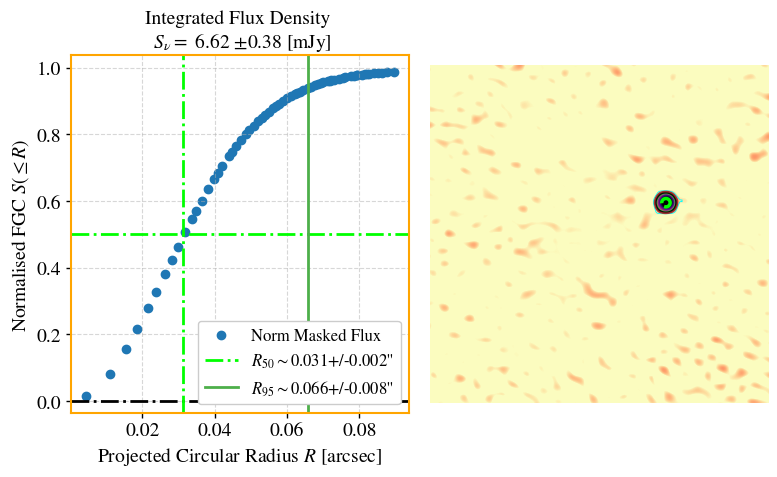

Computing properties of model component:  im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-MFS-image.cutout.CE_model_component_6.fits


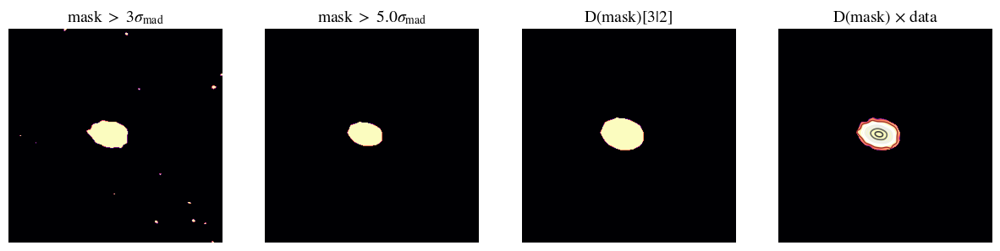

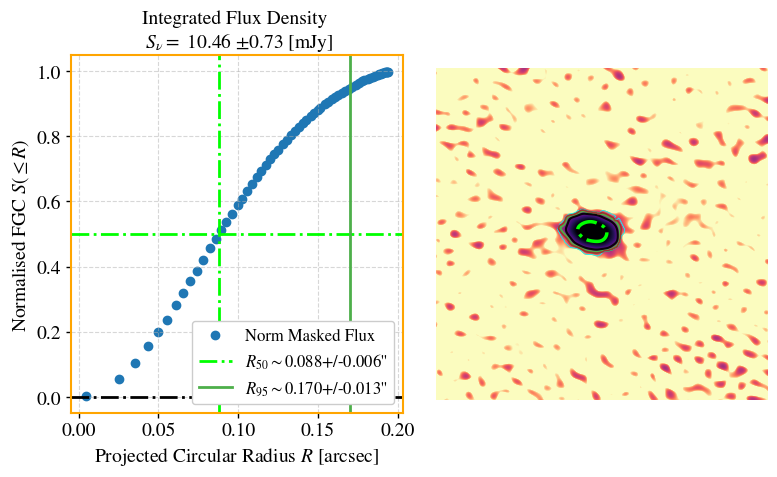

Computing properties of model component:  im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-MFS-image.cutout.CE_model_component_7.fits


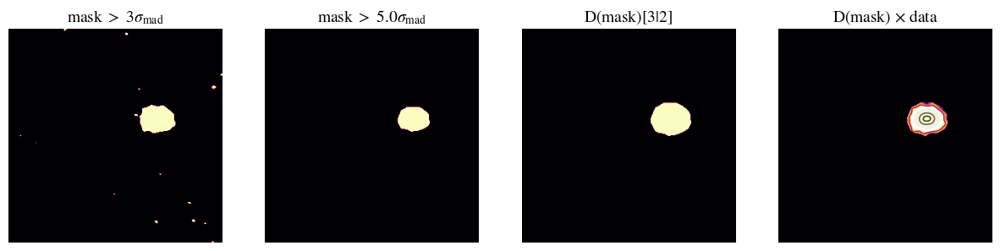

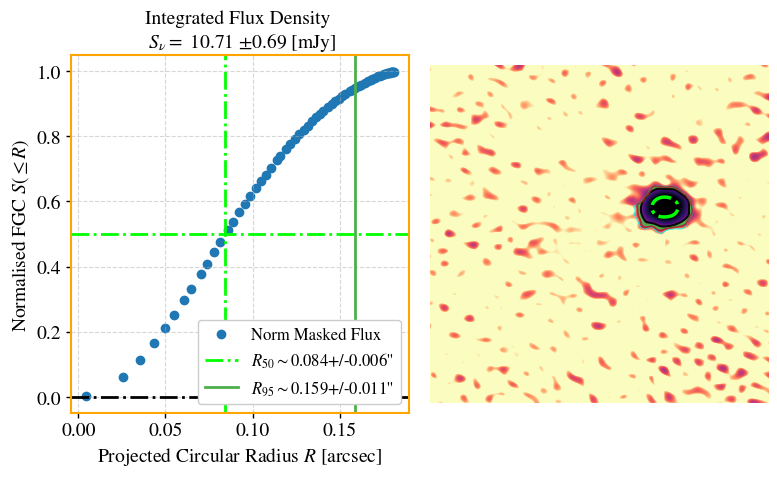

  ++>> Total component IDs modelled: ['1' '2' '3' '4' '5' '6' '7']
  ++>> IDs attributed to compact structures: ['1', '2', '3', '4', '5', '6', '7']
  ++>> IDs attributed to extended structures: []


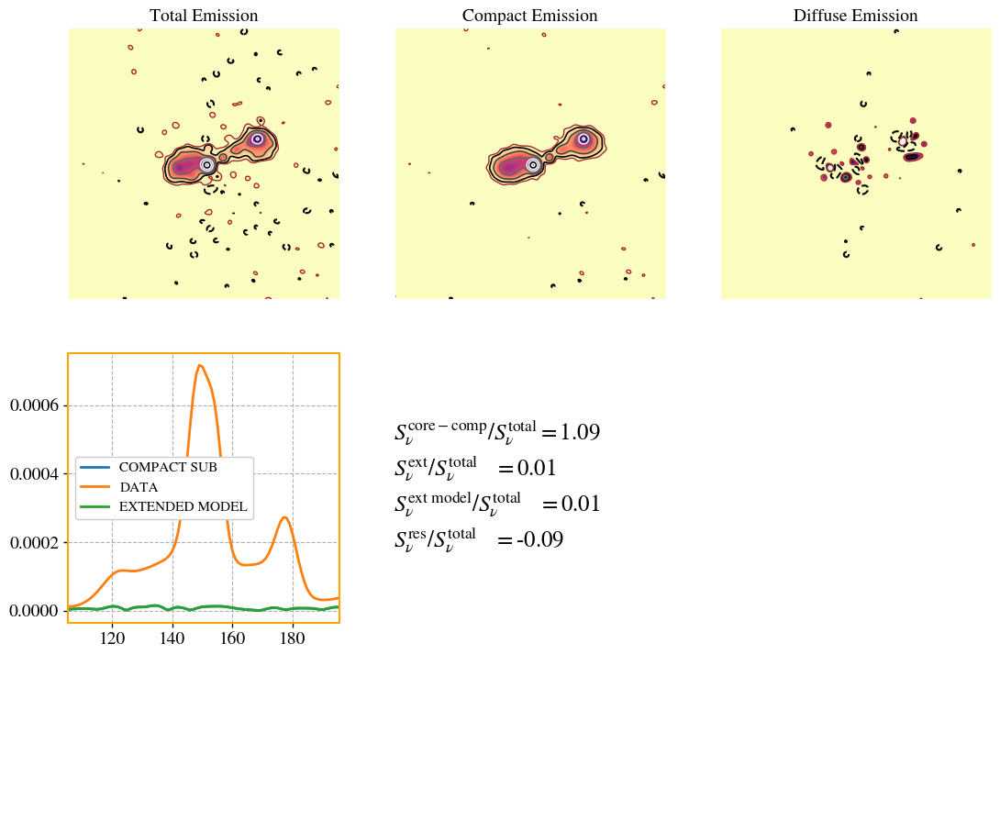

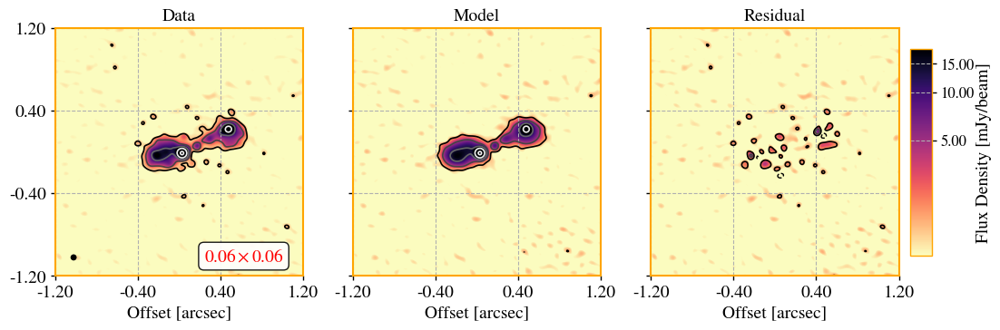

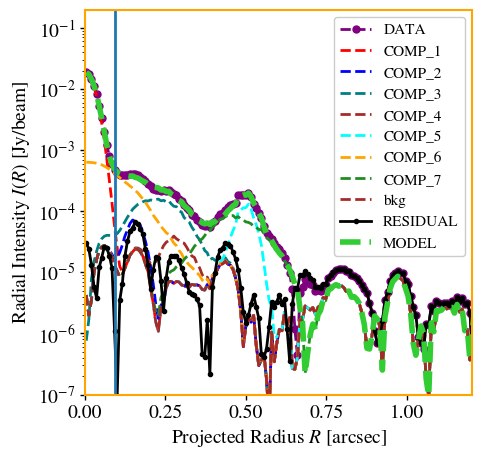

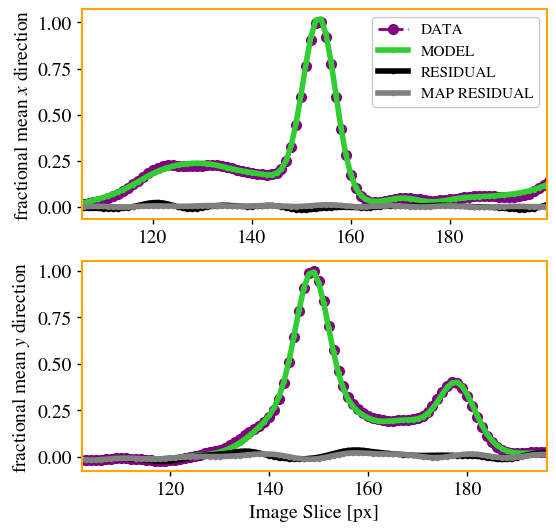

     >> INFO: Using provided mask.
     >> CALC: Computing image properties.
-----------------------------------------------------------------
Flux Density and error (based on rms of residual x area): 
Flux Density = 57.92 +/- 1.48 mJy
Fractional error = 0.03
Flux Density and error (quadrature |fract_err + res_err + rms|): 
Flux Density = 57.92 +/- 3.10 mJy
Fractional error = 0.05
-----------------------------------------------------------------
 ==>  Peak of Flux      = 18.59 +/- 0.03 [mJy/beam]
 ==>  Snu (within mask) = 57.92 +/- 1.48 [mJy]
 ==>  Snu (image)       = 57.92 +/- 1.48 [mJy]
 ==>  R50               = 0.0882 +/- 0.0129 [arcsec]
 ==>  R95               = 0.2402 +/- 0.0244 [arcsec]
 ==>  A50               = (8.8257 +/- 2.5767) x 1e3 [kpc^-2]
 ==>  A95               = (65.3772 +/- 13.0156) x 1e3 [kpc^-2]
 ==>  R50               = 53.0028 +/- 7.7303 [pc]
 ==>  R95               = 144.2575 +/- 14.6271 [pc]


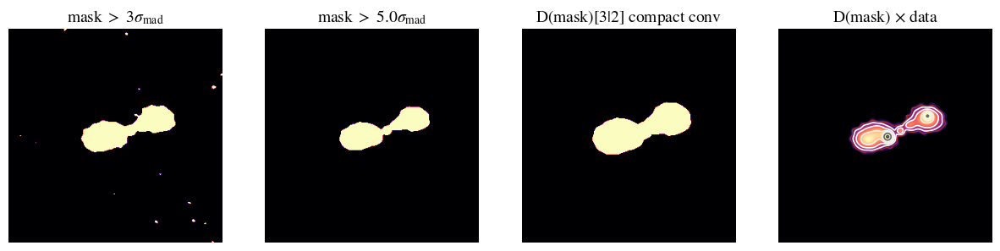

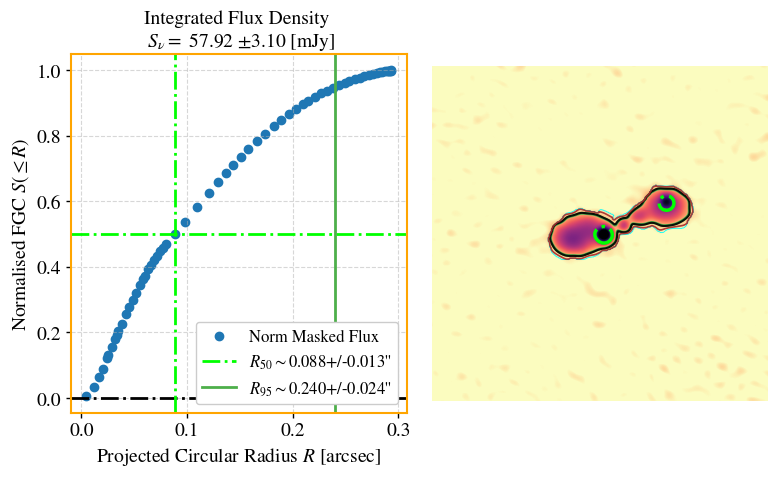

     >> CALC: Computing Petrosian properties.
1


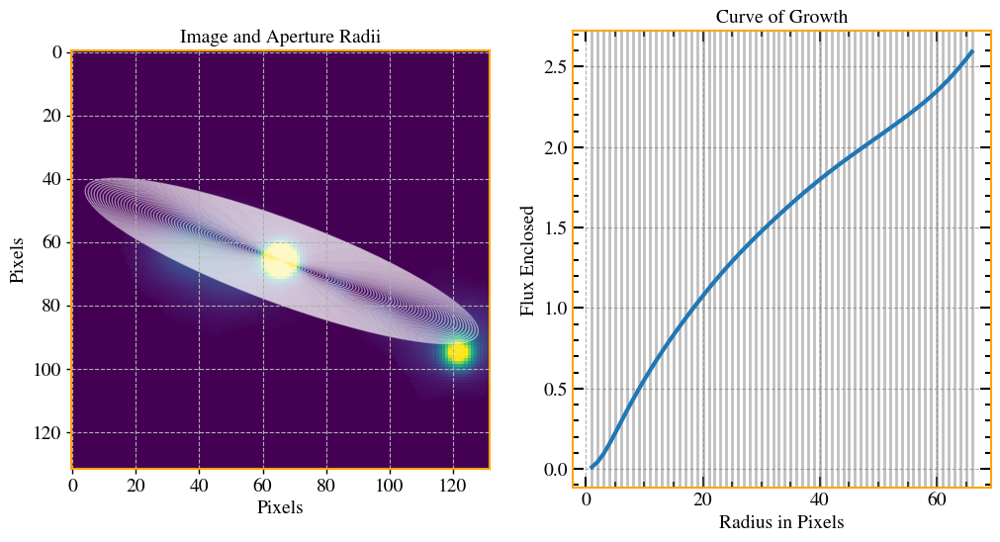

Rlast        = 66
2*Rp           =  nan
r_total_flux = nan
1


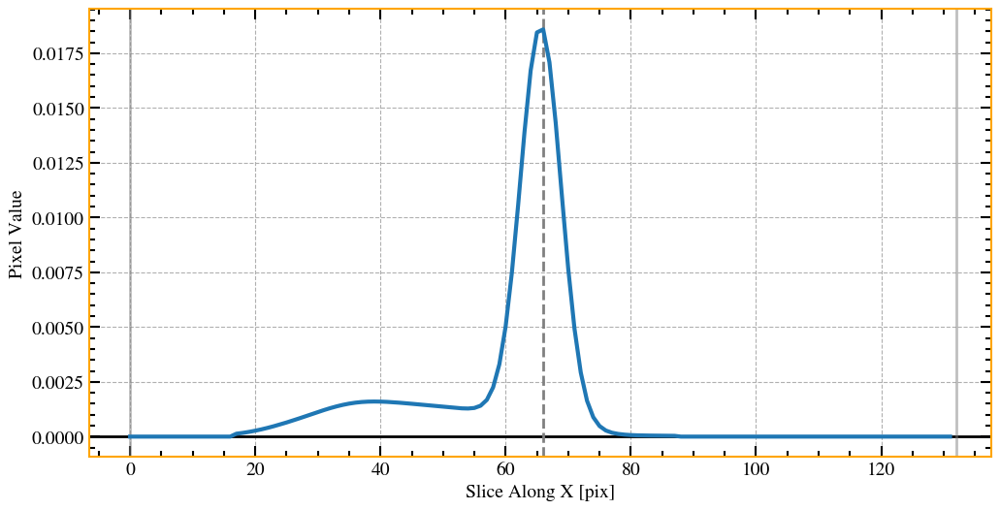

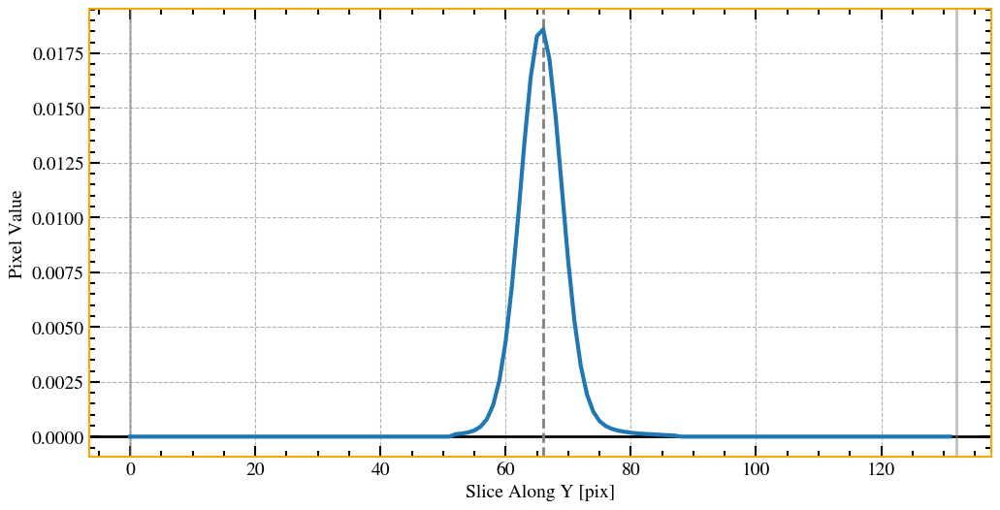

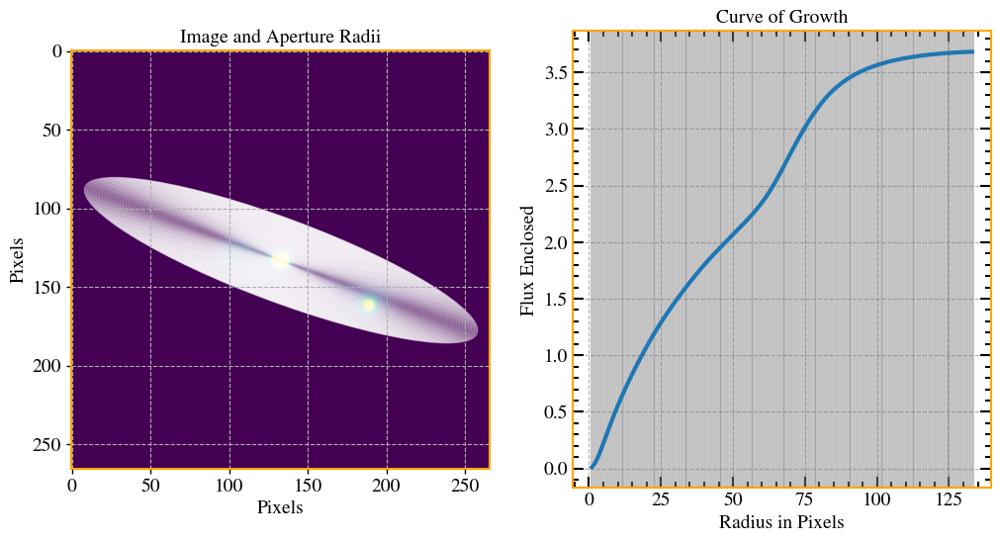

Rlast        = 133
2*Rp         =  183.47029405881176
r_total_flux = nan
1


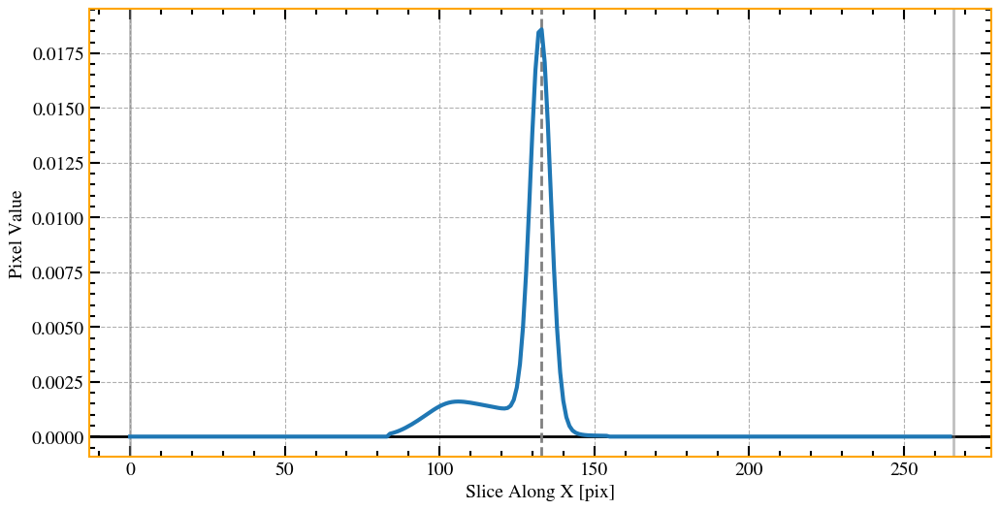

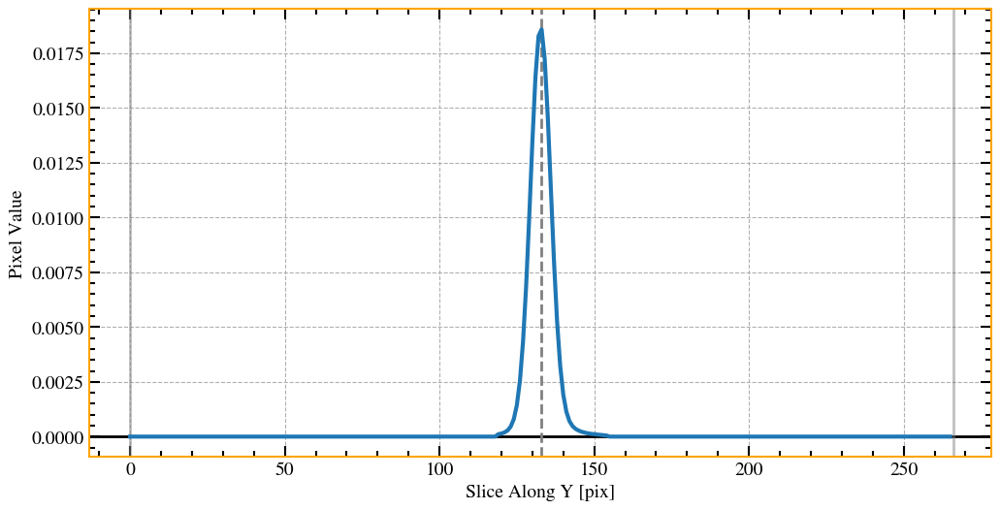

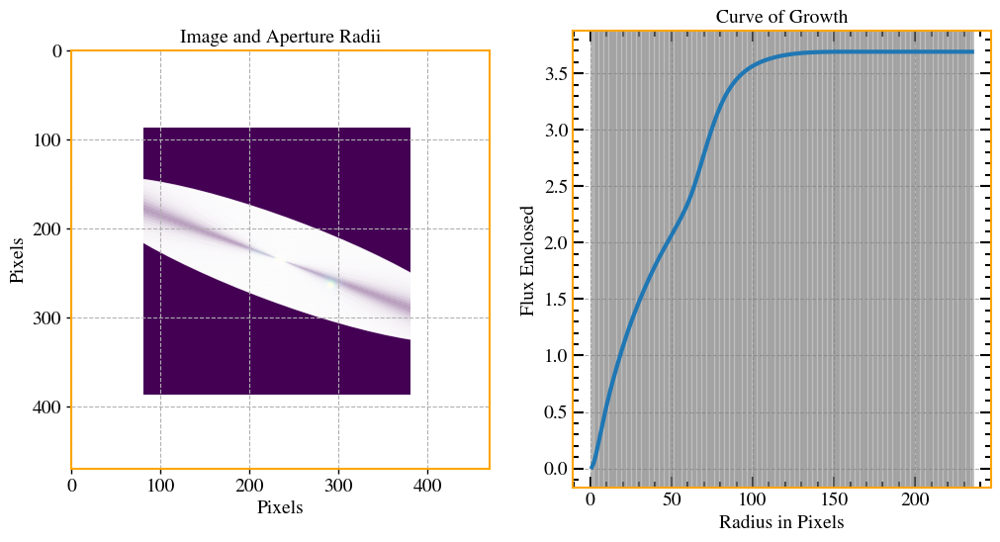

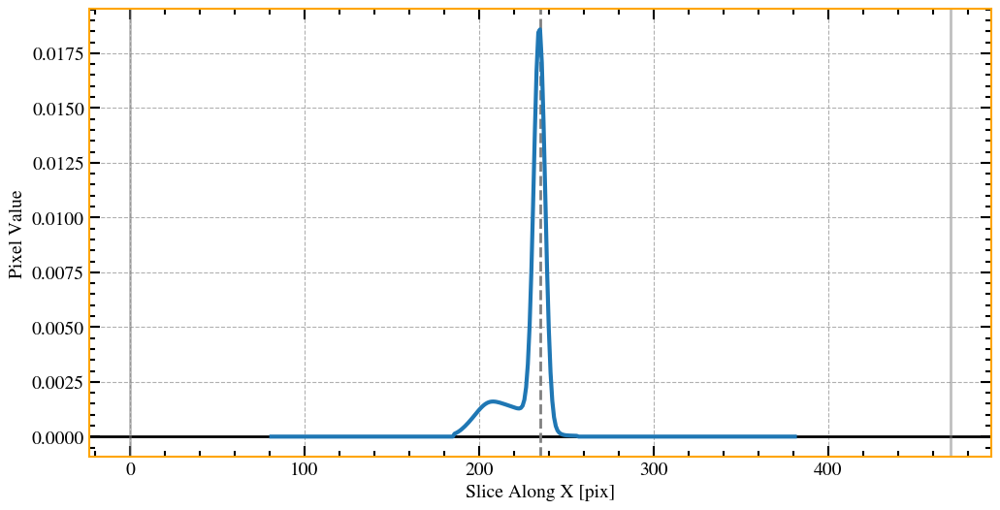

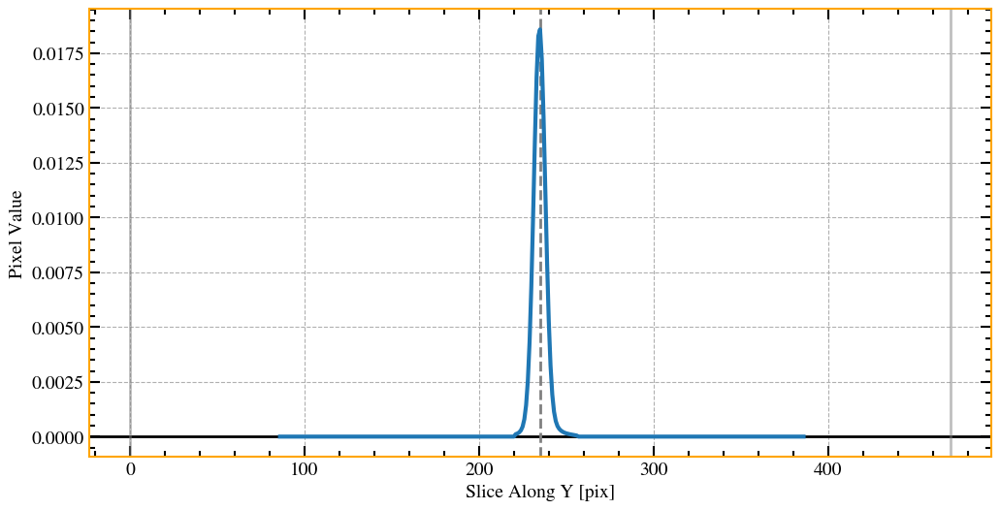

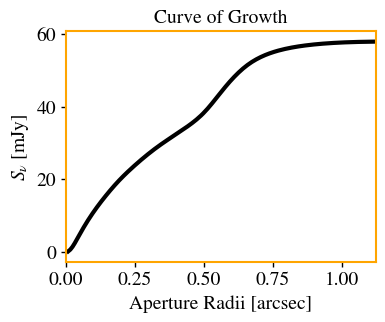

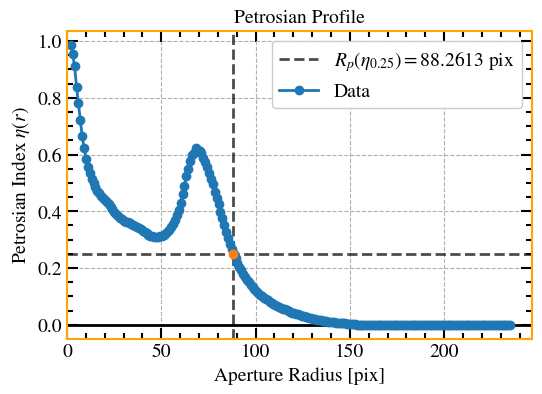

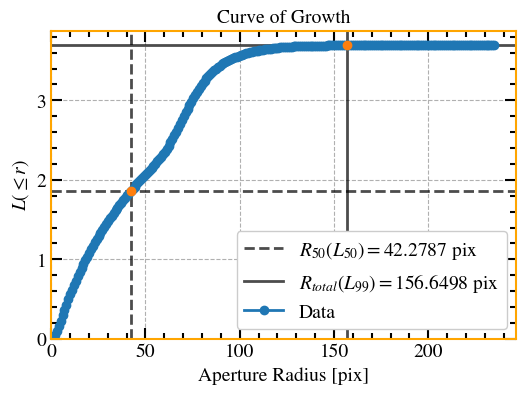

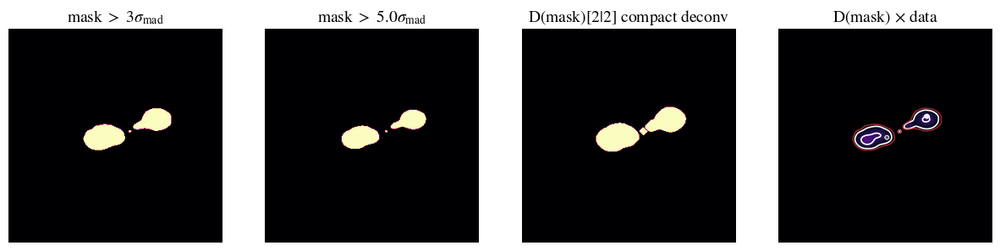

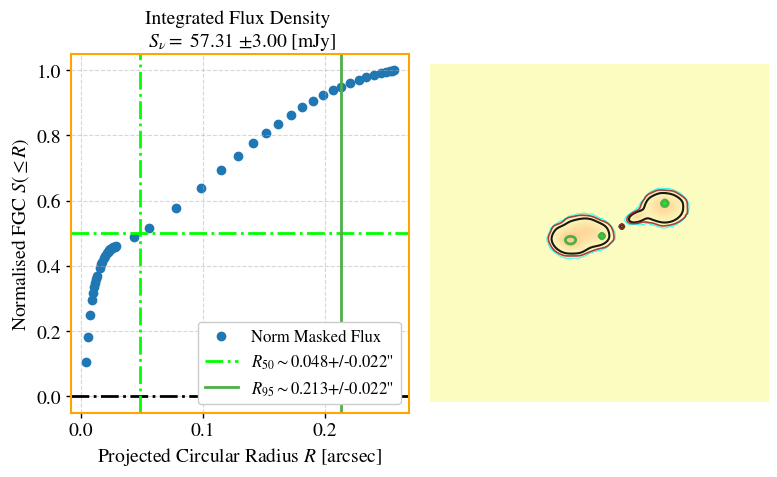

1


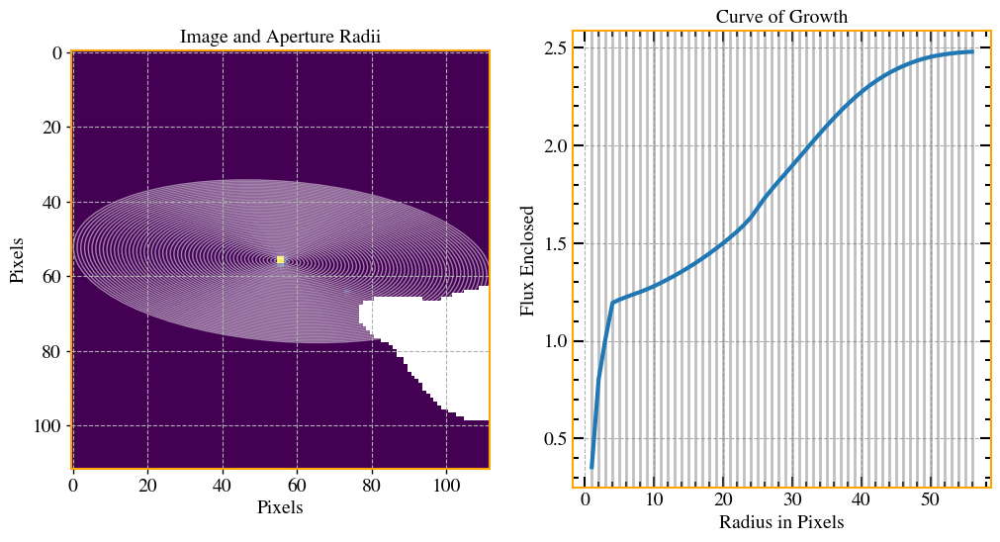

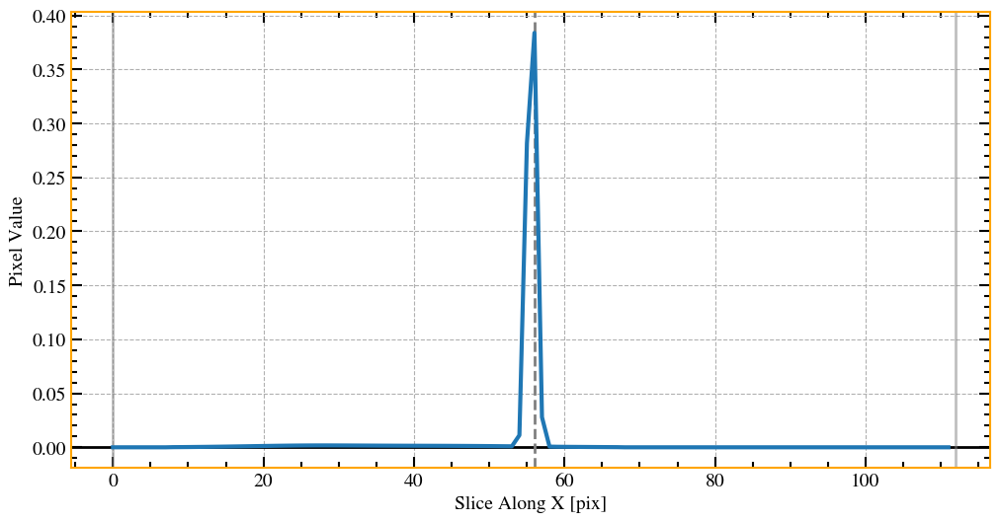

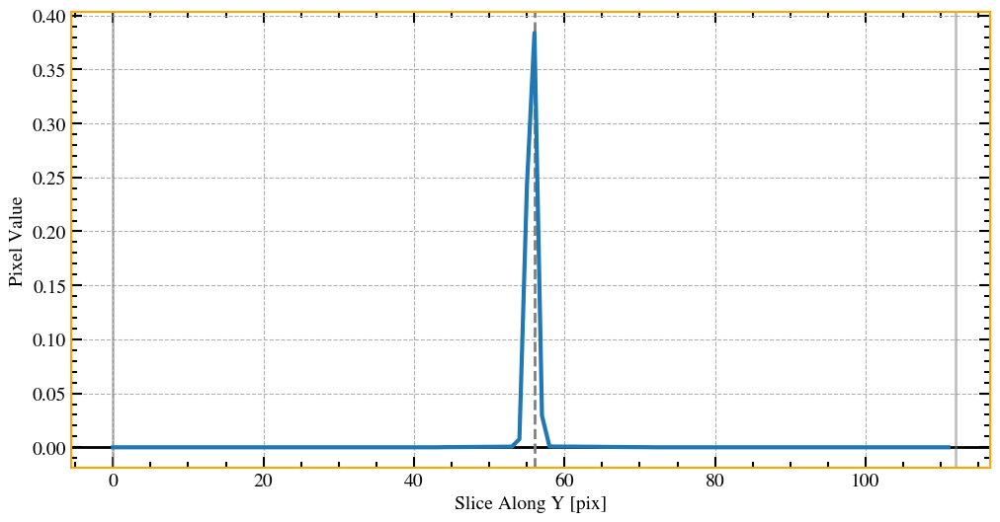

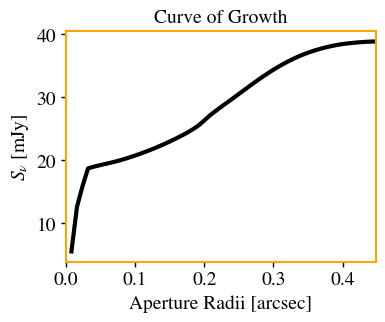

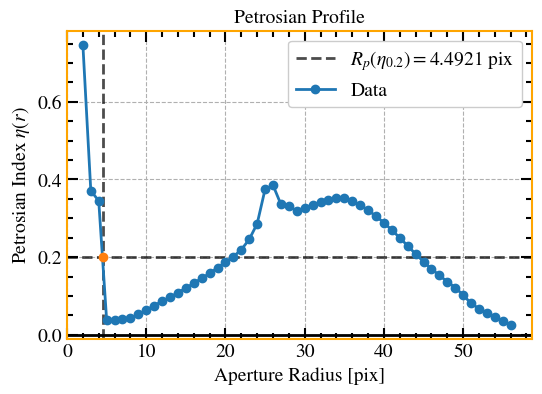

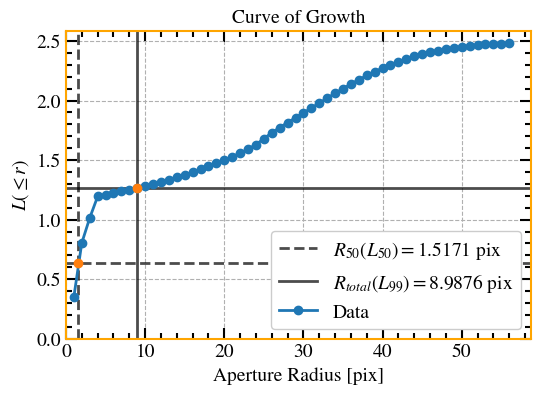

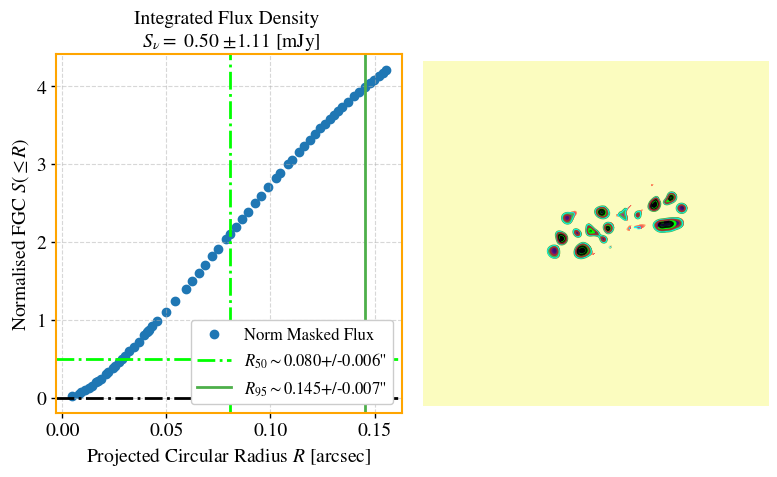

2025-06-24 01:22:14 - INFO - +--------------------------------+
2025-06-24 01:22:14 - INFO - | Core-Compact Component Sizes |
2025-06-24 01:22:14 - INFO - +--------------------------------+
2025-06-24 01:22:14 - INFO -  >=> 1 px = 4.81 pc
2025-06-24 01:22:14 - INFO -  >=> Beam Size = 7.00 px
2025-06-24 01:22:14 - INFO -  >=> Beam Size = 33.64  pc
2025-06-24 01:22:14 - INFO -  >=> Rn Main Compact = 3.26  pc
2025-06-24 01:22:14 - INFO -  >=> major axis FWHM = 6.52  pc
2025-06-24 01:22:14 - INFO -  >=> C50 Compact Deconv Radii = 29.00  pc
2025-06-24 01:22:14 - INFO -  >=> C50 Compact Conv Radii = 53.00  pc
2025-06-24 01:22:14 - INFO -  >=> C95 Compact Deconv Radii = 127.95  pc
2025-06-24 01:22:14 - INFO -  >=> C95 Compact Conv Radii = 144.26  pc
2025-06-24 01:22:14 - INFO - +----------------------------+
2025-06-24 01:22:14 - INFO - | Extended Component Sizes |
2025-06-24 01:22:14 - INFO - +----------------------------+
2025-06-24 01:22:14 - INFO -  >=> C50 Extended Deconv Radii = 48.29  

In [47]:
## smfr_init = None
# reload_libs()
idx_init = 1

input_data_init=mp.read_data(filename=MFS_images_c[idx_init],
                             residualname=MFS_residuals_c[idx_init])
rms_res_init = mlibs.mad_std(input_data_init.residual_data_2D)
data_res_init = input_data_init.residual_data_2D.copy()
data_res_init[np.where(data_res_init>rms_res_init)] = rms_res_init

smfr_init = mp.sersic_multifit_radio(input_data_init,
                                SE, #source extraction object, from previous step
                                convolution_mode='GPU',
                                which_residual = 'user', #natural or shuffled (natural is experimental!)
                                # bkg_rms_map = mlibs.shuffle_2D(data_res_init),is_rms_map_conv=False,
                                bkg_rms_map = input_data_init.residual_data_2D.copy(),is_rms_map_conv=True,
                                mask=mask_region,
                                mask_for_fit=mask,
                                use_mask_for_fit=True,loss='cauchy',
                                fix_geometry=fix_geometry, #for stability purposes, keep True for now. 
                                comp_ids=comp_ids,# which component label is compact?
                                dr_fix=dr_fix,#for each component, radial element size to fix (x0,y0) positions
                                fix_value_n=fix_value_n,#for each component, the Sersic index value to be fixed. 
                                fix_max_value_Rn = fix_max_value_Rn,
                                # fix_min_value_Rn = True,
                                fix_n=fix_n,#for each component, fix or not the Sersic index. 
                                aspect='circular',#elliptical or circular gaussian for beam convolution? 
                                parameters_mini_init = None,
                                 z = mlibs.find_z_NED(source_name),verbose=1,
                               )

In [48]:
smfr_init.result_mini.params

name,value,standard error,relative error,initial value,min,max,vary
f1_x0,152.365125,0.04822012,(0.03%),152.36512463641344,147.636460,157.636460,True
f1_y0,147.412846,0.05982119,(0.04%),147.41284577301704,144.103451,154.103451,True
f1_PA,-28.4178133,24.3032060,(85.52%),-28.417827632658714,-114.509008,65.4909919,True
f1_ell,0.02960840,0.02842912,(96.02%),0.029608397152170934,0.00000000,0.03000000,True
f1_n,0.49248364,0.43485803,(88.30%),0.49248364385714644,0.49000000,0.51000000,True
f1_In,0.29334552,0.14567769,(49.66%),0.2933454473775947,0.00533987,26.6993317,True
f1_Rn,0.67846716,0.15733203,(23.19%),0.6784671628565142,0.10000000,1.00000000,True
f1_cg,0.00933502,0.87525509,(9376.04%),0.00933502168771842,-0.01000000,0.01000000,True
f2_x0,170.155490,0.14231878,(0.08%),170.15549035727636,166.595254,176.595254,True
f2_y0,155.849563,0.11963571,(0.08%),155.84956305381422,152.105067,162.105067,True


In [49]:
smfr_decomp = mp.decompose_emission(input_data_init,
                              smfr_init,#seric multifit results object
                              z=mlibs.find_z_NED(source_name))
SFR = mp.radio_star_formation(input_data = input_data_init,
                              SMFR = smfr_init,#seric multifit results object
                              SMFR_decomp = smfr_decomp,
                              z=mlibs.find_z_NED(source_name))

2025-06-24 01:22:14 - INFO - Imagename: im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-MFS-image.cutout.CE.fits
2025-06-24 01:22:14 - INFO - Imagename full path: /tmp/disk/LIRGI_Sample_done/for_spix/NGC7674/eM_C_VLA_Ku_Ka/C/im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-MFS-image.cutout.CE.fits
2025-06-24 01:22:14 - INFO - -+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+
2025-06-24 01:22:14 - INFO - Total emission.
2025-06-24 01:22:14 - INFO - -+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+
2025-06-24 01:22:14 - INFO - Snu = 58.42 +/- 3.13 mJy
2025-06-24 01:22:14 - INFO - R50 = 53.42 +/- 7.64 pc
2025-06-24 01:22:14 - INFO - R95 = 146.54 +/- 14.82 pc
2025-06-24 01:22:14 - INFO - A50 = 0.009 +/- 0.003 [kpc^2]
2025-06-24 01:22:14 - INFO - A95 = 0.067 +/- 0.013 [kpc^2]
2025-06-24 01:22:14 - INFO - A50 = (8.964 +/- 2.569) x 1e3 [kpc^2]
2025-06-24 01:22:14 - INFO - A95 = (67.460 +/- 13.391) x 1e3 [kpc^2]
2025-06-24 01:2

In [5]:
# imagelist_run

2025-06-24 01:22:15 - INFO -  ++>> Using the provided  mask for fitting.


++>> Image File: im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-0000-image.cutout.CE.fits
++>> Residual File: im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-0000-residual.cutout.CE.fits
-->> No PSF File was provided.
-->> Warning: Could not determine Jy conversion factor from header

===== Image Units and Conversion Information =====
Instrument: None
Filter: None
Original units: JY/BEAM
Pixel scale: 0.0080 arcsec/pixel

++==>> Using mini from initial mini run.
  ++==>>  Fitting im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-0000-image.cutout.CE.fits
++==>> USING MASK FOR FITTTTTTTTTTTTTTTT 
++==>> USING PROVIDED MASK FOR FIT IS NOT NONE


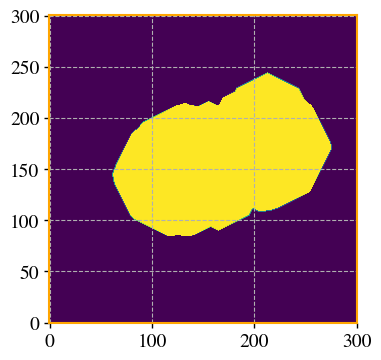

2025-06-24 00:22:24	WARN	componentlist::close	componentlist closed
2025-06-24 01:22:23 - INFO - Fitting image: /tmp/disk/LIRGI_Sample_done/for_spix/NGC7674/eM_C_VLA_Ku_Ka/C/im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-0000-image.cutout.CE.fits
2025-06-24 01:22:23 - DEBUG -  ==> Using provided mask region to constrain fit. 
2025-06-24 01:22:23 - WARNING -  !!++==> Fitting with a mask is faster, but experimental!! 
         Use with caution.
2025-06-24 01:22:23 - DEBUG - ---------------------------------------
2025-06-24 01:22:23 - DEBUG -  <<< PERFORMING CONVOLUTION WITH JAX >>> 
2025-06-24 01:22:23 - DEBUG - ---------------------------------------
2025-06-24 01:22:23 - DEBUG -  ==> Using provided RMS map. 


 ++==>> Limiting x0=152.63646045762187+/-5
 ++==>> Limiting y0=149.1034510688363+/-5
++==>> Fixing sersic index of component 1 to 0.5.
 ++==>> Limiting Rn_1 to 1.0
 ++==>> Limiting x0=171.5952544362878+/-5
 ++==>> Limiting y0=157.10506676648313+/-5
++==>> Fixing sersic index of component 2 to 0.5.
 ++==>> Limiting Rn_2 to 1.0
 ++==>> Limiting x0=128.283663476057+/-5
 ++==>> Limiting y0=146.5622038923163+/-5
++==>> Fixing sersic index of component 3 to 0.5.
 ++==>> Limiting x0=186.1710965346121+/-5
 ++==>> Limiting y0=165.16127649995528+/-5
++==>> Fixing sersic index of component 4 to 0.5.
 ++==>> Limiting x0=209.36359181405385+/-5
 ++==>> Limiting y0=175.22882460593718+/-5
++==>> Fixing sersic index of component 5 to 0.5.
 ++==>> Limiting Rn_5 to 1.0
 ++==>> Limiting x0=128.283663476057+/-50
 ++==>> Limiting y0=146.5622038923163+/-50
++==>> Fixing sersic index of component 6 to 0.5.
 ++==>> Limiting x0=209.36359181405385+/-50
 ++==>> Limiting y0=175.22882460593718+/-50
++==>> Fixing se

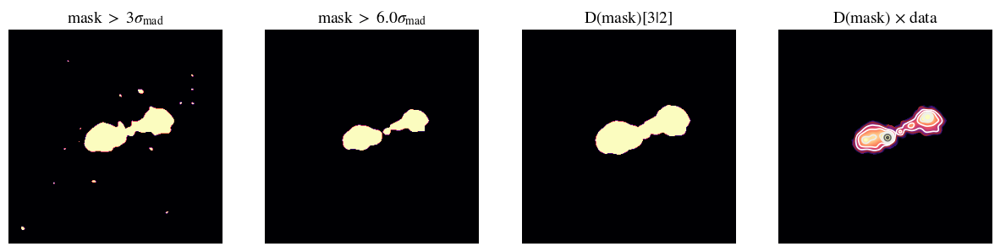

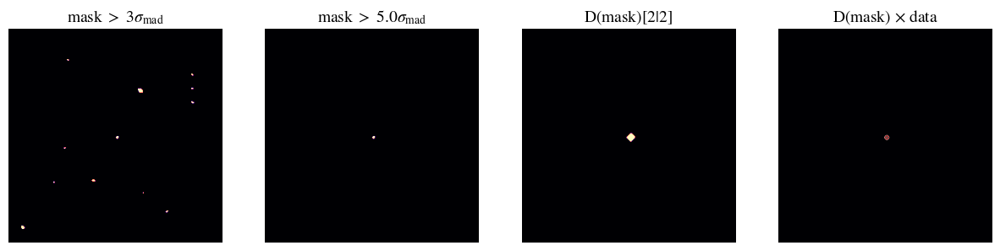

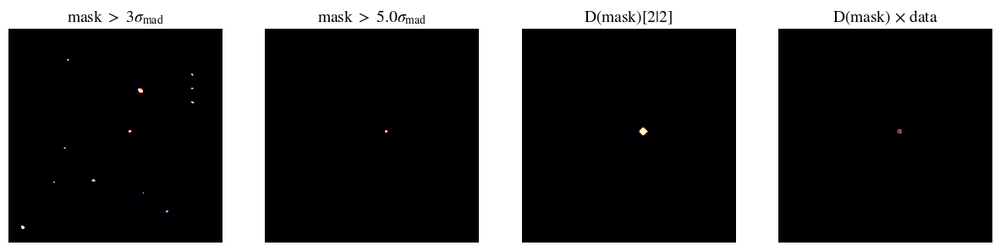

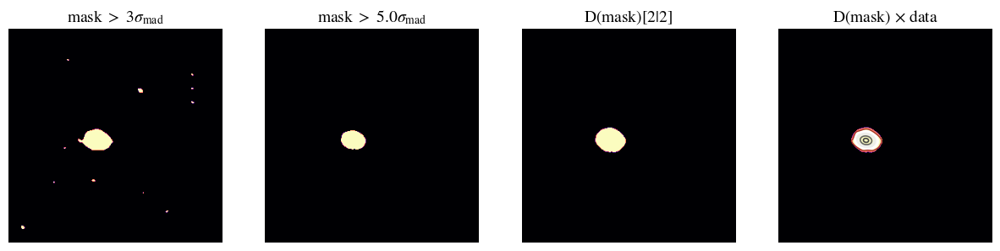

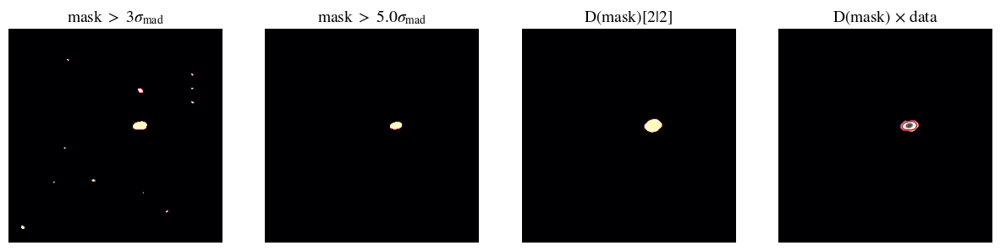

...

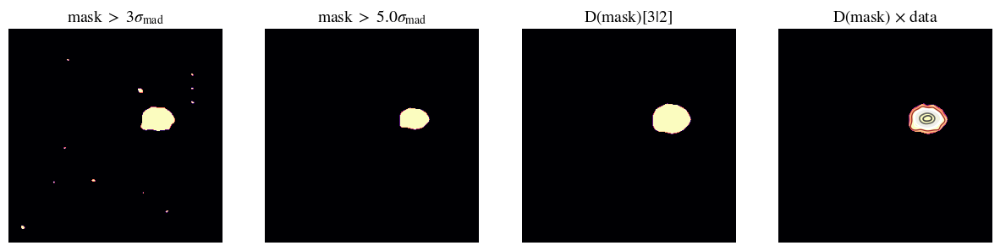

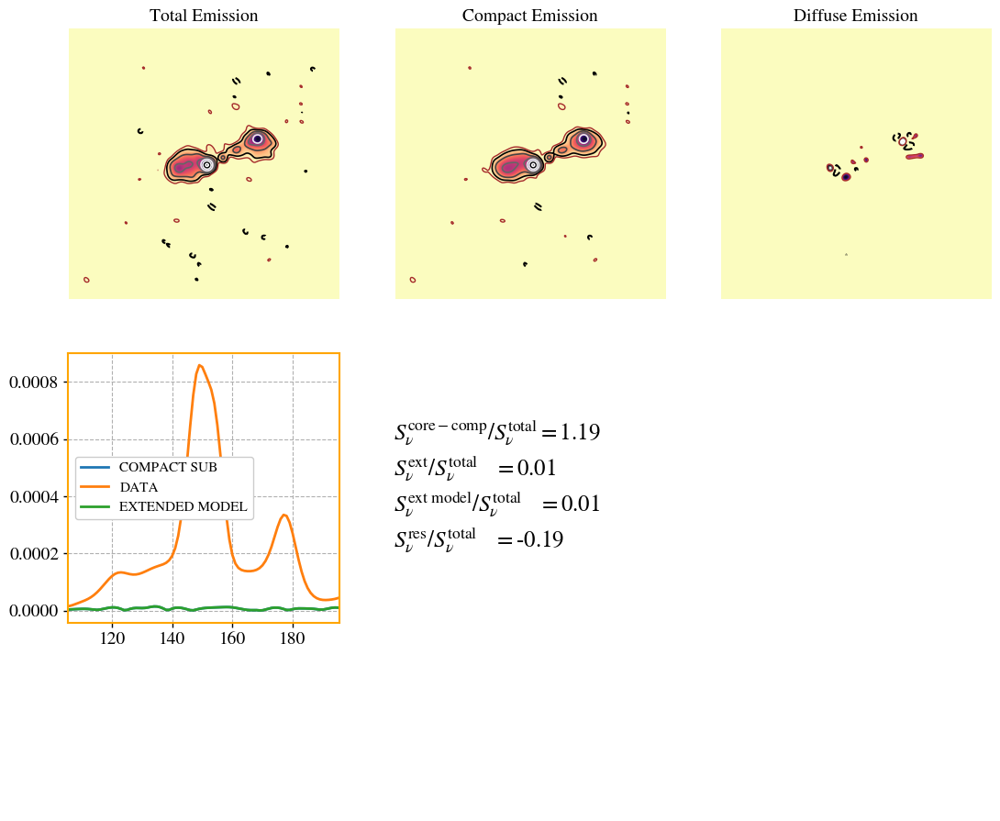

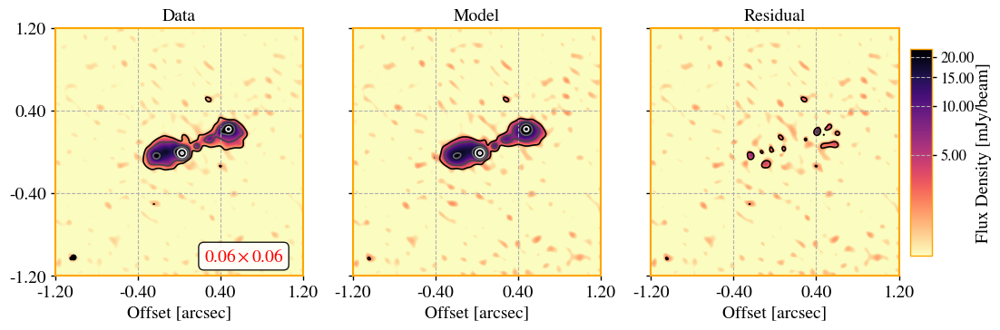

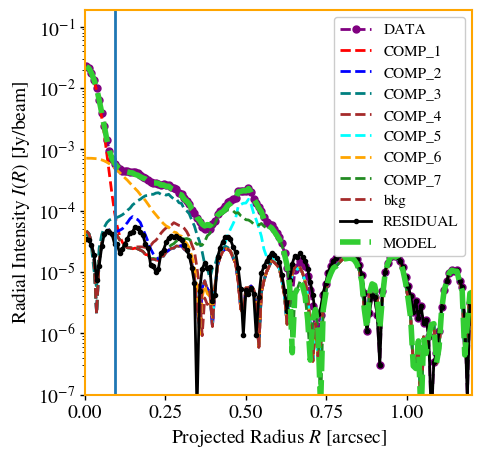

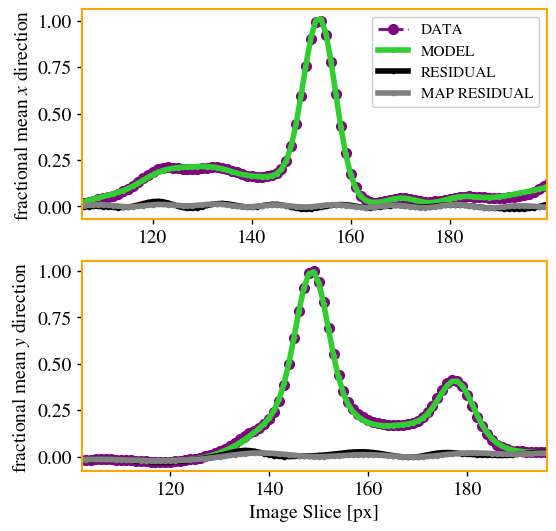

2025-06-24 01:27:50 - INFO - +--------------------------------+
2025-06-24 01:27:50 - INFO - | Core-Compact Component Sizes |
2025-06-24 01:27:50 - INFO - +--------------------------------+
2025-06-24 01:27:50 - INFO -  >=> 1 px = 4.81 pc
2025-06-24 01:27:50 - INFO -  >=> Beam Size = 7.00 px
2025-06-24 01:27:50 - INFO -  >=> Beam Size = 33.64  pc
2025-06-24 01:27:50 - INFO -  >=> Rn Main Compact = 2.86  pc
2025-06-24 01:27:50 - INFO -  >=> major axis FWHM = 5.72  pc
2025-06-24 01:27:50 - INFO -  >=> C50 Compact Deconv Radii = 21.99  pc
2025-06-24 01:27:50 - INFO -  >=> C50 Compact Conv Radii = 50.89  pc
2025-06-24 01:27:50 - INFO -  >=> C95 Compact Deconv Radii = 118.63  pc
2025-06-24 01:27:50 - INFO -  >=> C95 Compact Conv Radii = 141.35  pc
2025-06-24 01:27:50 - INFO - +----------------------------+
2025-06-24 01:27:50 - INFO - | Extended Component Sizes |
2025-06-24 01:27:50 - INFO - +----------------------------+
2025-06-24 01:27:50 - INFO -  >=> C50 Extended Deconv Radii = 41.08  

++>> Image File: im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-0001-image.cutout.CE.fits
++>> Residual File: im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-0001-residual.cutout.CE.fits
-->> No PSF File was provided.
-->> Warning: Could not determine Jy conversion factor from header

===== Image Units and Conversion Information =====
Instrument: None
Filter: None
Original units: JY/BEAM
Pixel scale: 0.0080 arcsec/pixel

++==>> Using mini from initial mini run.
  ++==>>  Fitting im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-0001-image.cutout.CE.fits
++==>> USING MASK FOR FITTTTTTTTTTTTTTTT 
++==>> USING PROVIDED MASK FOR FIT IS NOT NONE


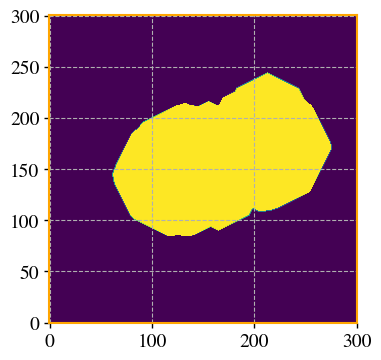

2025-06-24 00:27:57	WARN	componentlist::close	componentlist closed
2025-06-24 01:27:57 - INFO - Fitting image: /tmp/disk/LIRGI_Sample_done/for_spix/NGC7674/eM_C_VLA_Ku_Ka/C/im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-0001-image.cutout.CE.fits
2025-06-24 01:27:57 - DEBUG -  ==> Using provided mask region to constrain fit. 
2025-06-24 01:27:57 - WARNING -  !!++==> Fitting with a mask is faster, but experimental!! 
         Use with caution.
2025-06-24 01:27:57 - DEBUG - ---------------------------------------
2025-06-24 01:27:57 - DEBUG -  <<< PERFORMING CONVOLUTION WITH JAX >>> 
2025-06-24 01:27:57 - DEBUG - ---------------------------------------
2025-06-24 01:27:57 - DEBUG -  ==> Using provided RMS map. 


 ++==>> Limiting x0=152.63646045762187+/-5
 ++==>> Limiting y0=149.1034510688363+/-5
++==>> Fixing sersic index of component 1 to 0.5.
 ++==>> Limiting Rn_1 to 1.0
 ++==>> Limiting x0=171.5952544362878+/-5
 ++==>> Limiting y0=157.10506676648313+/-5
++==>> Fixing sersic index of component 2 to 0.5.
 ++==>> Limiting Rn_2 to 1.0
 ++==>> Limiting x0=128.283663476057+/-5
 ++==>> Limiting y0=146.5622038923163+/-5
++==>> Fixing sersic index of component 3 to 0.5.
 ++==>> Limiting x0=186.1710965346121+/-5
 ++==>> Limiting y0=165.16127649995528+/-5
++==>> Fixing sersic index of component 4 to 0.5.
 ++==>> Limiting x0=209.36359181405385+/-5
 ++==>> Limiting y0=175.22882460593718+/-5
++==>> Fixing sersic index of component 5 to 0.5.
 ++==>> Limiting Rn_5 to 1.0
 ++==>> Limiting x0=128.283663476057+/-50
 ++==>> Limiting y0=146.5622038923163+/-50
++==>> Fixing sersic index of component 6 to 0.5.
 ++==>> Limiting x0=209.36359181405385+/-50
 ++==>> Limiting y0=175.22882460593718+/-50
++==>> Fixing se

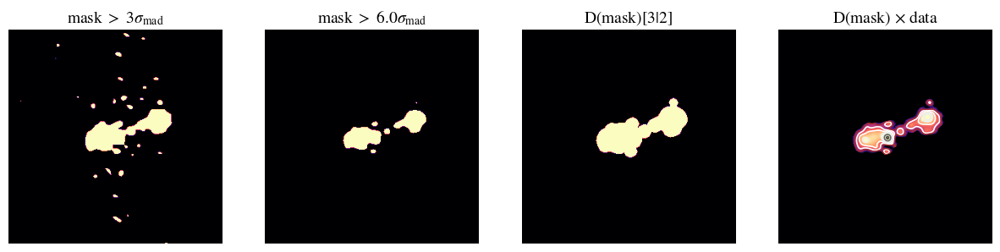

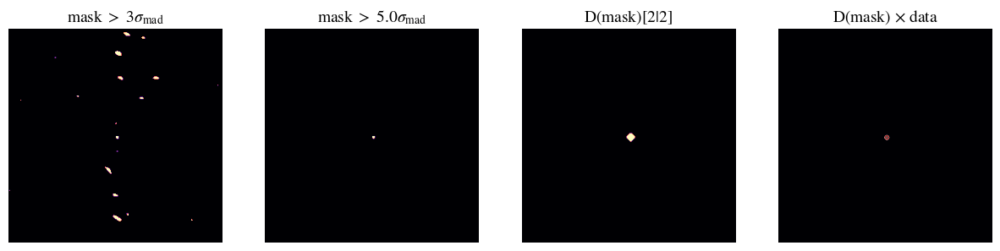

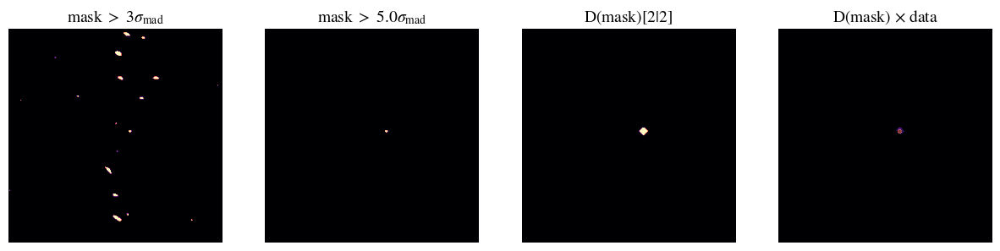

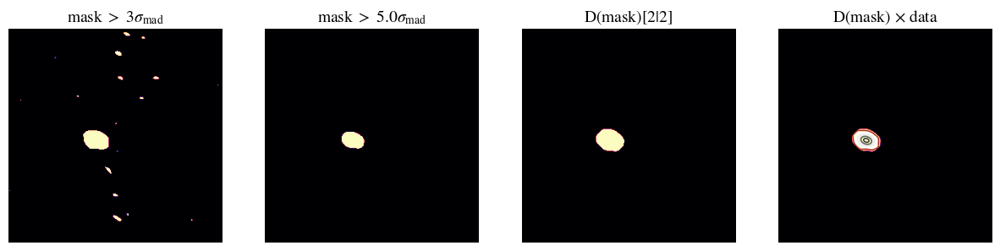

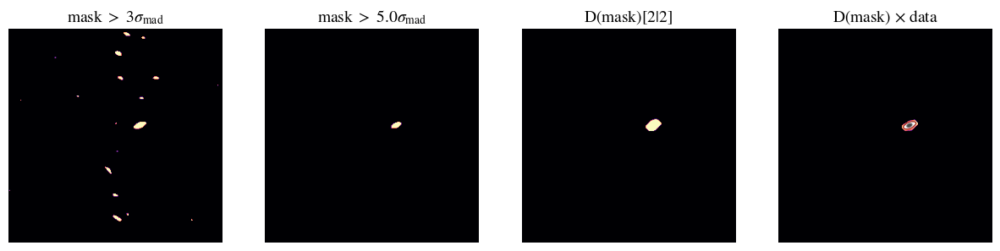

...

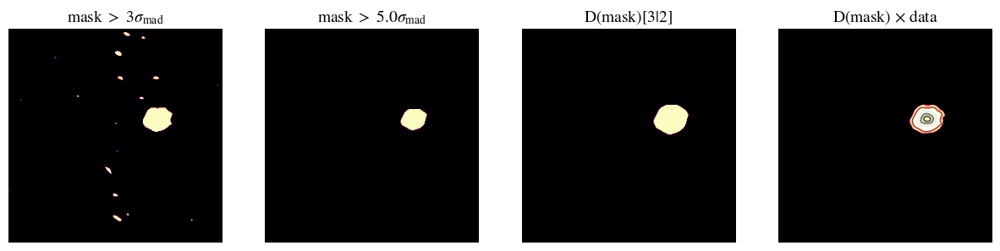

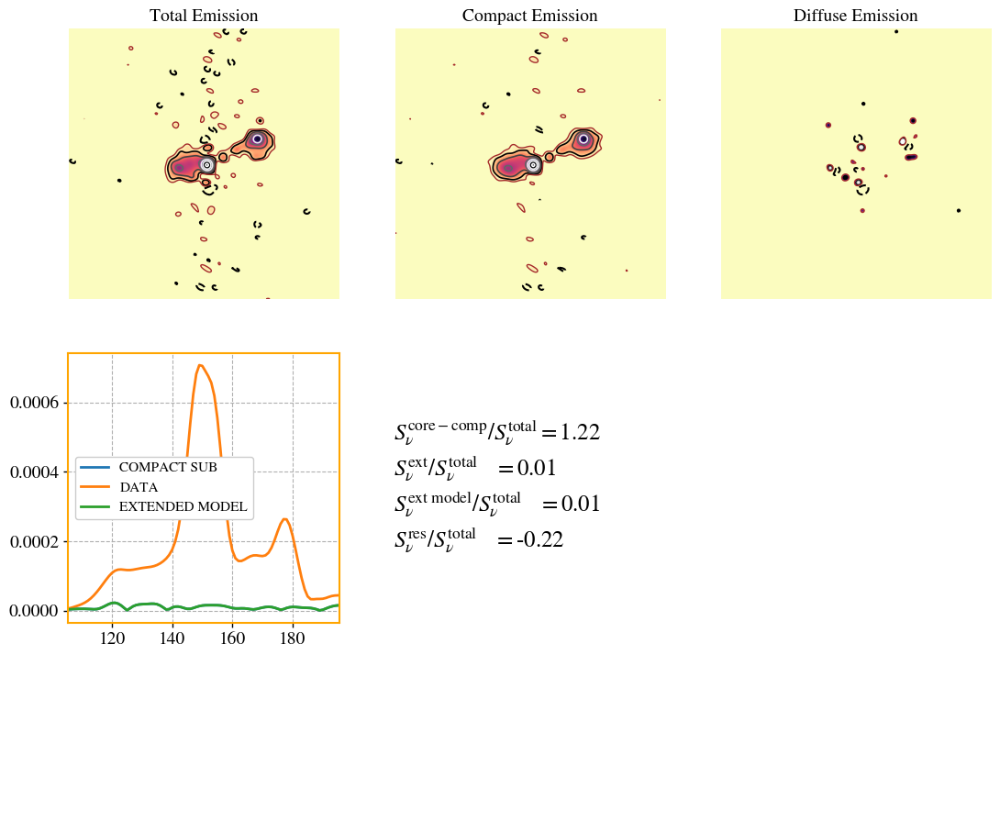

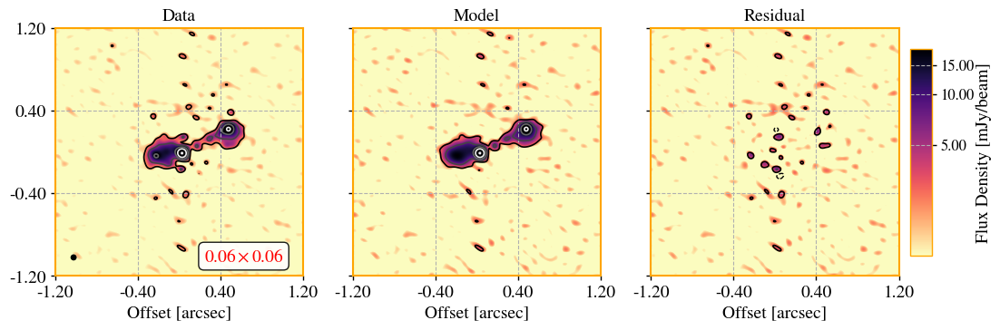

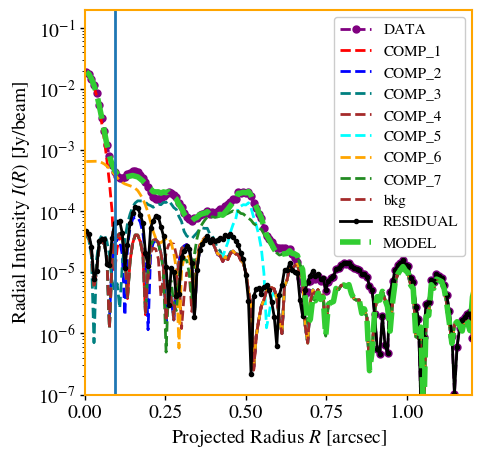

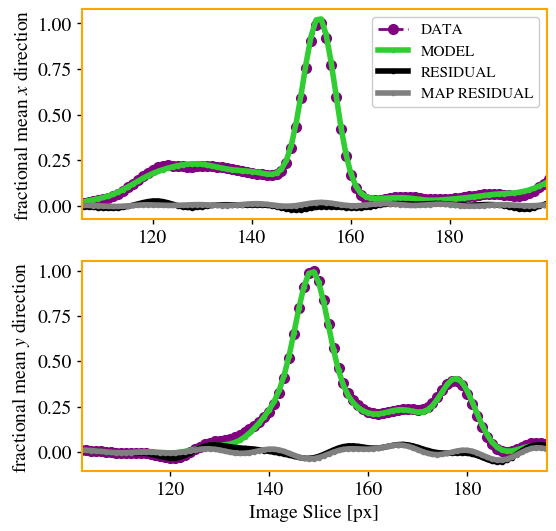

2025-06-24 01:31:55 - INFO - +--------------------------------+
2025-06-24 01:31:55 - INFO - | Core-Compact Component Sizes |
2025-06-24 01:31:55 - INFO - +--------------------------------+
2025-06-24 01:31:55 - INFO -  >=> 1 px = 4.81 pc
2025-06-24 01:31:55 - INFO -  >=> Beam Size = 7.00 px
2025-06-24 01:31:55 - INFO -  >=> Beam Size = 33.64  pc
2025-06-24 01:31:55 - INFO -  >=> Rn Main Compact = 3.06  pc
2025-06-24 01:31:55 - INFO -  >=> major axis FWHM = 6.13  pc
2025-06-24 01:31:55 - INFO -  >=> C50 Compact Deconv Radii = 19.77  pc
2025-06-24 01:31:55 - INFO -  >=> C50 Compact Conv Radii = 51.39  pc
2025-06-24 01:31:55 - INFO -  >=> C95 Compact Deconv Radii = 111.16  pc
2025-06-24 01:31:55 - INFO -  >=> C95 Compact Conv Radii = 140.14  pc
2025-06-24 01:31:55 - INFO - +----------------------------+
2025-06-24 01:31:55 - INFO - | Extended Component Sizes |
2025-06-24 01:31:55 - INFO - +----------------------------+
2025-06-24 01:31:55 - INFO -  >=> C50 Extended Deconv Radii = 39.02  

++>> Image File: im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-0002-image.cutout.CE.fits
++>> Residual File: im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-0002-residual.cutout.CE.fits
-->> No PSF File was provided.
-->> Warning: Could not determine Jy conversion factor from header

===== Image Units and Conversion Information =====
Instrument: None
Filter: None
Original units: JY/BEAM
Pixel scale: 0.0080 arcsec/pixel

++==>> Using mini from initial mini run.
  ++==>>  Fitting im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-0002-image.cutout.CE.fits
++==>> USING MASK FOR FITTTTTTTTTTTTTTTT 
++==>> USING PROVIDED MASK FOR FIT IS NOT NONE


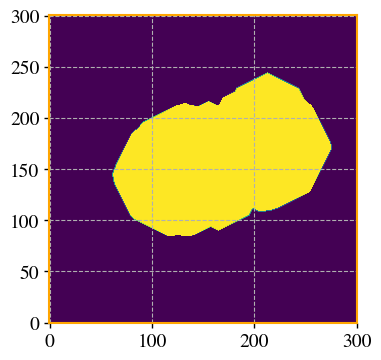

2025-06-24 00:32:04	WARN	componentlist::close	componentlist closed
2025-06-24 01:32:03 - INFO - Fitting image: /tmp/disk/LIRGI_Sample_done/for_spix/NGC7674/eM_C_VLA_Ku_Ka/C/im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-0002-image.cutout.CE.fits
2025-06-24 01:32:03 - DEBUG -  ==> Using provided mask region to constrain fit. 
2025-06-24 01:32:03 - WARNING -  !!++==> Fitting with a mask is faster, but experimental!! 
         Use with caution.
2025-06-24 01:32:03 - DEBUG - ---------------------------------------
2025-06-24 01:32:03 - DEBUG -  <<< PERFORMING CONVOLUTION WITH JAX >>> 
2025-06-24 01:32:03 - DEBUG - ---------------------------------------
2025-06-24 01:32:03 - DEBUG -  ==> Using provided RMS map. 


 ++==>> Limiting x0=152.63646045762187+/-5
 ++==>> Limiting y0=149.1034510688363+/-5
++==>> Fixing sersic index of component 1 to 0.5.
 ++==>> Limiting Rn_1 to 1.0
 ++==>> Limiting x0=171.5952544362878+/-5
 ++==>> Limiting y0=157.10506676648313+/-5
++==>> Fixing sersic index of component 2 to 0.5.
 ++==>> Limiting Rn_2 to 1.0
 ++==>> Limiting x0=128.283663476057+/-5
 ++==>> Limiting y0=146.5622038923163+/-5
++==>> Fixing sersic index of component 3 to 0.5.
 ++==>> Limiting x0=186.1710965346121+/-5
 ++==>> Limiting y0=165.16127649995528+/-5
++==>> Fixing sersic index of component 4 to 0.5.
 ++==>> Limiting x0=209.36359181405385+/-5
 ++==>> Limiting y0=175.22882460593718+/-5
++==>> Fixing sersic index of component 5 to 0.5.
 ++==>> Limiting Rn_5 to 1.0
 ++==>> Limiting x0=128.283663476057+/-50
 ++==>> Limiting y0=146.5622038923163+/-50
++==>> Fixing sersic index of component 6 to 0.5.
 ++==>> Limiting x0=209.36359181405385+/-50
 ++==>> Limiting y0=175.22882460593718+/-50
++==>> Fixing se

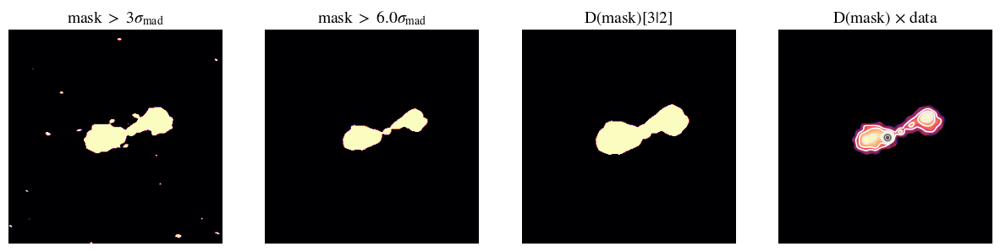

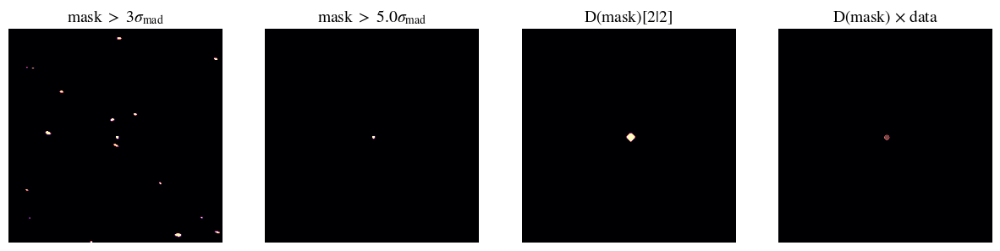

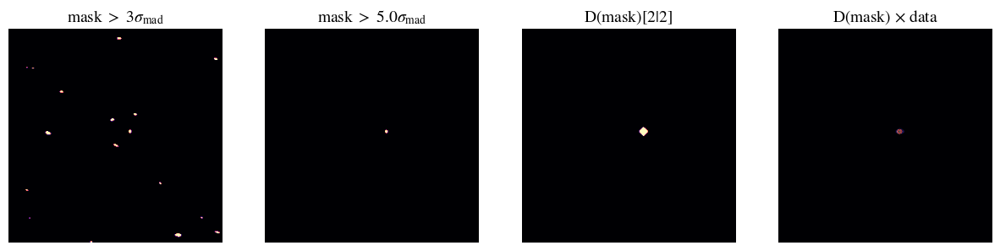

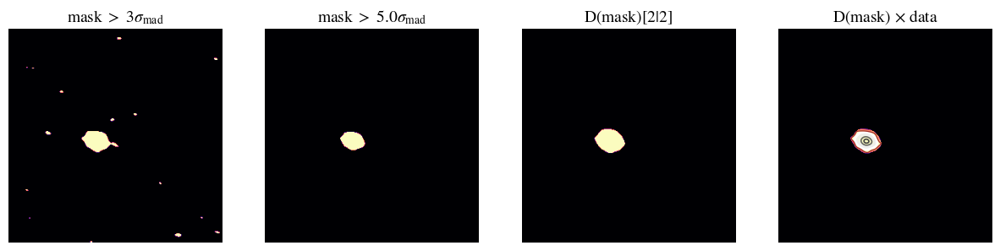

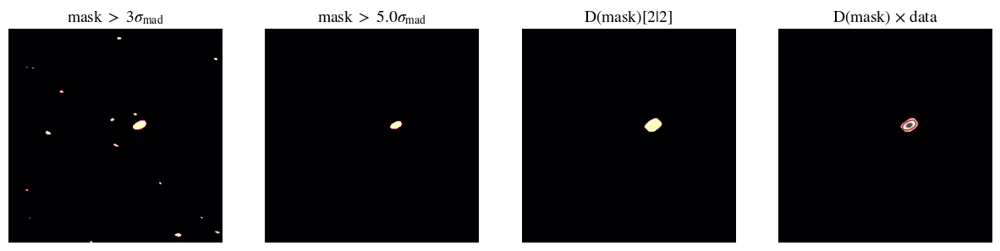

...

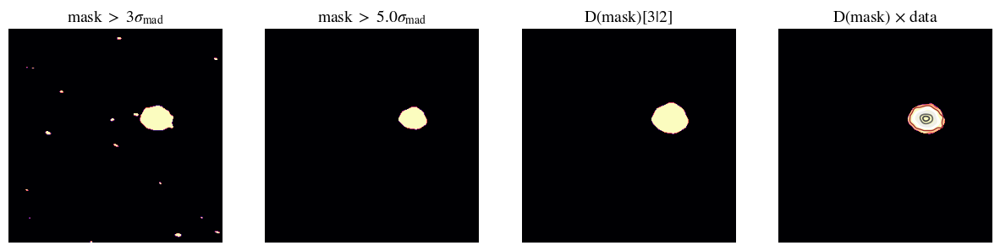

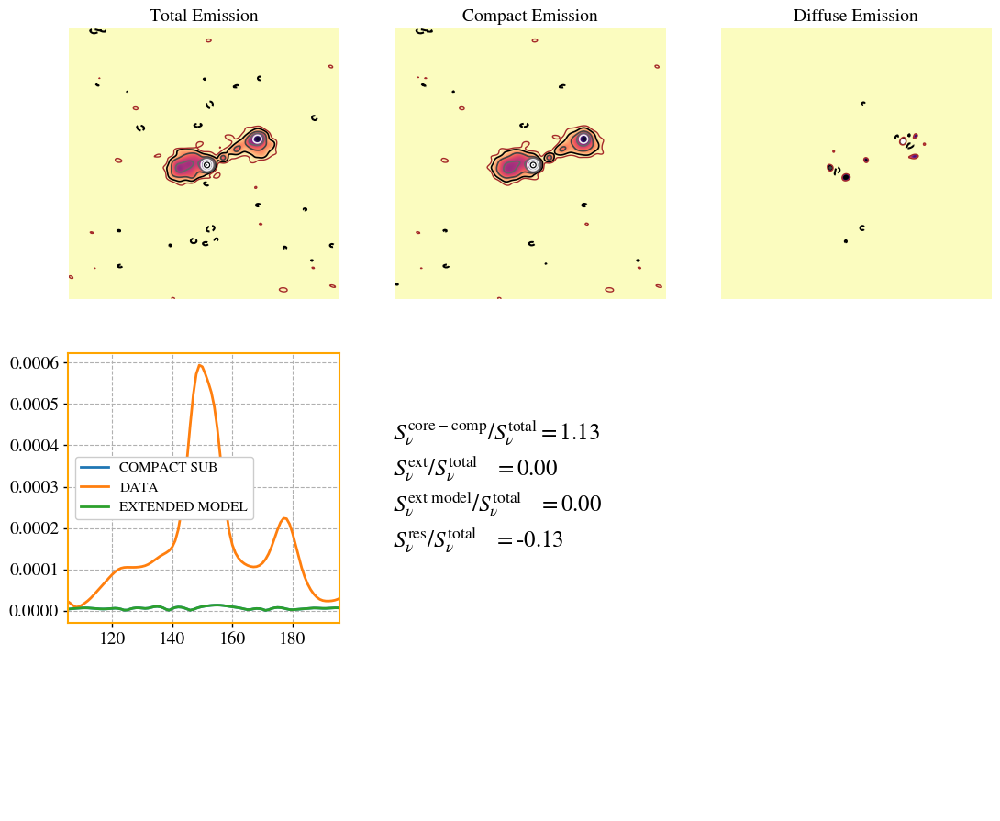

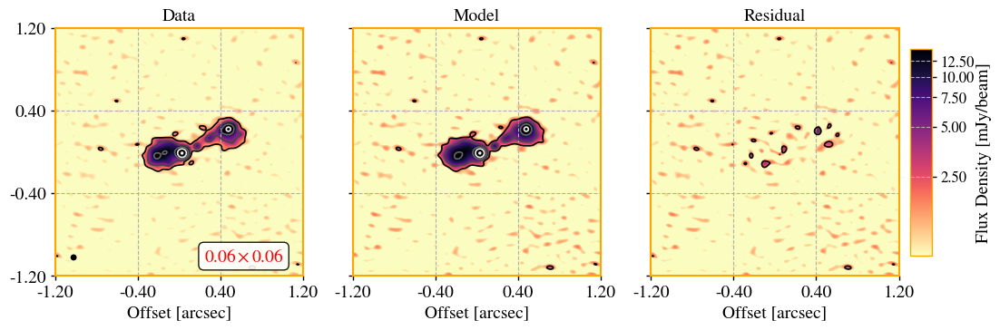

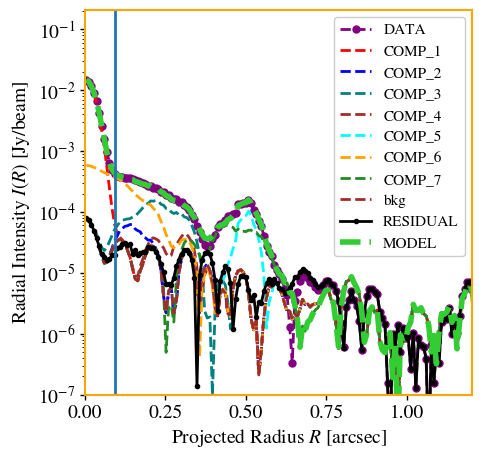

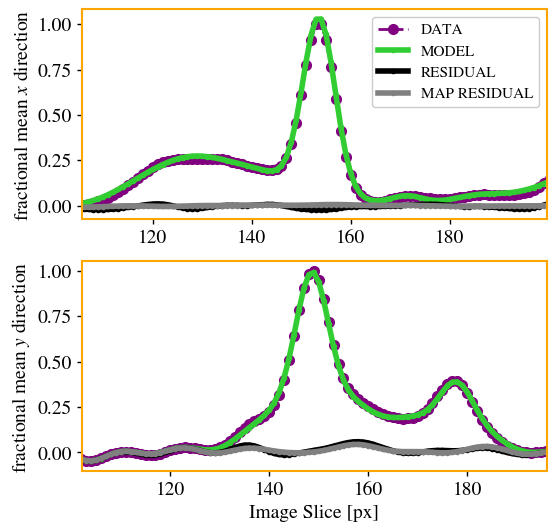

2025-06-24 01:34:46 - INFO - +--------------------------------+
2025-06-24 01:34:46 - INFO - | Core-Compact Component Sizes |
2025-06-24 01:34:46 - INFO - +--------------------------------+
2025-06-24 01:34:46 - INFO -  >=> 1 px = 4.81 pc
2025-06-24 01:34:46 - INFO -  >=> Beam Size = 7.00 px
2025-06-24 01:34:46 - INFO -  >=> Beam Size = 33.64  pc
2025-06-24 01:34:46 - INFO -  >=> Rn Main Compact = 2.98  pc
2025-06-24 01:34:46 - INFO -  >=> major axis FWHM = 5.96  pc
2025-06-24 01:34:46 - INFO -  >=> C50 Compact Deconv Radii = 28.99  pc
2025-06-24 01:34:46 - INFO -  >=> C50 Compact Conv Radii = 56.06  pc
2025-06-24 01:34:46 - INFO -  >=> C95 Compact Deconv Radii = 116.88  pc
2025-06-24 01:34:46 - INFO -  >=> C95 Compact Conv Radii = 143.60  pc
2025-06-24 01:34:46 - INFO - +----------------------------+
2025-06-24 01:34:46 - INFO - | Extended Component Sizes |
2025-06-24 01:34:46 - INFO - +----------------------------+
2025-06-24 01:34:46 - INFO -  >=> C50 Extended Deconv Radii = 39.46  

++>> Image File: im_nc3_cb_bs_0.06asec_NGC7674_A_Ka_sf_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r1.0-0000-image.cutout.CE.fits
++>> Residual File: im_nc3_cb_bs_0.06asec_NGC7674_A_Ka_sf_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r1.0-0000-residual.cutout.CE.fits
-->> No PSF File was provided.
-->> Warning: Could not determine Jy conversion factor from header

===== Image Units and Conversion Information =====
Instrument: None
Filter: None
Original units: JY/BEAM
Pixel scale: 0.0080 arcsec/pixel

++==>> Using mini from initial mini run.
  ++==>>  Fitting im_nc3_cb_bs_0.06asec_NGC7674_A_Ka_sf_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r1.0-0000-image.cutout.CE.fits
++==>> USING MASK FOR FITTTTTTTTTTTTTTTT 
++==>> USING PROVIDED MASK FOR FIT IS NOT NONE


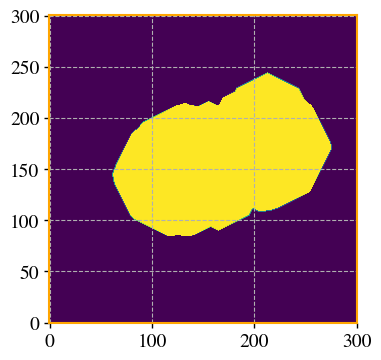

2025-06-24 00:34:49	WARN	componentlist::close	componentlist closed
2025-06-24 01:34:49 - INFO - Fitting image: /tmp/disk/LIRGI_Sample_done/for_spix/NGC7674/eM_C_VLA_Ku_Ka/Ka/im_nc3_cb_bs_0.06asec_NGC7674_A_Ka_sf_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r1.0-0000-image.cutout.CE.fits
2025-06-24 01:34:49 - DEBUG -  ==> Using provided mask region to constrain fit. 
2025-06-24 01:34:49 - WARNING -  !!++==> Fitting with a mask is faster, but experimental!! 
         Use with caution.
2025-06-24 01:34:49 - DEBUG - ---------------------------------------
2025-06-24 01:34:49 - DEBUG -  <<< PERFORMING CONVOLUTION WITH JAX >>> 
2025-06-24 01:34:49 - DEBUG - ---------------------------------------
2025-06-24 01:34:49 - DEBUG -  ==> Using provided RMS map. 


 ++==>> Limiting x0=152.63646045762187+/-5
 ++==>> Limiting y0=149.1034510688363+/-5
++==>> Fixing sersic index of component 1 to 0.5.
 ++==>> Limiting Rn_1 to 1.0
 ++==>> Limiting x0=171.5952544362878+/-5
 ++==>> Limiting y0=157.10506676648313+/-5
++==>> Fixing sersic index of component 2 to 0.5.
 ++==>> Limiting Rn_2 to 1.0
 ++==>> Limiting x0=128.283663476057+/-5
 ++==>> Limiting y0=146.5622038923163+/-5
++==>> Fixing sersic index of component 3 to 0.5.
 ++==>> Limiting x0=186.1710965346121+/-5
 ++==>> Limiting y0=165.16127649995528+/-5
++==>> Fixing sersic index of component 4 to 0.5.
 ++==>> Limiting x0=209.36359181405385+/-5
 ++==>> Limiting y0=175.22882460593718+/-5
++==>> Fixing sersic index of component 5 to 0.5.
 ++==>> Limiting Rn_5 to 1.0
 ++==>> Limiting x0=128.283663476057+/-50
 ++==>> Limiting y0=146.5622038923163+/-50
++==>> Fixing sersic index of component 6 to 0.5.
 ++==>> Limiting x0=209.36359181405385+/-50
 ++==>> Limiting y0=175.22882460593718+/-50
++==>> Fixing se

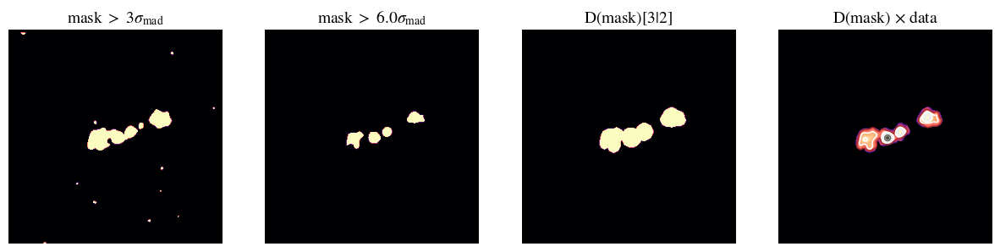

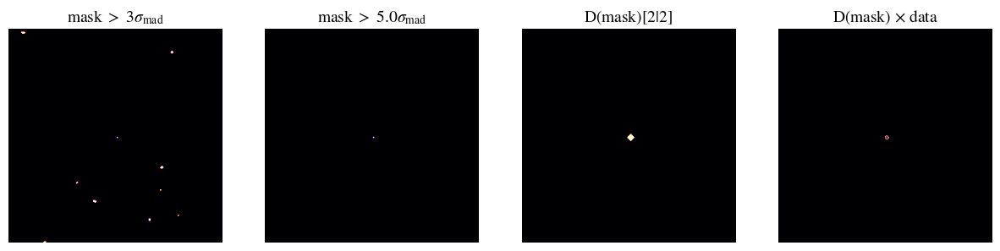

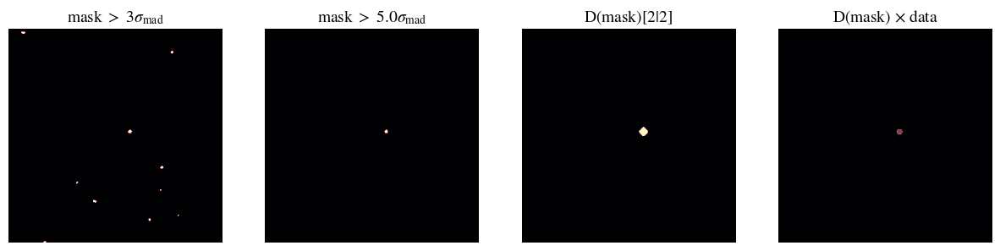

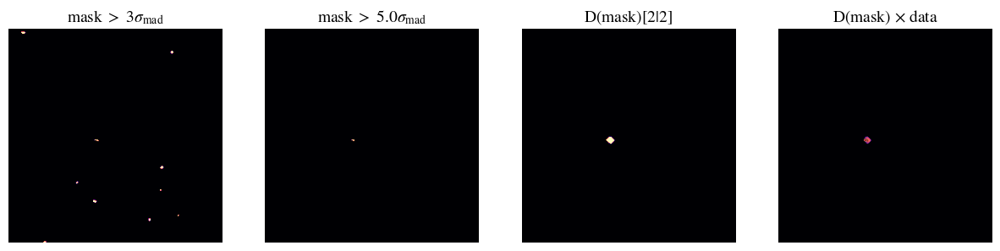

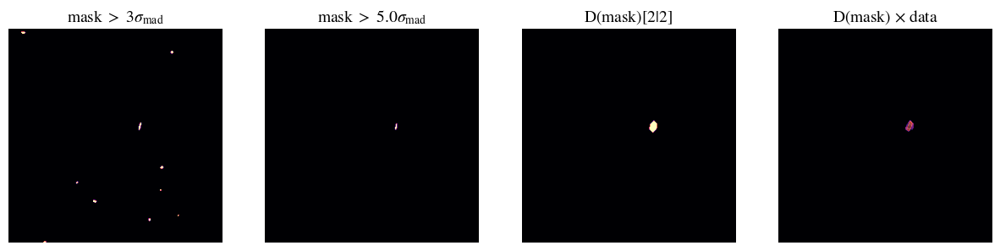

...

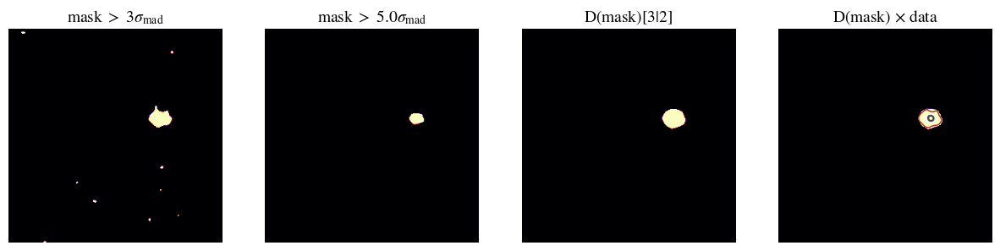

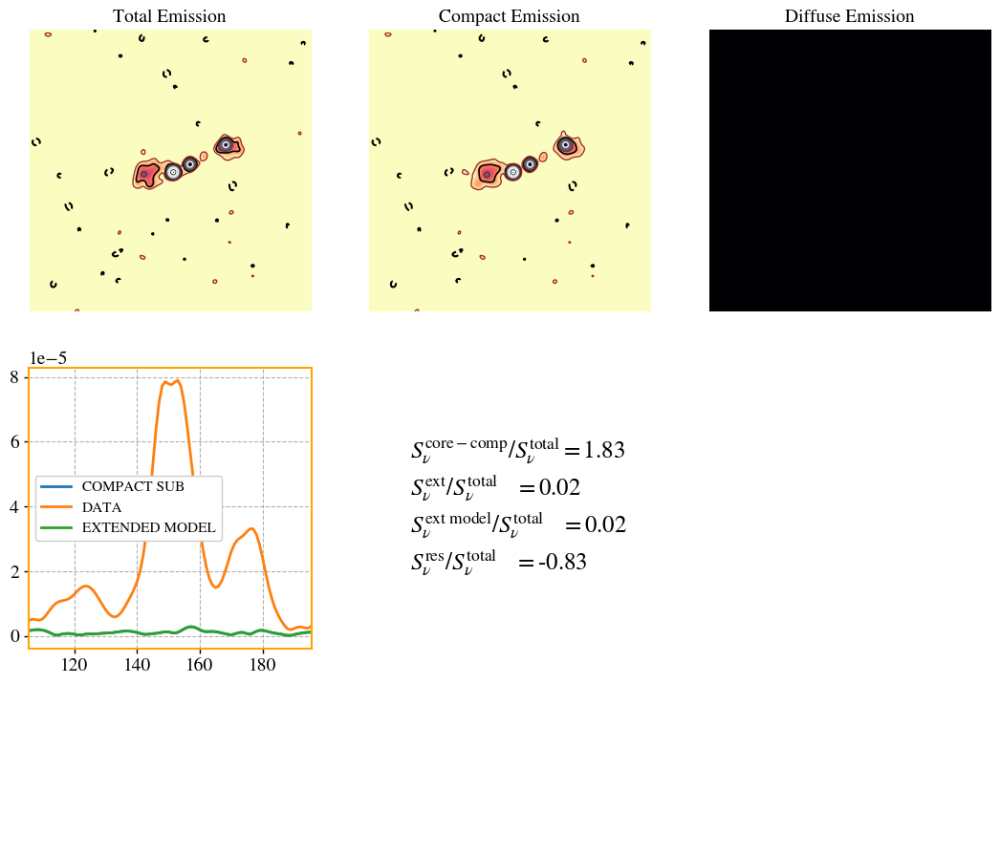

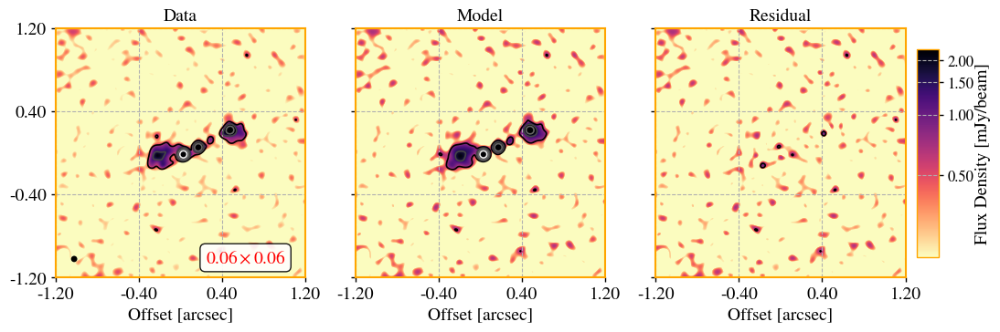

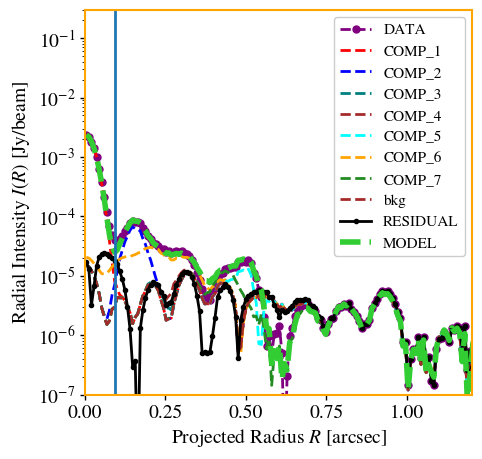

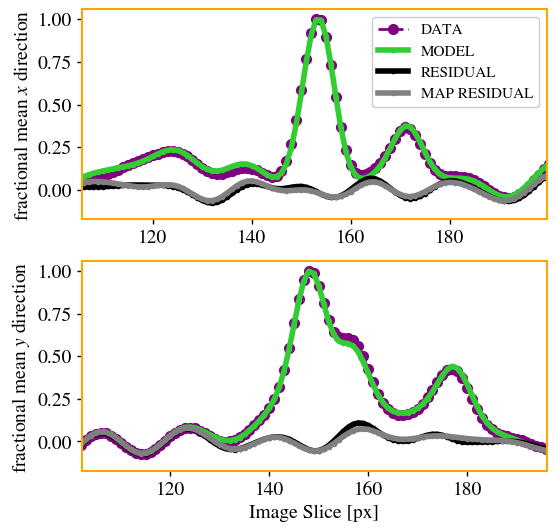

2025-06-24 01:39:25 - INFO - +--------------------------------+
2025-06-24 01:39:25 - INFO - | Core-Compact Component Sizes |
2025-06-24 01:39:25 - INFO - +--------------------------------+
2025-06-24 01:39:25 - INFO -  >=> 1 px = 4.81 pc
2025-06-24 01:39:25 - INFO -  >=> Beam Size = 7.00 px
2025-06-24 01:39:25 - INFO -  >=> Beam Size = 33.64  pc
2025-06-24 01:39:25 - INFO -  >=> Rn Main Compact = 1.94  pc
2025-06-24 01:39:25 - INFO -  >=> major axis FWHM = 3.87  pc
2025-06-24 01:39:25 - INFO -  >=> C50 Compact Deconv Radii = 5.40  pc
2025-06-24 01:39:25 - INFO -  >=> C50 Compact Conv Radii = 42.91  pc
2025-06-24 01:39:25 - INFO -  >=> C95 Compact Deconv Radii = 35.16  pc
2025-06-24 01:39:25 - INFO -  >=> C95 Compact Conv Radii = 115.48  pc
2025-06-24 01:39:25 - INFO - +----------------------------+
2025-06-24 01:39:25 - INFO - | Extended Component Sizes |
2025-06-24 01:39:25 - INFO - +----------------------------+
2025-06-24 01:39:25 - INFO -  >=> C50 Extended Deconv Radii = 28.79  pc

++>> Image File: im_nc3_cb_bs_0.06asec_NGC7674_A_Ka_sf_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r1.0-0001-image.cutout.CE.fits
++>> Residual File: im_nc3_cb_bs_0.06asec_NGC7674_A_Ka_sf_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r1.0-0001-residual.cutout.CE.fits
-->> No PSF File was provided.
-->> Warning: Could not determine Jy conversion factor from header

===== Image Units and Conversion Information =====
Instrument: None
Filter: None
Original units: JY/BEAM
Pixel scale: 0.0080 arcsec/pixel

++==>> Using mini from initial mini run.
  ++==>>  Fitting im_nc3_cb_bs_0.06asec_NGC7674_A_Ka_sf_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r1.0-0001-image.cutout.CE.fits
++==>> USING MASK FOR FITTTTTTTTTTTTTTTT 
++==>> USING PROVIDED MASK FOR FIT IS NOT NONE


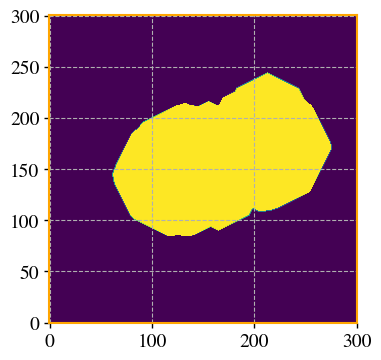

2025-06-24 00:39:29	WARN	componentlist::close	componentlist closed
2025-06-24 01:39:28 - INFO - Fitting image: /tmp/disk/LIRGI_Sample_done/for_spix/NGC7674/eM_C_VLA_Ku_Ka/Ka/im_nc3_cb_bs_0.06asec_NGC7674_A_Ka_sf_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r1.0-0001-image.cutout.CE.fits
2025-06-24 01:39:28 - DEBUG -  ==> Using provided mask region to constrain fit. 
2025-06-24 01:39:28 - WARNING -  !!++==> Fitting with a mask is faster, but experimental!! 
         Use with caution.
2025-06-24 01:39:28 - DEBUG - ---------------------------------------
2025-06-24 01:39:28 - DEBUG -  <<< PERFORMING CONVOLUTION WITH JAX >>> 
2025-06-24 01:39:28 - DEBUG - ---------------------------------------
2025-06-24 01:39:28 - DEBUG -  ==> Using provided RMS map. 


 ++==>> Limiting x0=152.63646045762187+/-5
 ++==>> Limiting y0=149.1034510688363+/-5
++==>> Fixing sersic index of component 1 to 0.5.
 ++==>> Limiting Rn_1 to 1.0
 ++==>> Limiting x0=171.5952544362878+/-5
 ++==>> Limiting y0=157.10506676648313+/-5
++==>> Fixing sersic index of component 2 to 0.5.
 ++==>> Limiting Rn_2 to 1.0
 ++==>> Limiting x0=128.283663476057+/-5
 ++==>> Limiting y0=146.5622038923163+/-5
++==>> Fixing sersic index of component 3 to 0.5.
 ++==>> Limiting x0=186.1710965346121+/-5
 ++==>> Limiting y0=165.16127649995528+/-5
++==>> Fixing sersic index of component 4 to 0.5.
 ++==>> Limiting x0=209.36359181405385+/-5
 ++==>> Limiting y0=175.22882460593718+/-5
++==>> Fixing sersic index of component 5 to 0.5.
 ++==>> Limiting Rn_5 to 1.0
 ++==>> Limiting x0=128.283663476057+/-50
 ++==>> Limiting y0=146.5622038923163+/-50
++==>> Fixing sersic index of component 6 to 0.5.
 ++==>> Limiting x0=209.36359181405385+/-50
 ++==>> Limiting y0=175.22882460593718+/-50
++==>> Fixing se

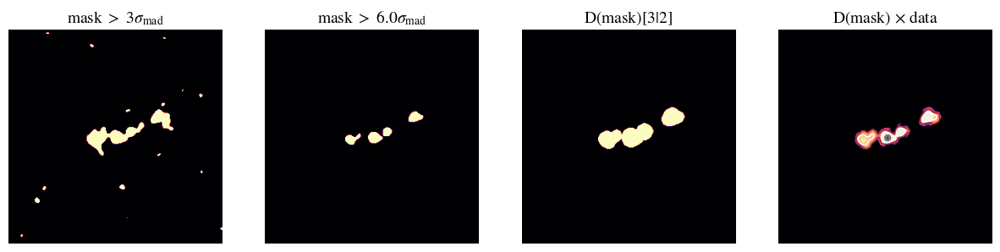

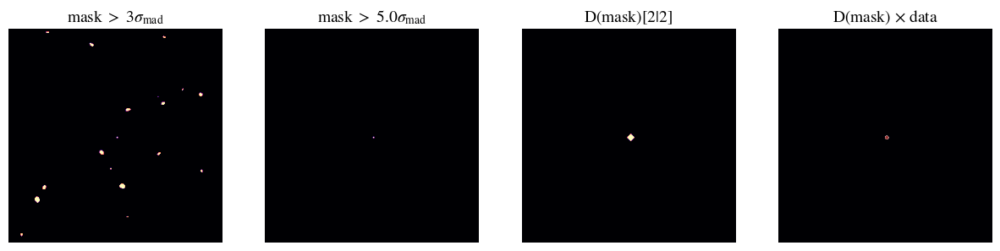

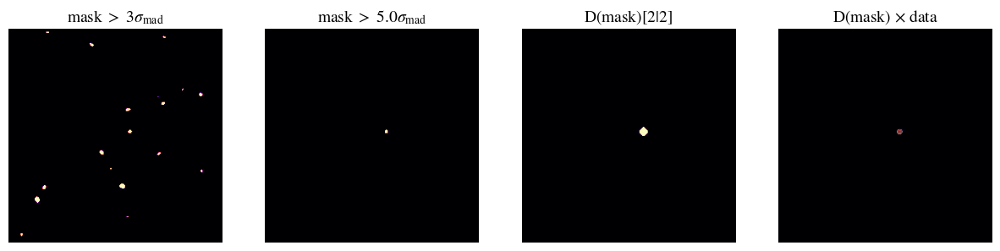

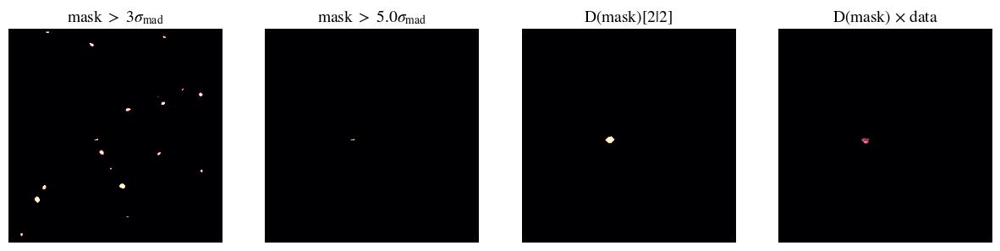

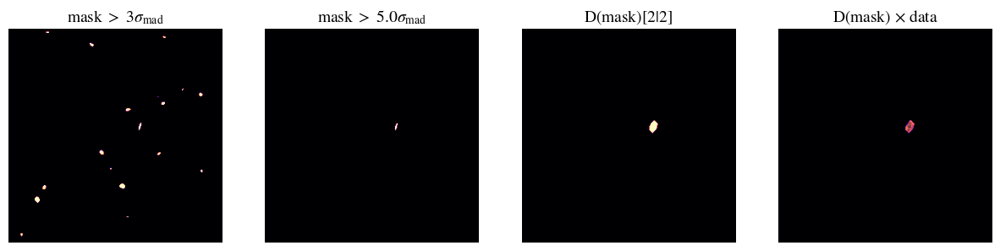

...

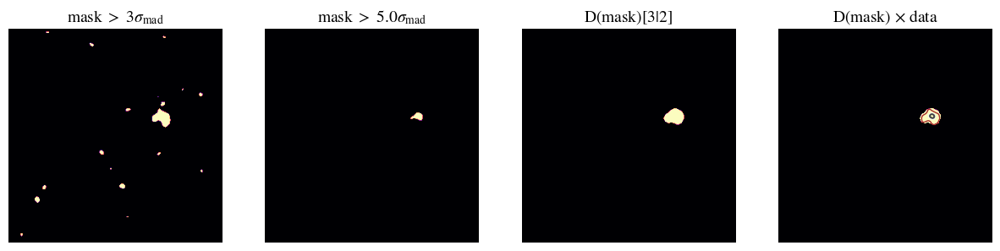

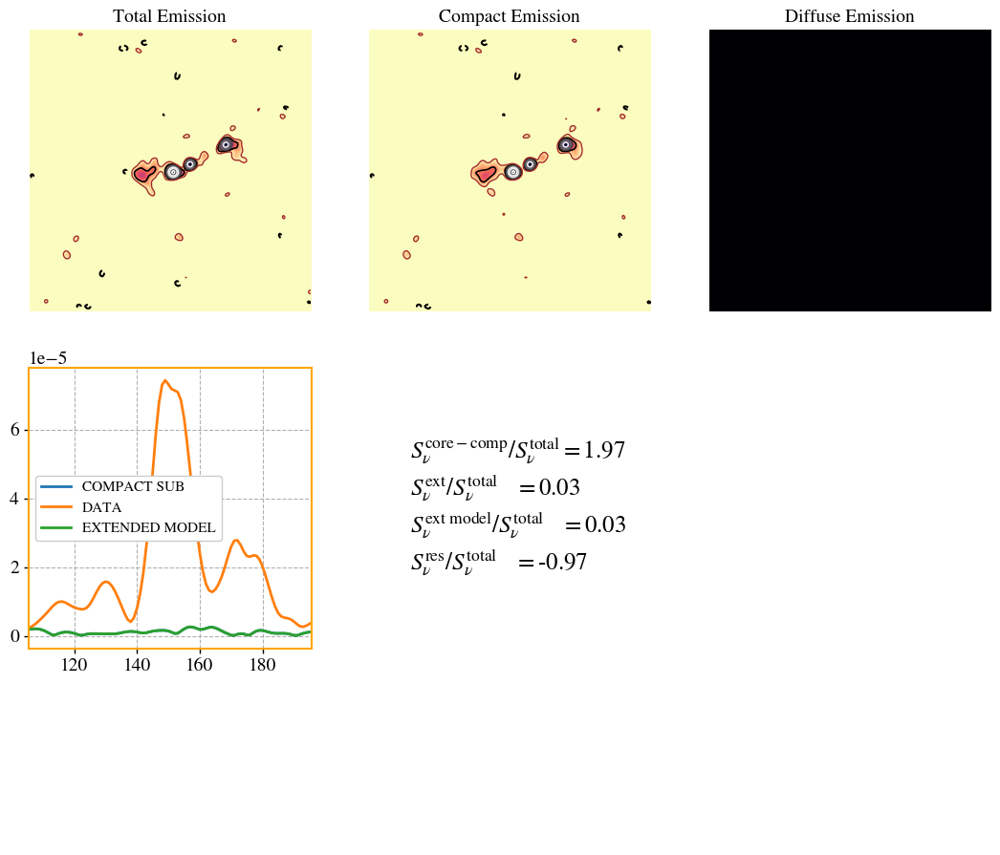

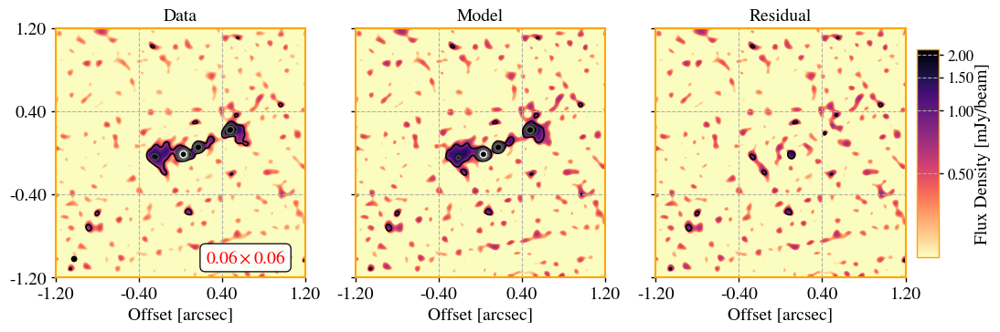

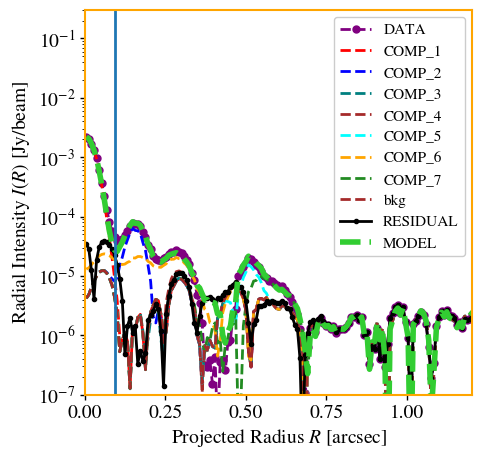

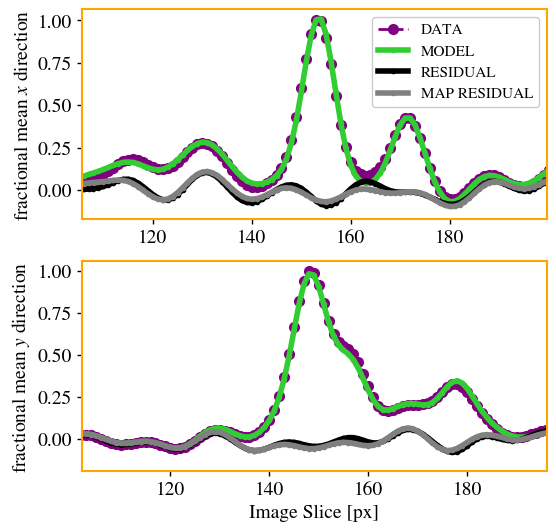

     -->> ERROR when computing Petrosian properties. Will flag error_petro as True.


2025-06-24 01:47:35 - INFO - +--------------------------------+
2025-06-24 01:47:35 - INFO - | Core-Compact Component Sizes |
2025-06-24 01:47:35 - INFO - +--------------------------------+
2025-06-24 01:47:35 - INFO -  >=> 1 px = 4.81 pc
2025-06-24 01:47:35 - INFO -  >=> Beam Size = 7.00 px
2025-06-24 01:47:35 - INFO -  >=> Beam Size = 33.64  pc
2025-06-24 01:47:35 - INFO -  >=> Rn Main Compact = 1.92  pc
2025-06-24 01:47:35 - INFO -  >=> major axis FWHM = 3.85  pc
2025-06-24 01:47:35 - INFO -  >=> C50 Compact Deconv Radii = 5.01  pc
2025-06-24 01:47:35 - INFO -  >=> C50 Compact Conv Radii = 39.39  pc
2025-06-24 01:47:35 - INFO -  >=> C95 Compact Deconv Radii = 22.56  pc
2025-06-24 01:47:35 - INFO -  >=> C95 Compact Conv Radii = 103.40  pc
2025-06-24 01:47:35 - INFO - +----------------------------+
2025-06-24 01:47:35 - INFO - | Extended Component Sizes |
2025-06-24 01:47:35 - INFO - +----------------------------+
2025-06-24 01:47:35 - INFO -  >=> C50 Extended Deconv Radii = 24.82  pc

++>> Image File: im_nc3_cb_bs_0.06asec_NGC7674_A_Ka_sf_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r1.0-0002-image.cutout.CE.fits
++>> Residual File: im_nc3_cb_bs_0.06asec_NGC7674_A_Ka_sf_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r1.0-0002-residual.cutout.CE.fits
-->> No PSF File was provided.
-->> Warning: Could not determine Jy conversion factor from header

===== Image Units and Conversion Information =====
Instrument: None
Filter: None
Original units: JY/BEAM
Pixel scale: 0.0080 arcsec/pixel

++==>> Using mini from initial mini run.
  ++==>>  Fitting im_nc3_cb_bs_0.06asec_NGC7674_A_Ka_sf_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r1.0-0002-image.cutout.CE.fits
++==>> USING MASK FOR FITTTTTTTTTTTTTTTT 
++==>> USING PROVIDED MASK FOR FIT IS NOT NONE


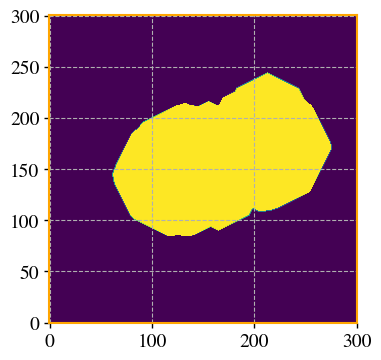

2025-06-24 00:47:39	WARN	componentlist::close	componentlist closed
2025-06-24 01:47:39 - INFO - Fitting image: /tmp/disk/LIRGI_Sample_done/for_spix/NGC7674/eM_C_VLA_Ku_Ka/Ka/im_nc3_cb_bs_0.06asec_NGC7674_A_Ka_sf_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r1.0-0002-image.cutout.CE.fits
2025-06-24 01:47:39 - DEBUG -  ==> Using provided mask region to constrain fit. 
2025-06-24 01:47:39 - WARNING -  !!++==> Fitting with a mask is faster, but experimental!! 
         Use with caution.
2025-06-24 01:47:39 - DEBUG - ---------------------------------------
2025-06-24 01:47:39 - DEBUG -  <<< PERFORMING CONVOLUTION WITH JAX >>> 
2025-06-24 01:47:39 - DEBUG - ---------------------------------------
2025-06-24 01:47:39 - DEBUG -  ==> Using provided RMS map. 


 ++==>> Limiting x0=152.63646045762187+/-5
 ++==>> Limiting y0=149.1034510688363+/-5
++==>> Fixing sersic index of component 1 to 0.5.
 ++==>> Limiting Rn_1 to 1.0
 ++==>> Limiting x0=171.5952544362878+/-5
 ++==>> Limiting y0=157.10506676648313+/-5
++==>> Fixing sersic index of component 2 to 0.5.
 ++==>> Limiting Rn_2 to 1.0
 ++==>> Limiting x0=128.283663476057+/-5
 ++==>> Limiting y0=146.5622038923163+/-5
++==>> Fixing sersic index of component 3 to 0.5.
 ++==>> Limiting x0=186.1710965346121+/-5
 ++==>> Limiting y0=165.16127649995528+/-5
++==>> Fixing sersic index of component 4 to 0.5.
 ++==>> Limiting x0=209.36359181405385+/-5
 ++==>> Limiting y0=175.22882460593718+/-5
++==>> Fixing sersic index of component 5 to 0.5.
 ++==>> Limiting Rn_5 to 1.0
 ++==>> Limiting x0=128.283663476057+/-50
 ++==>> Limiting y0=146.5622038923163+/-50
++==>> Fixing sersic index of component 6 to 0.5.
 ++==>> Limiting x0=209.36359181405385+/-50
 ++==>> Limiting y0=175.22882460593718+/-50
++==>> Fixing se

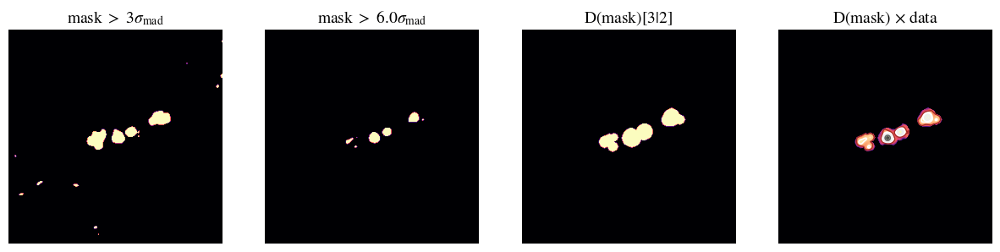

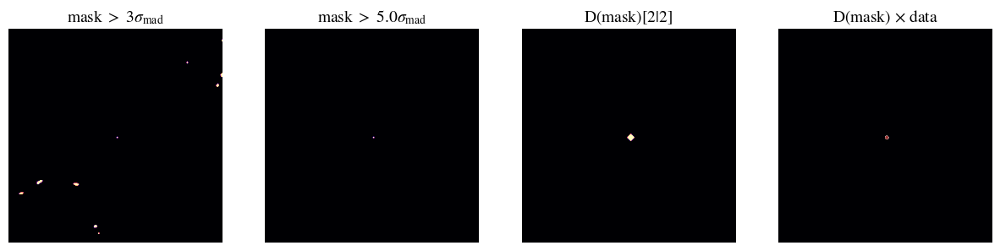

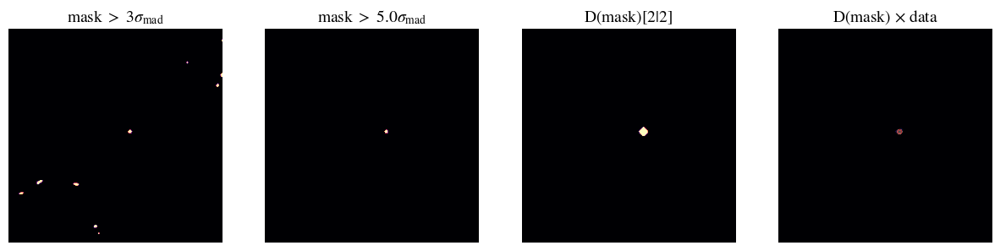

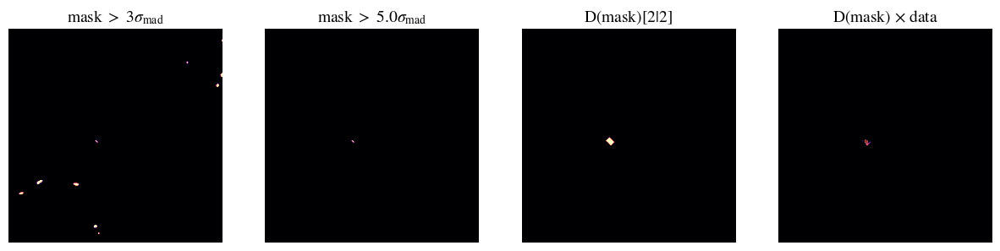

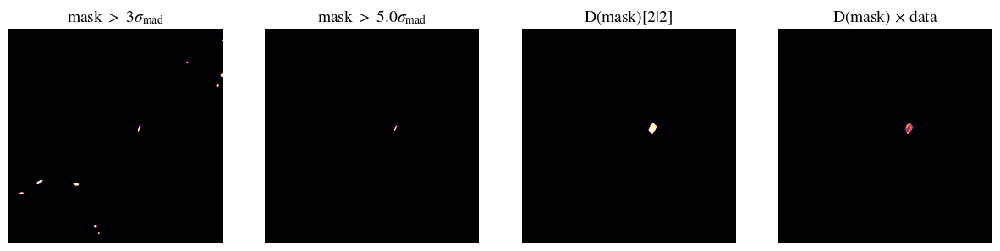

...

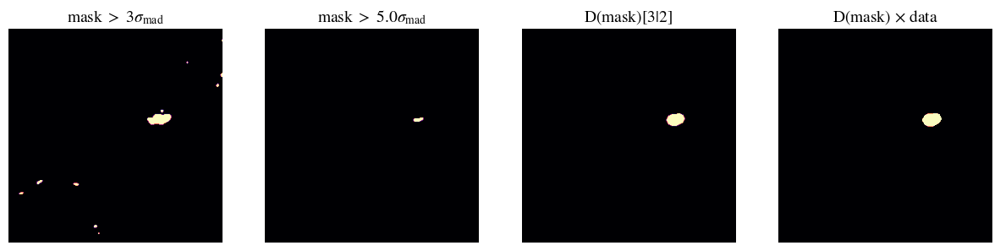

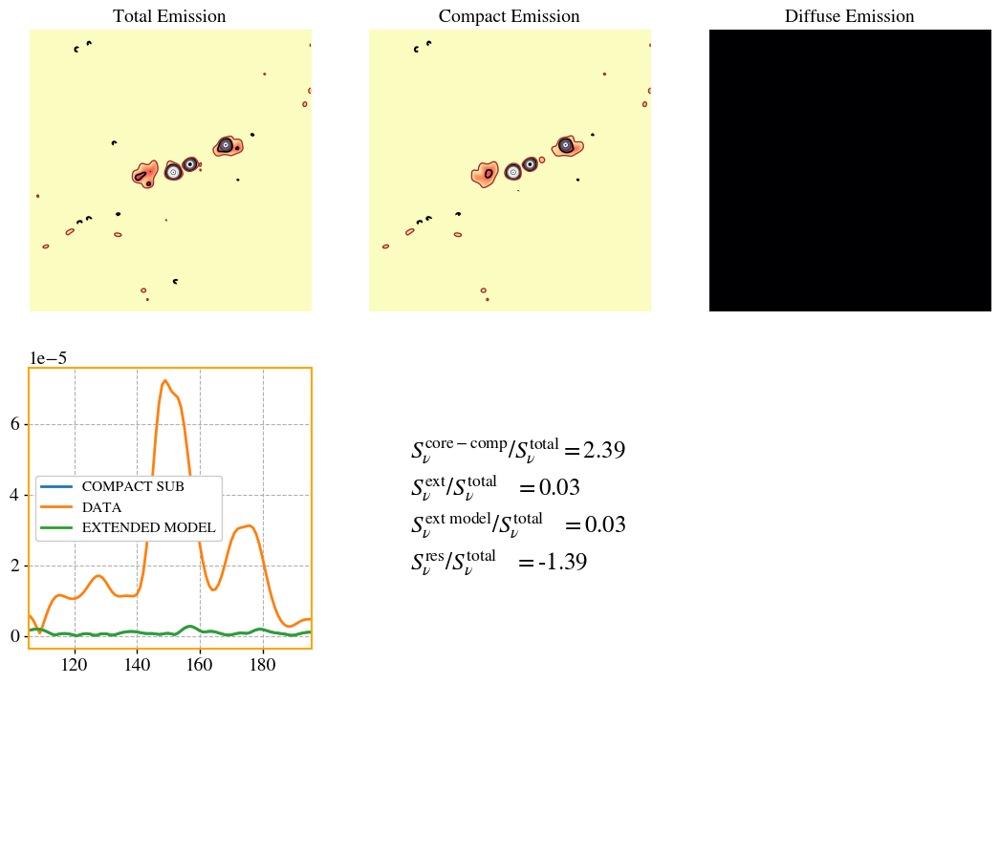

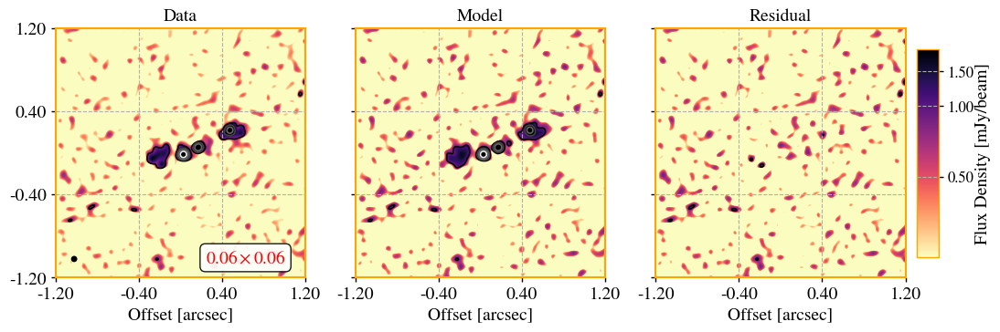

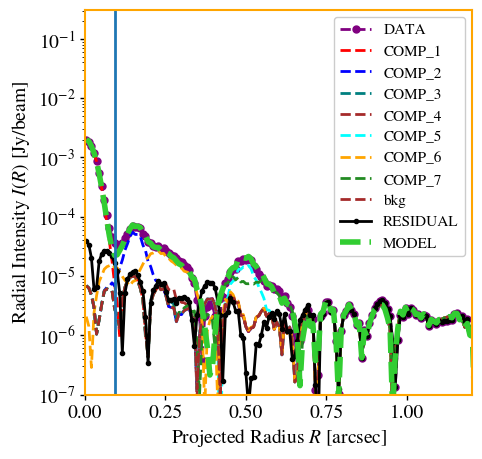

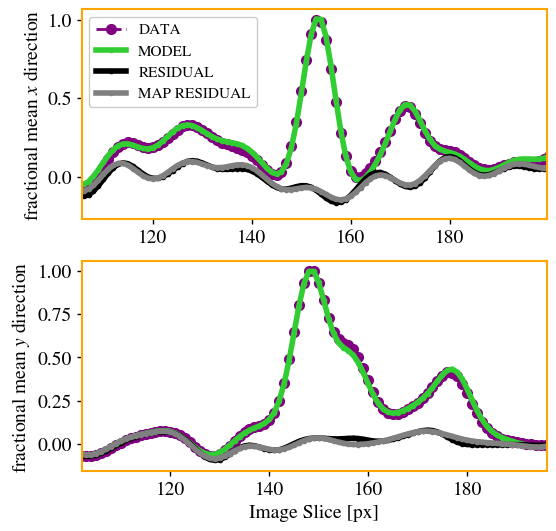

     -->> ERROR when computing Petrosian properties. Will flag error_petro as True.


2025-06-24 01:51:19 - INFO - +--------------------------------+
2025-06-24 01:51:19 - INFO - | Core-Compact Component Sizes |
2025-06-24 01:51:19 - INFO - +--------------------------------+
2025-06-24 01:51:20 - INFO -  >=> 1 px = 4.81 pc
2025-06-24 01:51:20 - INFO -  >=> Beam Size = 7.00 px
2025-06-24 01:51:20 - INFO -  >=> Beam Size = 33.64  pc
2025-06-24 01:51:20 - INFO -  >=> Rn Main Compact = 1.89  pc
2025-06-24 01:51:20 - INFO -  >=> major axis FWHM = 3.78  pc
2025-06-24 01:51:20 - INFO -  >=> C50 Compact Deconv Radii = 5.16  pc
2025-06-24 01:51:20 - INFO -  >=> C50 Compact Conv Radii = 39.12  pc
2025-06-24 01:51:20 - INFO -  >=> C95 Compact Deconv Radii = 18.72  pc
2025-06-24 01:51:20 - INFO -  >=> C95 Compact Conv Radii = 97.29  pc
2025-06-24 01:51:20 - INFO - +----------------------------+
2025-06-24 01:51:20 - INFO - | Extended Component Sizes |
2025-06-24 01:51:20 - INFO - +----------------------------+
2025-06-24 01:51:20 - INFO -  >=> C50 Extended Deconv Radii = 22.69  pc 

In [51]:
# reload_libs()
SMFR_results = []
ERRORS = []
FREQLIST = []
IMAGELIST_C = []
RESIDUALLIST_C = []
# smfr_init = None
for idx in range(len(imagelist_run)):
    try:
        input_data2=mp.read_data(filename=imagelist_run[idx],
                            residualname=residuallist_run[idx])
        # for idx in range(len(MFS_images_c)):
        #     input_data2=mp.read_data(filename=MFS_images_c[idx],
        #                         residualname=MFS_residuals_c[idx])
    
        rms_res = mlibs.mad_std(input_data2.residual_data_2D)
        data_res = input_data2.residual_data_2D.copy()
        data_res[np.where(data_res>rms_res)] = rms_res
    
        if smfr_init is None:
            if idx > 0:
                print('++==>> Using mini result from previous run.')
                init_mini_params_previous = SMFR_results[-1].result_mini.params
            else:
                print('++==>> Not using initial mini result.')
                init_mini_params_previous = None
        else:
            print('++==>> Using mini from initial mini run.')
            init_mini_params_previous = smfr_init.result_mini.params
            # if idx == 0:
            #     print('++==>> Using mini from initial mini run.')
            #     init_mini_params_previous = smfr_init.result_mini.params
            # else:
            #     print('++==>> Using mini result from previous run.')
            #     init_mini_params_previous = SMFR_results[-1].result_mini.params
    
        smfr = mp.sersic_multifit_radio(input_data2,
                                        SE, #source extraction object, from previous step
                                        convolution_mode='GPU',
                                        which_residual = 'user', #natural or shuffled (natural is experimental!)
                                        # bkg_rms_map = sep_bkg.back(),
                                        # bkg_rms_map=bkg.background,
                                        # bkg_rms_map = mlibs.shuffle_2D(data_res),is_rms_map_conv=False,
                                        bkg_rms_map = input_data2.residual_data_2D.copy(),is_rms_map_conv=True,
                                        mask=mask_region,
                                        mask_for_fit=mask,
                                        use_mask_for_fit=True,loss='cauchy',
                                        fix_geometry=fix_geometry, #for stability purposes, keep True for now. 
                                        comp_ids=comp_ids,# which component label is compact?
                                        dr_fix=dr_fix,#for each component, radial element size to fix (x0,y0) positions
                                        fix_value_n=fix_value_n,#for each component, the Sersic index value to be fixed. 
                                        fix_max_value_Rn = fix_max_value_Rn,
                                        # fix_min_value_Rn = True,
                                        fix_n=fix_n,#for each component, fix or not the Sersic index. 
                                        aspect='circular',#elliptical or circular gaussian for beam convolution? 
                                        parameters_mini_init = init_mini_params_previous,
                                        # method1='least_squares',
                                        # method2='nelder',
                                        # z = mlibs.find_z_NED('MCG+12-02-001')
                                         z = mlibs.find_z_NED(source_name),verbose=0,
                                       )
        SMFR_results.append(smfr)
        IMAGELIST_C.append(imagelist_run[idx])
        RESIDUALLIST_C.append(residuallist_run[idx])
        FREQLIST.append(frequencies[idx])
    except:
        ERRORS.append(imagelist_run[idx])
FREQLIST = np.asarray(FREQLIST)

In [52]:
SMFR_results[i].image_results_conv[-1]

'/tmp/disk/LIRGI_Sample_done/for_spix/NGC7674/eM_C_VLA_Ku_Ka/C/im_nc3_cb_bs_0.06asec_NGC7674_eM_C_sfc_ps_highres_C-Ku-Ka_1024x1024_0.008asec_multiscale__r0.0-0002-image.cutout.CE_residual.fits'


                                                          ..___|**_
                                                  .|||||||||*+@+*__*++.
                                              _||||.           .*+;].,#_
                                         _|||*_                _    .@@@#@.
                                   _|||||_               .@##@#| _||_
       Morphen                |****_                   .@.,/\..@_.
                             #///#+++*|    .       .@@@;#.,.\@.
                              .||__|**|||||*||*+@#];_.  ;,;_
 Geferson Lucatelli                            +\*_.__|**#
                                              |..      .]]
                                               ;@       @.*.
                                                #|       _;]];|.
                                                 ]_          _+;]@.
                                                 _/_             |]\|    .  _
                                              ...._@* __ .

/tmp/ipykernel_33704/610949205.py:2: DeprecationWarning: 'ctn' is deprecated and will be removed in a future version. Use 'load_fits_data' instead.
  centre = mlibs.nd.maximum_position(mlibs.ctn(imagelist_run[0]))[::-1]
/tmp/ipykernel_33704/610949205.py:15: DeprecationWarning: 'ctn' is deprecated and will be removed in a future version. Use 'load_fits_data' instead.
  rms=mlibs.mad_std(mlibs.ctn(residuallist_run[i])),
/tmp/ipykernel_33704/610949205.py:43: DeprecationWarning: 'ctn' is deprecated and will be removed in a future version. Use 'load_fits_data' instead.
  rms=mlibs.mad_std(mlibs.ctn(residuallist_run[i])),  # Assuming same rms or you can define different for model
/tmp/ipykernel_33704/610949205.py:71: DeprecationWarning: 'ctn' is deprecated and will be removed in a future version. Use 'load_fits_data' instead.
  rms=mlibs.mad_std(mlibs.ctn(residuallist_run[i])),  # Assuming same rms or you can define different for model
/tmp/ipykernel_33704/610949205.py:15: DeprecationWarning

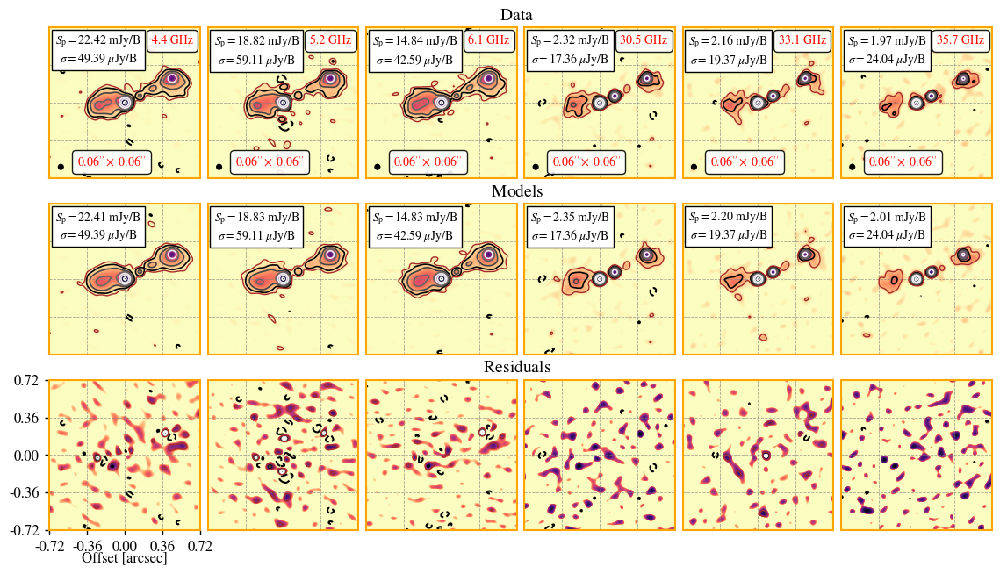

In [ ]:
# reload_libs()
centre = mlibs.nd.maximum_position(mlibs.ctn(imagelist_run[0]))[::-1]
fig, axes = mlibs.plt.subplots(3, len(imagelist_run), figsize=(18/1.3, (9+1)/1.3))  # 2 rows, len(imagelist_run) columns
# reload_libs()
for i in range(len(imagelist_run)):
    # First row: plot the image
    ax0 = axes[0, i]
    mlibs.eimshow(
        imagename=imagelist_run[i],
        # imagename=SMFR_results[i].image_results_conv[-2],
        center=centre,
        CM='magma_r',
        projection='offset',
        add_frequency=True,
        rms=mlibs.mad_std(mlibs.ctn(residuallist_run[i])),
        figsize=(4, 4), ax=ax0, fig=fig,
        crop=True, box_size=int(90), n_pts_labels=5,
        vmax_factor=1.0,vmin_factor=1.0,asinh_a=0.05,
        plot_rms=True, rms_text_size = 10,
        num_contours=6,cbar_n_points=6,
        add_beam = True
    )

    if i >= 0:
        # Turn off axis spines for images other than the first one in the first row
        # ax0.spines['left'].set_color('none')
        # ax0.spines['right'].set_color('none')
        # ax0.spines['top'].set_color('none')
        # ax0.spines['bottom'].set_color('none')
        ax0.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False)
        ax0.set_xlabel('')
        ax0.set_ylabel('')
    if i == 2:
        ax0.set_title(r'$\qquad\qquad\qquad\qquad\qquad\qquad$ Data')

    # Second row: plot the model
    ax1 = axes[1, i]
    mlibs.eimshow(
        imagename=SMFR_results[i].image_results_conv[-2],
        center=centre,
        CM='magma_r',
        projection='offset',
        rms=mlibs.mad_std(mlibs.ctn(residuallist_run[i])),  # Assuming same rms or you can define different for model
        figsize=(4, 4), ax=ax1, fig=fig,
        crop=True, box_size=int(90), n_pts_labels=5,
        vmax_factor=1.0,vmin_factor=1.0,asinh_a=0.05,
        plot_rms=True, rms_text_size = 10,
        num_contours=6,cbar_n_points=6,
    )
    
    if i >= 0:
        # Turn off axis spines for models other than the first one in the second row
        # ax1.spines['left'].set_color('none')
        # ax1.spines['right'].set_color('none')
        # ax1.spines['top'].set_color('none')
        # ax1.spines['bottom'].set_color('none')
        ax1.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False)
        ax1.set_xlabel('')
        ax1.set_ylabel('')
    if i == 2:
        ax1.set_title(r'$\qquad\qquad\qquad\qquad\qquad\qquad$ Models')

    # Third row: plot the residuals
    ax2 = axes[2, i]
    mlibs.eimshow(
        imagename=SMFR_results[i].image_results_conv[-1],
        center=centre,
        CM='magma_r',
        projection='offset',
        vmax_factor=1.0,vmin_factor=1.0,asinh_a=0.05,
        rms=mlibs.mad_std(mlibs.ctn(residuallist_run[i])),  # Assuming same rms or you can define different for model
        figsize=(4, 4), ax=ax2, fig=fig,
        crop=True, box_size=int(90), n_pts_labels=5,
    )
    
    if i >= 0:
        # Turn off axis spines for models other than the first one in the second row
        # ax2.spines['left'].set_color('none')
        # ax2.spines['right'].set_color('none')
        # ax2.spines['top'].set_color('none')
        # ax2.spines['bottom'].set_color('none')
        ax2.tick_params(left=False, labelleft=False, bottom=False, labelbottom=False)
        ax2.set_xlabel('')
        ax2.set_ylabel('')
    if i == 2:
        ax2.set_title(r'$\qquad\qquad\qquad\qquad\qquad\qquad$ Residuals')

axes[2, 0].set_xlabel('Offset [arcsec]',fontsize=12)
axes[2, 0].tick_params(left=True, labelleft=True, bottom=True, labelbottom=True)
axes[2, 0].tick_params(axis='both', which='major', labelsize=12)
mlibs.plt.subplots_adjust(wspace=0.05, hspace=0.05)
mlibs.plt.savefig('high_res_results/grid_of_data_models_C_Ka.pdf', dpi=600,
                    bbox_inches='tight')
mlibs.plt.show()



In [85]:
for i in range(len(SMFR_results)):
    print(f"Rn Compact @ {(frequencies[i]/1e9):.1f} GHz= {SMFR_results[i].lmfit_results[0]['f1_Rn'].value:.1f} +/- "\
          f"{SMFR_results[i].lmfit_results[0]['f1_Rn'].stderr:.1f} [px]")

Rn Compact @ 4.4 GHz= 0.7 +/- 0.1 [px]
Rn Compact @ 5.2 GHz= 0.7 +/- 0.3 [px]
Rn Compact @ 6.1 GHz= 0.6 +/- 0.2 [px]
Rn Compact @ 13.0 GHz= 0.7 +/- 0.1 [px]
Rn Compact @ 15.0 GHz= 0.6 +/- 0.1 [px]
Rn Compact @ 17.0 GHz= 0.6 +/- 0.3 [px]
Rn Compact @ 30.5 GHz= 0.4 +/- 0.6 [px]
Rn Compact @ 33.1 GHz= 0.4 +/- 0.4 [px]
Rn Compact @ 35.7 GHz= 0.4 +/- 0.8 [px]


In [86]:
for i in range(len(SMFR_results)):
    print(f"Rn Compact @ {(frequencies[i]/1e9):.1f} GHz= {SMFR_results[i].lmfit_results[0]['f2_Rn'].value:.1f} +/- "\
          f"{SMFR_results[i].lmfit_results[0]['f2_Rn'].stderr:.1f} [px]")

Rn Compact @ 4.4 GHz= 0.9 +/- 0.5 [px]
Rn Compact @ 5.2 GHz= 1.0 +/- 0.8 [px]
Rn Compact @ 6.1 GHz= 1.0 +/- 0.4 [px]
Rn Compact @ 13.0 GHz= 0.7 +/- 0.4 [px]
Rn Compact @ 15.0 GHz= 0.7 +/- 0.4 [px]
Rn Compact @ 17.0 GHz= 0.9 +/- 0.4 [px]
Rn Compact @ 30.5 GHz= 0.9 +/- 0.5 [px]
Rn Compact @ 33.1 GHz= 1.0 +/- 0.6 [px]
Rn Compact @ 35.7 GHz= 0.9 +/- 0.5 [px]
